In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import boxcox
from scipy.stats import skew
from scipy.stats import randint
from scipy.stats import uniform
from scipy import stats
import statsmodels.stats.api as sms


from xgboost import XGBRegressor

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Lasso, ElasticNet, Ridge, ElasticNetCV
from sklearn.kernel_ridge import KernelRidge
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import make_scorer 
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.impute import SimpleImputer

# neural networks
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras import regularizers

from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import RidgeClassifier
from sklearn import preprocessing
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso

from sklearn.linear_model import LassoCV
from yellowbrick.regressor import PredictionError

# ignore Deprecation Warning
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

pd.set_option("display.max_rows", 200)

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


In [2]:
#Import data
input_file = "WMH_NAWM_116_nocoord_noNorm.csv"
df = pd.read_csv(input_file)
df_num = df._get_numeric_data()

print("Number of rows in data =",df.shape[0])
print("Number of columns in data =",df.shape[1])
print("\n")
print("**Sample data:**")
df.head()


Number of rows in data = 4163
Number of columns in data = 1895


**Sample data:**


/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (14,15,16,17,18,19,20) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,ID,Age,Sex,HTN,DM,AF,CAD,Smoking_ever,Prior_stroke,Brain_volume,...,wavelet3-LL_gldm_LargeDependenceLowGrayLevelEmphasis,wavelet3-LL_gldm_LowGrayLevelEmphasis,wavelet3-LL_gldm_SmallDependenceEmphasis,wavelet3-LL_gldm_SmallDependenceHighGrayLevelEmphasis,wavelet3-LL_gldm_SmallDependenceLowGrayLevelEmphasis,wavelet3-LL_ngtdm_Busyness,wavelet3-LL_ngtdm_Coarseness,wavelet3-LL_ngtdm_Complexity,wavelet3-LL_ngtdm_Contrast,wavelet3-LL_ngtdm_Strength
0,100000001,60.052019,0,1,1,0,0,0,0,1889.641468,...,8.829282,0.138446,0.021684,0.149522,0.003683,527.839737,0.000091,1.089015,0.001439,0.000964
1,100000003,71.000000,1,1,0,0,0,0,0,1404.218582,...,8.743617,0.138837,0.021418,0.148993,0.003611,402.179258,0.000120,1.070461,0.001435,0.001264
2,100000005,80.000000,1,1,1,0,0,0,0,1180.874158,...,8.966454,0.147239,0.023129,0.155381,0.004048,597.670816,0.000117,0.765878,0.003530,0.000683
3,100000006,81.000000,1,1,0,0,0,1,0,1197.623311,...,8.821405,0.146222,0.023178,0.154733,0.004083,536.162870,0.000129,0.718352,0.003260,0.000747
4,100000007,74.000000,0,1,0,0,1,1,0,1545.277806,...,8.711348,0.137297,0.021177,0.147621,0.003558,606.855348,0.000107,0.622543,0.002283,0.000617


In [3]:
#Import data
full_phenotype = "included_withclinical.csv"
full_phenotype_df = pd.read_csv(full_phenotype)
full_phenotype_df.head()

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (2,3,8,12,14,15,16,23,27,28,30,31,32,33,34,35,37,39,41,43,44,49,50,51,54,55,73,74,76,84,85,89,90,95,100,113,114,116,117,119,158,159,160,161,163,164,165,171,182,197,200,201,206,210,211,212,221,222,226,227) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Subject_ID,included,ACALeftOcclusion,ACARightOcclusion,AF,ANY_Infratentorial_LEFT,ANY_Infratentorial_lesion,ANY_Infratentorial_lesion_RIGHT,ANY_PCA,ANY_PCA_LEFT,...,WASHU_MASTER_confirmed_stroke,WASHU_MASTER_notes,WASHU_MASTER_prior_CVA,WMHV,WMH_outlier,WMH_volume,WMHv6,WMHv_auto,WMHv_man,Wmh_methods_paper
0,100000001,1,Open,Open,0.0,0.0,1.0,1.0,0,0.0,...,NaN,NaN,NaN,NaN,0,12.459944,NaN,12.459945,NaN,1.0
1,100000003,1,Open,Open,0.0,0.0,0.0,0.0,0,0.0,...,NaN,NaN,NaN,NaN,0,39.192430,39.192425,39.192425,NaN,1.0
2,100000005,1,Open,Open,0.0,1.0,1.0,0.0,0,0.0,...,NaN,NaN,NaN,NaN,0,29.662121,29.662117,29.662117,NaN,1.0
3,100000006,1,Open,Open,0.0,0.0,0.0,0.0,0,0.0,...,NaN,NaN,NaN,NaN,0,8.353831,8.353831,8.353831,NaN,1.0
4,100000007,1,Open,Open,0.0,0.0,0.0,0.0,0,0.0,...,NaN,NaN,NaN,NaN,0,5.857984,5.857983,5.857983,NaN,1.0


In [4]:
outcomes_SH = 'MRIGENIE_VRF_NIHSS_triMRS_3m_6m.csv'
outcomes_SH_df = pd.read_csv(outcomes_SH)
outcomes_SH_df = outcomes_SH_df.drop('Unnamed: 0',axis=1).set_index('ID')

In [5]:
full_phenotype_df = full_phenotype_df.set_index('Subject_ID')
NIHSS_df = full_phenotype_df.NIHSS

In [6]:
NIHSS_df_noNa = NIHSS_df.dropna()

In [7]:
NIHSS_df_noNa

Subject_ID
304085501      3.0
304985271      3.0
306808367      1.0
306862528      6.0
307879933      5.0
              ... 
4400001641     1.0
4400001643     0.0
4400001651    10.0
4400001652     1.0
4400001654     1.0
Name: NIHSS, Length: 2234, dtype: float64

In [8]:
X = df_num.drop(['ID','Label',
'WMH_volume',
'WMH_Bvadj',
'Brain_volume',
'Ventricle_volume',
'No_csf_brain_vol',
#'AF',
#'Age',
#'DM',
#'HTN',
#'CAD',
#'Sex',
#'Smoking_ever',
                 ],axis = 1)

# Dropping surface and volume confounding variables
#X = X.drop(X.filter(regex='_Surface').columns, axis=1)
#X = X.drop(X.filter(regex='_Voxel').columns, axis=1)
#X = X.drop(X.filter(regex='_Volume').columns, axis=1)
#X = X.drop(X.filter(regex='_shape').columns, axis=1)


#Selecting filtered variables
#X = X.drop(X.filter(regex='wavelet2').columns, axis=1)
#X = X.drop(X.filter(regex='wavelet3').columns, axis=1)

#X = X.drop(X.filter(regex='lbp').columns, axis=1)
X = X.drop(X.filter(regex='gradient').columns, axis=1)
X = X.drop(X.filter(regex='exponential').columns, axis=1)
X = X.drop(X.filter(regex='logarithm').columns, axis=1)
X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='square').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-1-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-3-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma').columns, axis=1)

X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='original').columns, axis=1)
#X = X.drop(X.filter(regex='diagnostics').columns, axis=1)
   

# Dropping heavily volume confounded variables
#X = X.drop(X.filter(regex='_RootMeanSquared').columns, axis=1)
#X = X.drop(X.filter(regex='_Energy').columns, axis=1)
#X = X.drop(X.filter(regex='_TotalEnergy').columns, axis=1)
#X = X.drop(X.filter(regex='_Coarseness').columns, axis=1)
#X = X.drop(X.filter(regex='Emphasis').columns, axis=1)
#X = X.drop(X.filter(regex='Uniformity').columns, axis=1)
#X = X.drop(X.filter(regex='Strength').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='ZoneVariance').columns, axis=1)
#X = X.drop(X.filter(regex='Busyness').columns, axis=1)


#X = X.drop(X.filter(regex='firstorder').columns, axis=1)
#X = X.drop(X.filter(regex='glcm').columns, axis=1)
#X = X.drop(X.filter(regex='gldm').columns, axis=1)
#X = X.drop(X.filter(regex='ngtdm').columns, axis=1)
#X = X.drop(X.filter(regex='glrlm').columns, axis=1)
#X = X.drop(X.filter(regex='glszm').columns, axis=1)

#X = X.drop(X.filter(regex='Volume').columns, axis=1)

#X = X.drop(X.filter(regex='Maximum').columns, axis=1)
##X = X.drop(X.filter(regex='Sphericity').columns, axis=1)
#X = X.drop(X.filter(regex='Length').columns, axis=1)
#X = X.drop(X.filter(regex='Elongation').columns, axis=1)
#X = X.drop(X.filter(regex='Flatness').columns, axis=1)




y = df_num.WMH_Bvadj
for var in X:
    print(var)
print(X.shape)

Age
Sex
HTN
DM
AF
CAD
Smoking_ever
Prior_stroke
diagnostics_Image-original_Mean
diagnostics_Image-original_Minimum
diagnostics_Image-original_Maximum
diagnostics_Mask-original_VoxelNum
diagnostics_Mask-original_VolumeNum
diagnostics_Image-interpolated_Mean
diagnostics_Image-interpolated_Minimum
diagnostics_Image-interpolated_Maximum
diagnostics_Mask-interpolated_VoxelNum
diagnostics_Mask-interpolated_VolumeNum
diagnostics_Mask-interpolated_Mean
diagnostics_Mask-interpolated_Minimum
diagnostics_Mask-interpolated_Maximum
original_shape_Elongation
original_shape_Flatness
original_shape_LeastAxisLength
original_shape_MajorAxisLength
original_shape_Maximum2DDiameterColumn
original_shape_Maximum2DDiameterRow
original_shape_Maximum2DDiameterSlice
original_shape_Maximum3DDiameter
original_shape_MeshVolume
original_shape_MinorAxisLength
original_shape_Sphericity
original_shape_SurfaceArea
original_shape_SurfaceVolumeRatio
original_shape_VoxelVolume
original_firstorder_10Percentile
original_firs

In [9]:
df_num.WMH_volume.describe()

count    4163.000000
mean        8.568140
std        11.217209
min         0.001984
25%         1.391192
50%         4.190285
75%        11.212255
max        82.098237
Name: WMH_volume, dtype: float64

In [10]:
for var in df_num:
    print(var)

ID
Age
Sex
HTN
DM
AF
CAD
Smoking_ever
Prior_stroke
Brain_volume
No_csf_brain_vol
Ventricle_volume
WMH_Bvadj
WMH_volume
Label
diagnostics_Image-original_Mean
diagnostics_Image-original_Minimum
diagnostics_Image-original_Maximum
diagnostics_Mask-original_VoxelNum
diagnostics_Mask-original_VolumeNum
diagnostics_Image-interpolated_Mean
diagnostics_Image-interpolated_Minimum
diagnostics_Image-interpolated_Maximum
diagnostics_Mask-interpolated_VoxelNum
diagnostics_Mask-interpolated_VolumeNum
diagnostics_Mask-interpolated_Mean
diagnostics_Mask-interpolated_Minimum
diagnostics_Mask-interpolated_Maximum
original_shape_Elongation
original_shape_Flatness
original_shape_LeastAxisLength
original_shape_MajorAxisLength
original_shape_Maximum2DDiameterColumn
original_shape_Maximum2DDiameterRow
original_shape_Maximum2DDiameterSlice
original_shape_Maximum3DDiameter
original_shape_MeshVolume
original_shape_MinorAxisLength
original_shape_Sphericity
original_shape_SurfaceArea
original_shape_SurfaceVolumeRa

wavelet2-LH_firstorder_RootMeanSquared
wavelet2-LH_firstorder_Skewness
wavelet2-LH_firstorder_TotalEnergy
wavelet2-LH_firstorder_Uniformity
wavelet2-LH_firstorder_Variance
wavelet2-LH_glcm_Autocorrelation
wavelet2-LH_glcm_JointAverage
wavelet2-LH_glcm_ClusterProminence
wavelet2-LH_glcm_ClusterShade
wavelet2-LH_glcm_ClusterTendency
wavelet2-LH_glcm_Contrast
wavelet2-LH_glcm_Correlation
wavelet2-LH_glcm_DifferenceAverage
wavelet2-LH_glcm_DifferenceEntropy
wavelet2-LH_glcm_DifferenceVariance
wavelet2-LH_glcm_JointEnergy
wavelet2-LH_glcm_JointEntropy
wavelet2-LH_glcm_Imc1
wavelet2-LH_glcm_Imc2
wavelet2-LH_glcm_Idm
wavelet2-LH_glcm_Idmn
wavelet2-LH_glcm_Id
wavelet2-LH_glcm_Idn
wavelet2-LH_glcm_InverseVariance
wavelet2-LH_glcm_MaximumProbability
wavelet2-LH_glcm_SumEntropy
wavelet2-LH_glcm_SumSquares
wavelet2-LH_glrlm_GrayLevelNonUniformity
wavelet2-LH_glrlm_GrayLevelNonUniformityNormalized
wavelet2-LH_glrlm_GrayLevelVariance
wavelet2-LH_glrlm_HighGrayLevelRunEmphasis
wavelet2-LH_glrlm_LongR

split an external set to select features before testing prediction

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   20.4s finished


alpha in fold 0: 0.001444587448286327
selected features: 155/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    4.6s finished


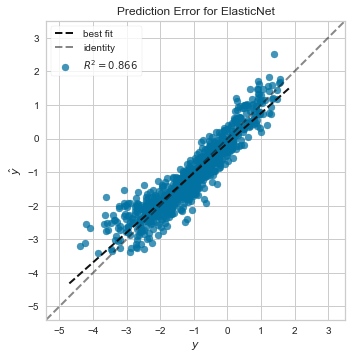

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   17.2s finished


alpha in fold 1: 0.0014360772157965918
selected features: 148/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.5s finished


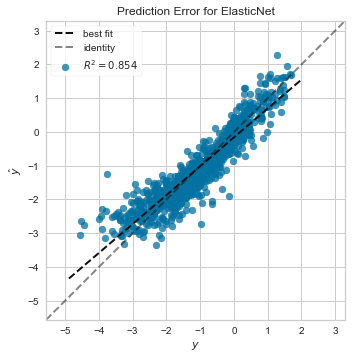

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   17.7s finished


alpha in fold 2: 0.001442652412050274
selected features: 151/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.1s finished


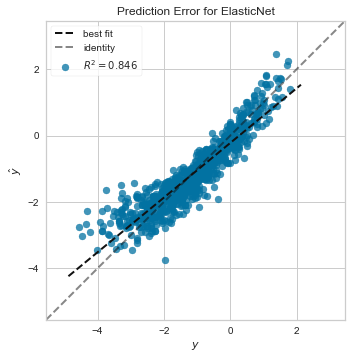

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   15.9s finished


alpha in fold 3: 0.0014030681348325307
selected features: 159/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.2s finished


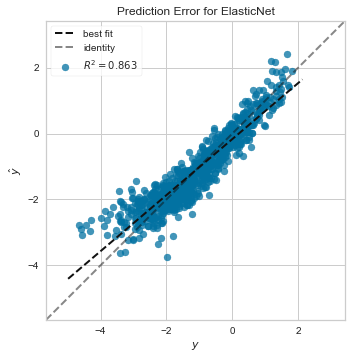

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   18.9s finished


alpha in fold 4: 0.00142134290164403
selected features: 148/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    4.2s finished


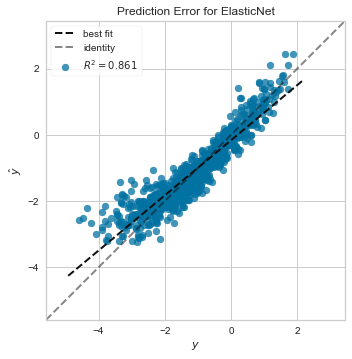

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   17.2s finished


alpha in fold 5: 0.001460092490938528
selected features: 146/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.4s finished


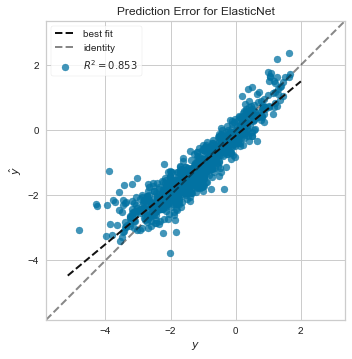

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   21.6s finished


alpha in fold 6: 0.0014254480747880592
selected features: 146/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    4.6s finished


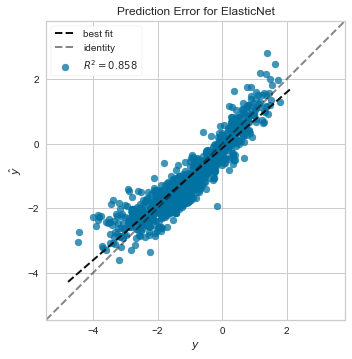

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   18.6s finished


alpha in fold 7: 0.0014515252044205753
selected features: 146/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.0s finished


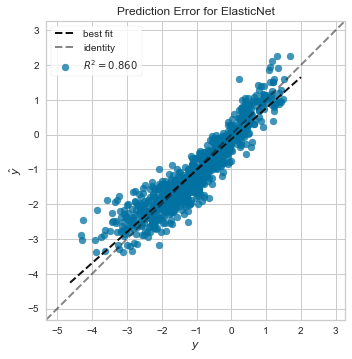

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   17.1s finished


alpha in fold 8: 0.0013960295529086173
selected features: 154/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.5s finished


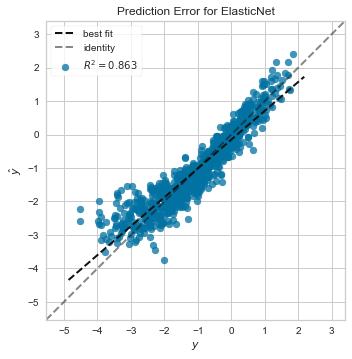

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   15.8s finished


alpha in fold 9: 0.001413433516691301
selected features: 150/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    6.6s finished


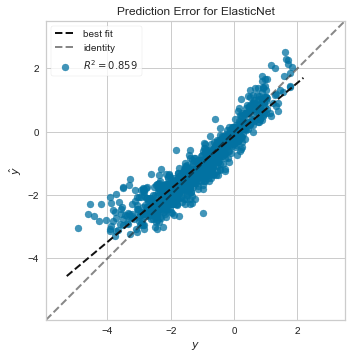

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   18.2s finished


alpha in fold 10: 0.001431049005668529
selected features: 153/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.5s finished


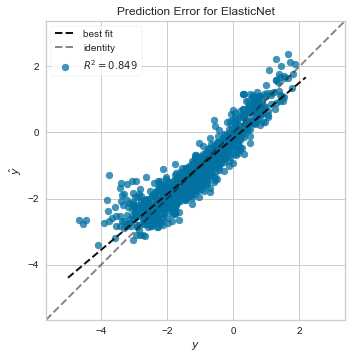

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   18.9s finished


alpha in fold 11: 0.0014077829479859152
selected features: 150/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    4.0s finished


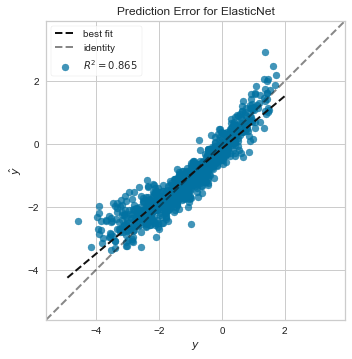

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   19.3s finished


alpha in fold 12: 0.00165895778036434
selected features: 151/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.1s finished


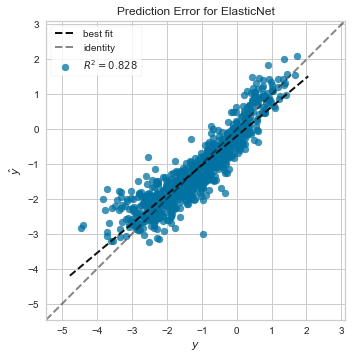

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   17.3s finished


alpha in fold 13: 0.001446449613638642
selected features: 146/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    3.8s finished


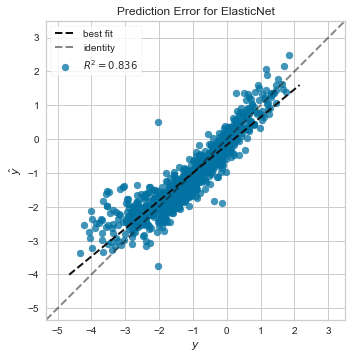

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   20.4s finished


alpha in fold 14: 0.0014382341757069362
selected features: 155/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    4.8s finished


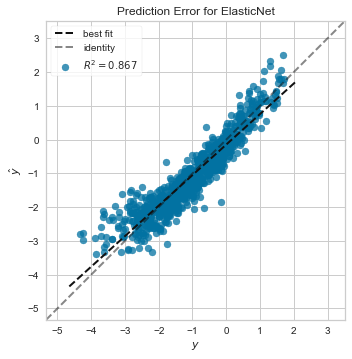

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   19.7s finished


alpha in fold 15: 0.0014437995302112633
selected features: 155/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.7s finished


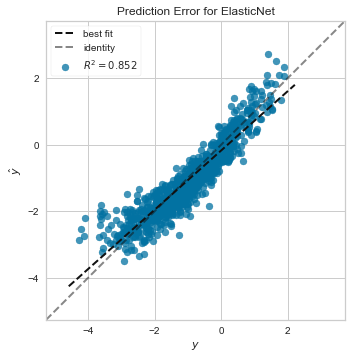

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   17.9s finished


alpha in fold 16: 0.001406514666550235
selected features: 152/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.8s finished


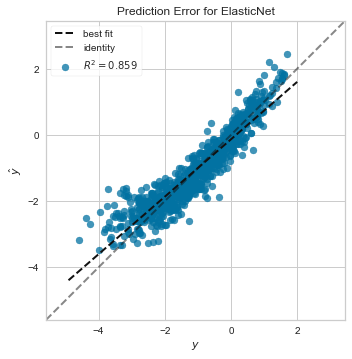

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   21.0s finished


alpha in fold 17: 0.0014148477686130004
selected features: 150/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.3s finished


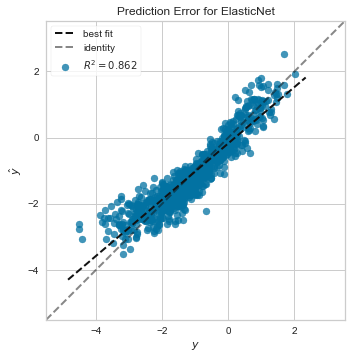

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   18.7s finished


alpha in fold 18: 0.001368371031956539
selected features: 148/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    6.2s finished


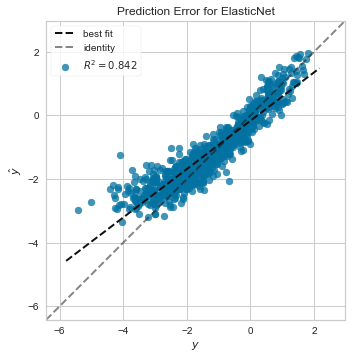

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   18.8s finished


alpha in fold 19: 0.0015183136111536777
selected features: 142/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    3.8s finished


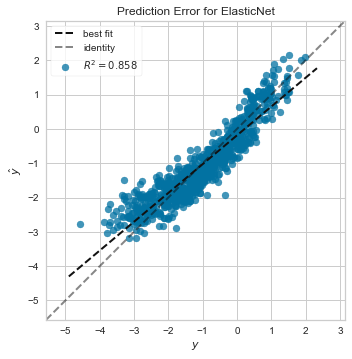

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   19.2s finished


alpha in fold 20: 0.0014481181415003522
selected features: 156/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.7s finished


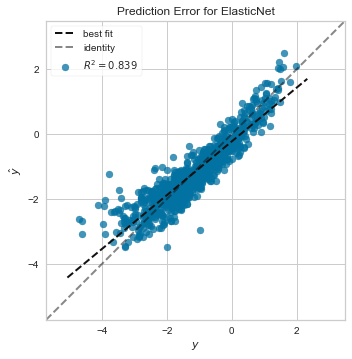

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   19.8s finished


alpha in fold 21: 0.001397429847206031
selected features: 152/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.2s finished


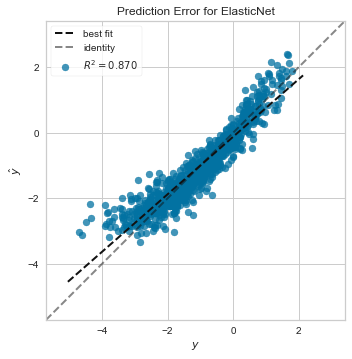

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   20.0s finished


alpha in fold 22: 0.0014463158240082886
selected features: 153/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.4s finished


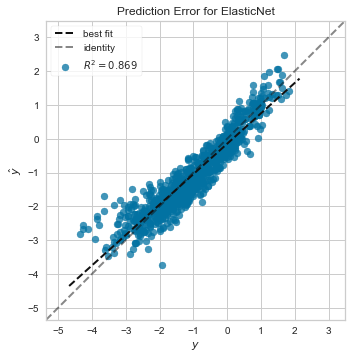

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   19.1s finished


alpha in fold 23: 0.0014194149965539515
selected features: 150/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.9s finished


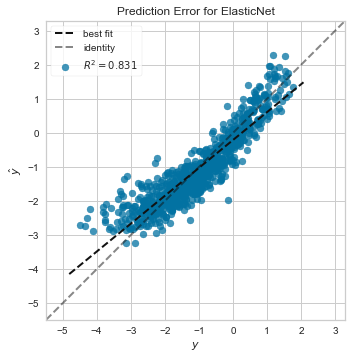

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   21.6s finished


alpha in fold 24: 0.0014549264501219795
selected features: 150/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.3s finished


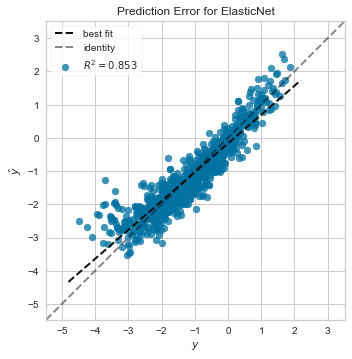

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   15.5s finished


alpha in fold 25: 0.001433866834435068
selected features: 147/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.3s finished


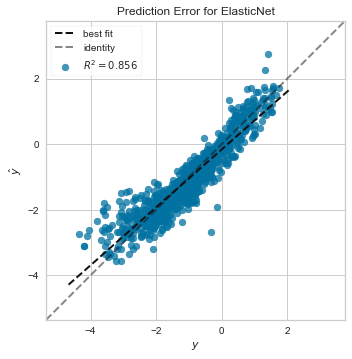

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   17.9s finished


alpha in fold 26: 0.0014042131379687882
selected features: 152/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.3s finished


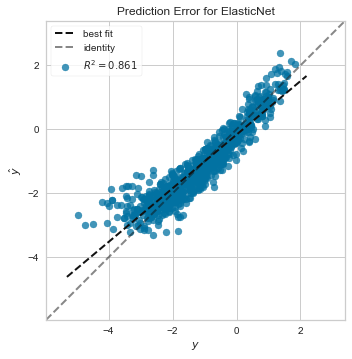

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   18.2s finished


alpha in fold 27: 0.0014136542692454763
selected features: 145/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    4.8s finished


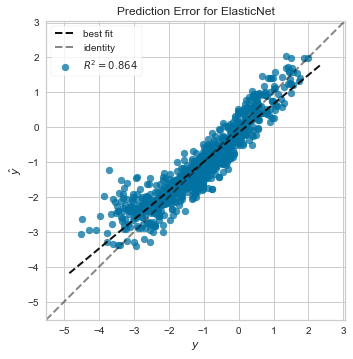

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   18.7s finished


alpha in fold 28: 0.0014550527752625391
selected features: 146/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    3.9s finished


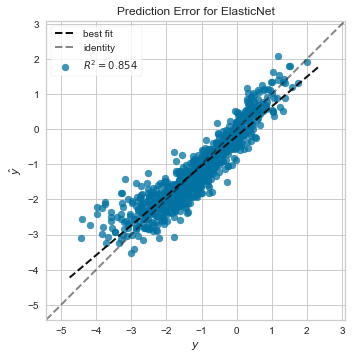

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:   18.7s finished


alpha in fold 29: 0.001422012903524953
selected features: 150/755 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    3.8s finished


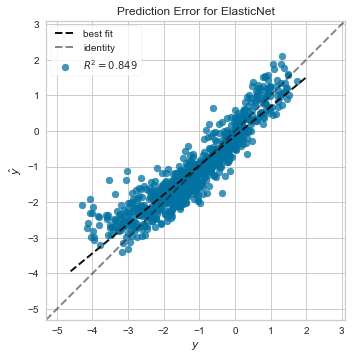

In [11]:
X = df_num.drop([#'ID',
                 'Label',
'Age',
'Sex',
'HTN',
'DM',
'AF',
'CAD',
'Smoking_ever',
'Prior_stroke',
'Brain_volume',
'No_csf_brain_vol',
'Ventricle_volume',
'WMH_Bvadj',
'WMH_volume',
                 ],axis = 1)

# Dropping surface and volume confounding variables
#X = X.drop(X.filter(regex='_Surface').columns, axis=1)
#X = X.drop(X.filter(regex='_Voxel').columns, axis=1)
#X = X.drop(X.filter(regex='_Volume').columns, axis=1)
#X = X.drop(X.filter(regex='_shape').columns, axis=1)


#Selecting filtered variables
X = X.drop(X.filter(regex='wavelet2').columns, axis=1)
X = X.drop(X.filter(regex='wavelet3').columns, axis=1)

#X = X.drop(X.filter(regex='lbp').columns, axis=1)
X = X.drop(X.filter(regex='gradient').columns, axis=1)
X = X.drop(X.filter(regex='exponential').columns, axis=1)
X = X.drop(X.filter(regex='logarithm').columns, axis=1)
X = X.drop(X.filter(regex='squareroot').columns, axis=1)
X = X.drop(X.filter(regex='square').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-1-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-3-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma').columns, axis=1)

X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='original').columns, axis=1)
#X = X.drop(X.filter(regex='diagnostics').columns, axis=1)
   

# Dropping heavily volume confounded variables
#X = X.drop(X.filter(regex='_RootMeanSquared').columns, axis=1)
#X = X.drop(X.filter(regex='_Energy').columns, axis=1)
#X = X.drop(X.filter(regex='_TotalEnergy').columns, axis=1)
#X = X.drop(X.filter(regex='_Coarseness').columns, axis=1)
#X = X.drop(X.filter(regex='Emphasis').columns, axis=1)
#X = X.drop(X.filter(regex='Uniformity').columns, axis=1)
#X = X.drop(X.filter(regex='Strength').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='ZoneVariance').columns, axis=1)
#X = X.drop(X.filter(regex='Busyness').columns, axis=1)


#X = X.drop(X.filter(regex='firstorder').columns, axis=1)
#X = X.drop(X.filter(regex='glcm').columns, axis=1)
#X = X.drop(X.filter(regex='gldm').columns, axis=1)
#X = X.drop(X.filter(regex='ngtdm').columns, axis=1)
#X = X.drop(X.filter(regex='glrlm').columns, axis=1)
#X = X.drop(X.filter(regex='glszm').columns, axis=1)

#X = X.drop(X.filter(regex='Volume').columns, axis=1)

#X = X.drop(X.filter(regex='Maximum').columns, axis=1)
##X = X.drop(X.filter(regex='Sphericity').columns, axis=1)
#X = X.drop(X.filter(regex='Length').columns, axis=1)
#X = X.drop(X.filter(regex='Elongation').columns, axis=1)
#X = X.drop(X.filter(regex='Flatness').columns, axis=1)




y = df_num.WMH_Bvadj

columns_names = X.columns.drop('ID')

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
#scaler = RobustScaler()
scaler=StandardScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64)
y_pred_total_both=[]
y_total_both =[]
r2_total_both=[]
index_total = []
all_selected_features =[]
coefs_both=pd.DataFrame(index=df_num.columns)

repeated=30
for i in range(repeated):
    #split train test
    
    y_len = y.shape[-1]
    bins = np.linspace(0, y_len, 50)
    y_binned = np.digitize(y, bins)
    X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20, random_state=i,stratify=y_binned)

    y_len2 = y_training.shape[-1]
    bins2 = np.linspace(0, y_len, 50)
    y_binned2 = np.digitize(y_training, bins)
    X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=0,stratify=y_binned2)

    #set index 
    X_training=X_training.set_index('ID')
    X_test=X_test.set_index('ID')
    X_final=X_final.set_index('ID')
    index_training=X_training.index
    index_test = X_test.index
    index_final = X_final.index
    
    #impute data
    X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names,index=index_training)
    X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names,index= index_test)
    X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names,index=index_final)
    #box cox transform y
    y_training, _ = stats.boxcox(y_training)
    y_test, _ = stats.boxcox(y_test)
    y_final, _ = stats.boxcox(y_final)
    

    #scale units     
    X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names,index=index_training)
    X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names,index=index_test)
    X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names,index=index_final)

    
    #feature selection using ElasticNetCV
    lassoCV.fit(X_training,y_training)
    selector = SelectFromModel(lassoCV,prefit=True)
    print('alpha in fold {0}: {1}'.format(i,lassoCV.alpha_))
    selected_feat = X_training.columns[(selector.get_support())]
    all_selected_features.append(selected_feat)
    print('selected features: {0}/{1} total number of features'.format(len(selected_feat),(X_training.shape[1])))
    X_training_sel = X_training.filter(selected_feat)
    X_test_sel = X_test.filter(selected_feat)
    X_final_sel = X_final.filter(selected_feat)
    
          #tuning on test set
    LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64).fit(X_test_sel,y_test)
    alpha_tuned=LassoCV_tuning.alpha_
    l1_ratio_tuned=LassoCV_tuning.l1_ratio_
    
    lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
    lasso_reg.fit(X_training_sel, y_training)
          
          #scoring on final set
    visualizer = PredictionError(lasso_reg)
    visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
    visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
    visualizer.show() 
    
    #prepare plots
    y_pred_infold=lasso_reg.predict(X_final_sel)
    ID_pred_infold=index_final
    index_total.extend(index_final)
    y_pred_total_both.extend(y_pred_infold)
    y_total_both.extend(y_final)
    r2_total_both.append(visualizer.score_)  
    
    #prepare coefs
    counter=[i]
    coef_infold=pd.DataFrame(lasso_reg.coef_,index=X_training_sel.columns,columns=counter)
    coefs_both=coefs_both.join(coef_infold)

coefs_both_nona=coefs_both.dropna().T
r2_total_both=np.array(r2_total_both)
    

In [ ]:
#Add analysis per center (hold one center out)

In [11]:
#Import data
input_site_name = "ID_site_name.csv"
df_site_name = pd.read_csv(input_site_name)
df_site_name.columns=['ID','Site']
df_site_name=df_site_name.set_index('ID')
print(df_site_name.shape)
df_site_name.head()

(6627, 1)


,Site
ID,
702505000,GEOS
702524000,GEOS
702581000,GEOS
702590000,GEOS
702598000,GEOS


In [12]:
y = df_num.set_index('ID').WMH_Bvadj

for site in X_site.Site.unique():
    site_list=list(X_site.Site.unique())
    site_list.remove(site)
    X_training=X_site[X_site['Site'].isin(site_list)].drop('Site',axis=1)
    X_test=X_site[~X_site['Site'].isin(site_list)].drop('Site',axis=1)
    y_training=y[y.index.isin(X_training.index)]
    y_test = y[y.index.isin(X_test.index)]
    print(X_training.columns)


NameError: name 'X_site' is not defined

--------------------------------------------------
repetition number 0
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.8s remaining:    8.6s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.7s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.3s
..................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.1s finished


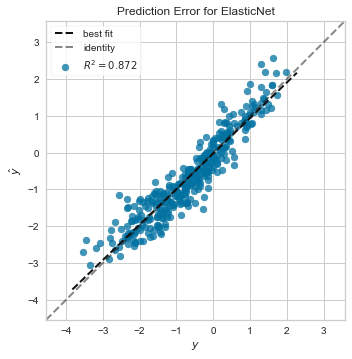

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.8s remaining:    8.7s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.2s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.7s remaining:    1.0s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    0.8s finished


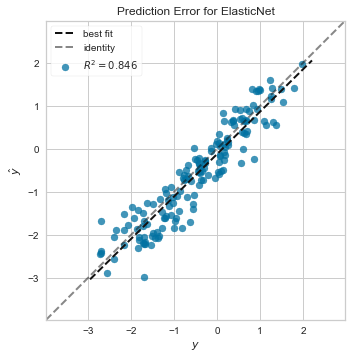

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.8s remaining:    8.6s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.9s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


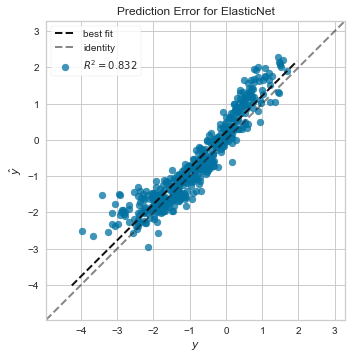

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.9s remaining:    7.4s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.2s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


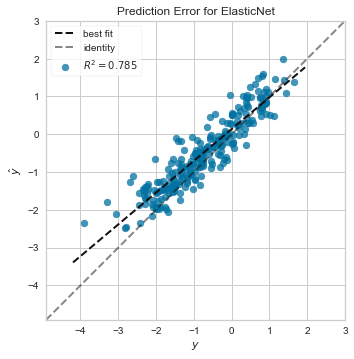

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.8s remaining:    7.3s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.2s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


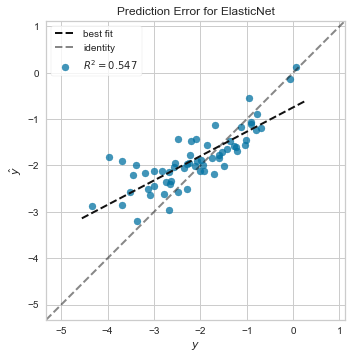

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.0s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.6s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


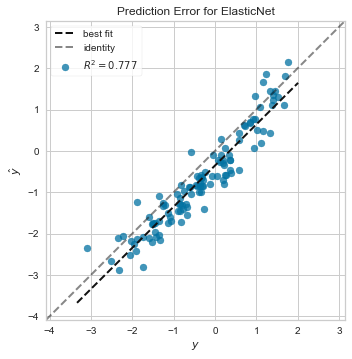

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.8s remaining:    8.8s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.8s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
...................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


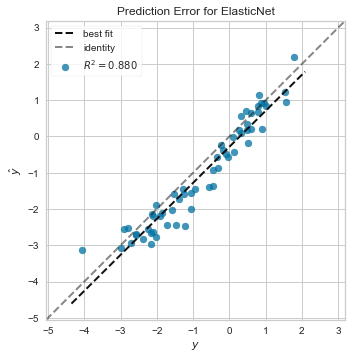

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.1s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.1s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


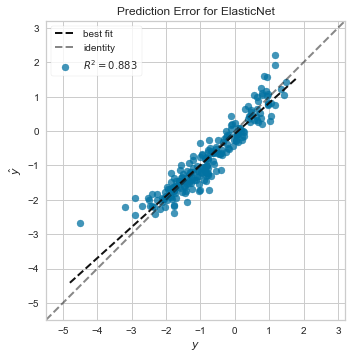

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.8s remaining:    7.1s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.7s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


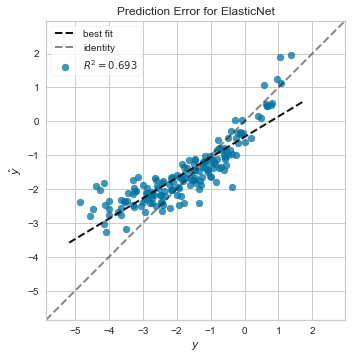

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.5s remaining:    8.2s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.2s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.3s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


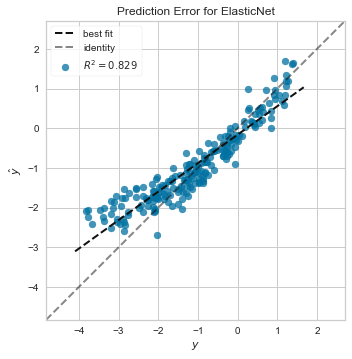

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.1s remaining:    7.6s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.3s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
........................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


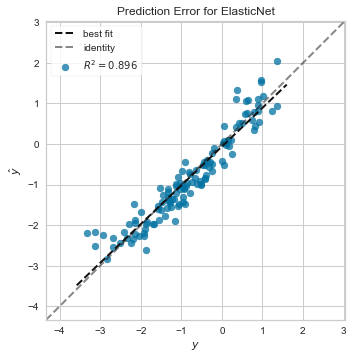

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.7s remaining:    8.6s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.7s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.8s remaining:    1.2s
.........................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


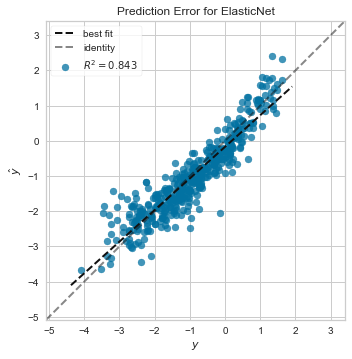

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.0s remaining:    7.4s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    5.8s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.4s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


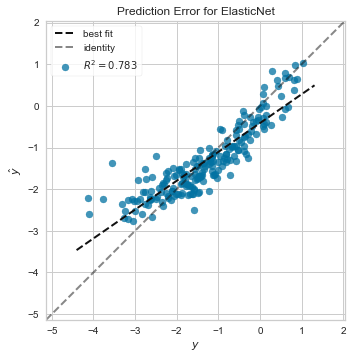

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.0s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.7s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
.......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.1s finished


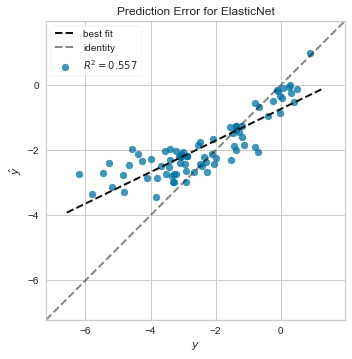

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.7s remaining:    7.1s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.6s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.0s finished


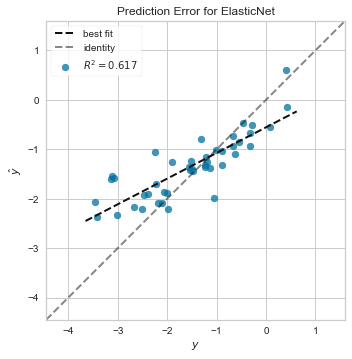

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.2s remaining:    9.3s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.3s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.4s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


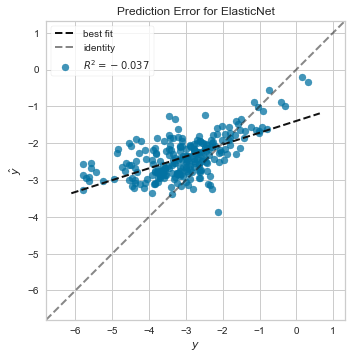

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.9s remaining:    4.3s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    3.9s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.7s remaining:    1.1s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    0.9s finished


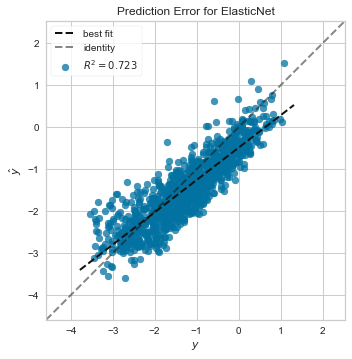

--------------------------------------------------
repetition number 1
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.8s remaining:    7.2s
..................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.6s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


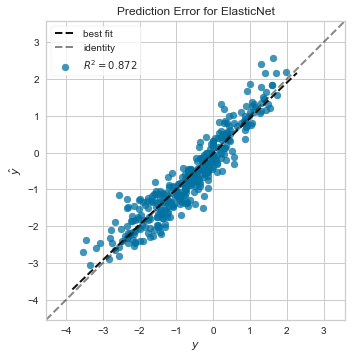

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.5s remaining:    8.2s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.2s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


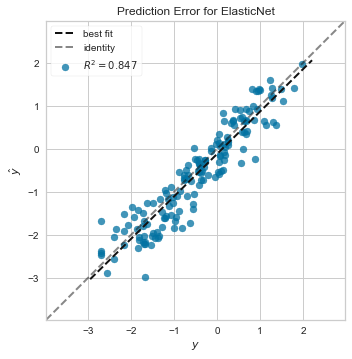

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.6s remaining:    7.0s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.1s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.8s remaining:    1.1s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.0s finished


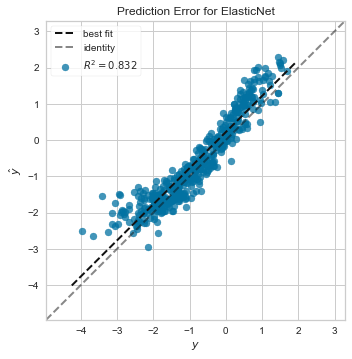

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.2s remaining:    7.8s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.1s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


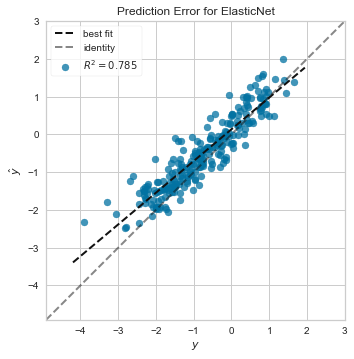

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.3s remaining:    7.9s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.3s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.4s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.1s finished


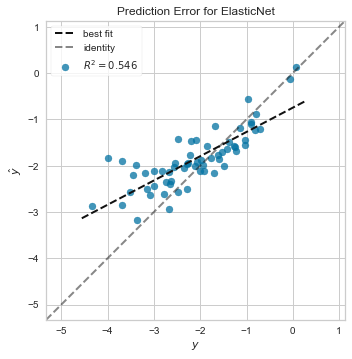

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.0s remaining:    9.0s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.0s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


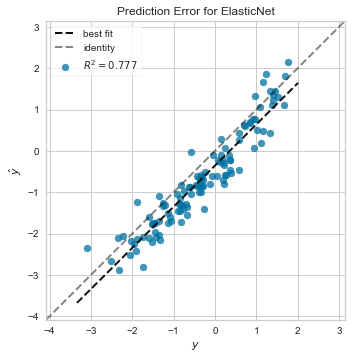

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.2s remaining:    7.8s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.3s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
.......................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


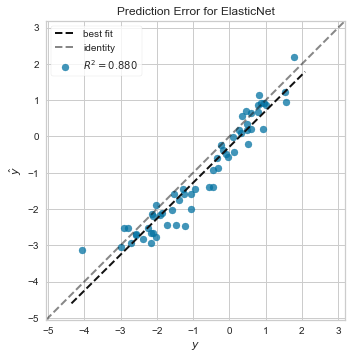

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.1s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.0s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


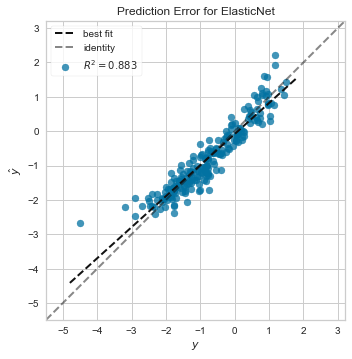

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.0s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.6s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


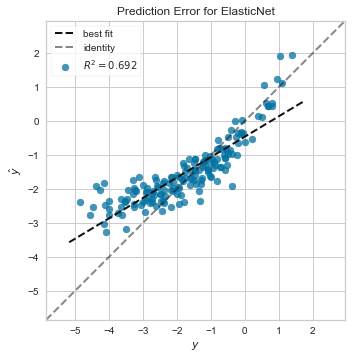

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.8s remaining:    7.2s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.1s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


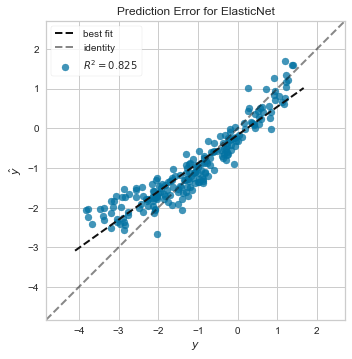

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.0s remaining:    7.5s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.6s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.8s finished


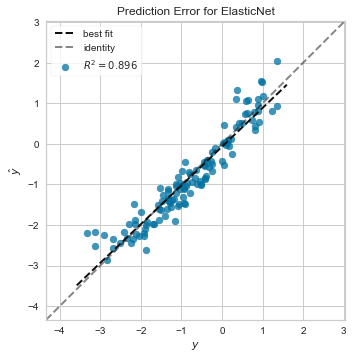

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.6s remaining:    7.0s
...................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.0s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


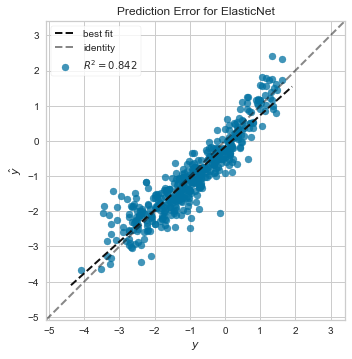

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.2s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.6s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
....................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


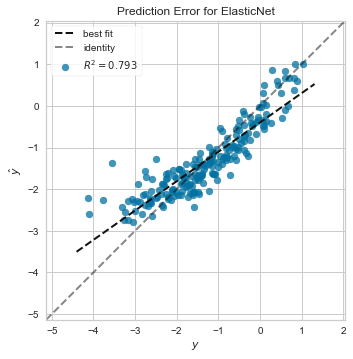

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.6s remaining:    6.9s
..................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.1s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


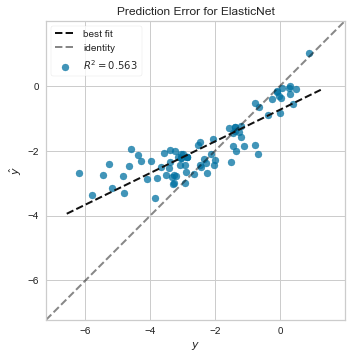

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.2s remaining:    7.8s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.7s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
....................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


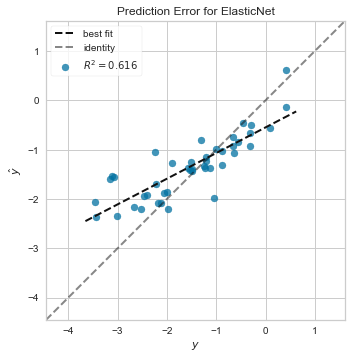

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.1s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.7s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
...........................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


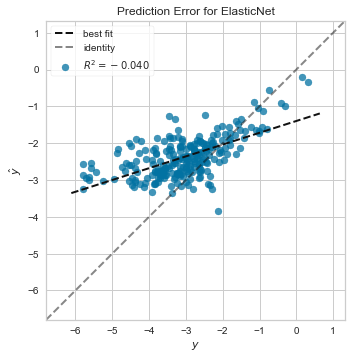

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    3.6s remaining:    5.4s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    4.5s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.7s remaining:    1.0s
............................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.1s finished


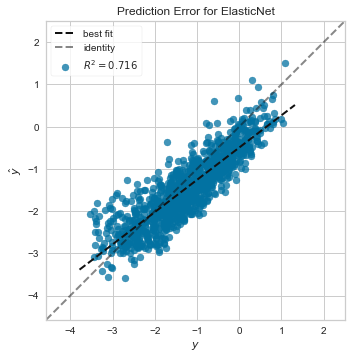

--------------------------------------------------
repetition number 2
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.2s remaining:    9.3s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.4s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.3s finished


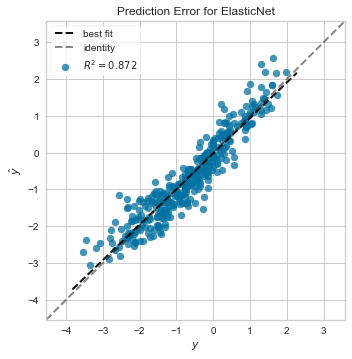

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.5s remaining:    8.3s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.4s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.6s finished


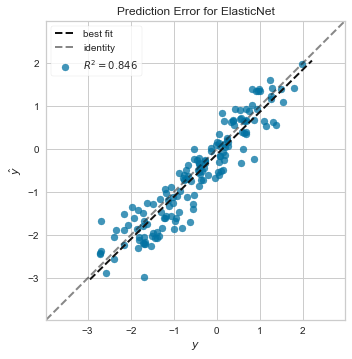

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.5s remaining:    8.3s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.6s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.7s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


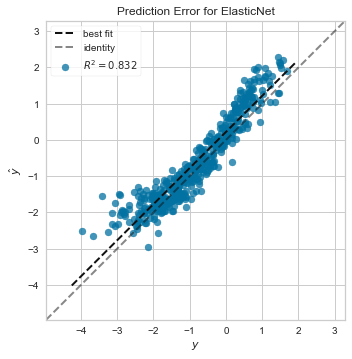

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.0s remaining:    7.4s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.4s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


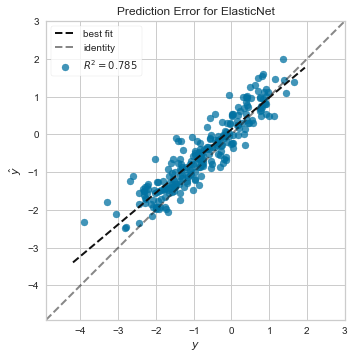

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.1s remaining:    7.6s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.0s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
...[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


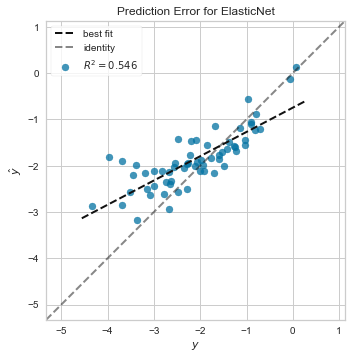

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.9s remaining:    8.9s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.1s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.7s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


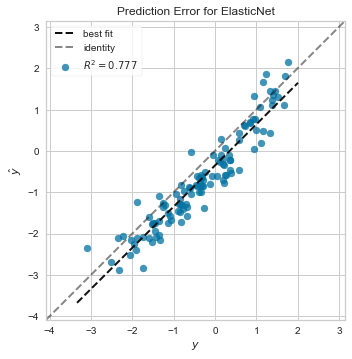

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.1s remaining:    7.6s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.6s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


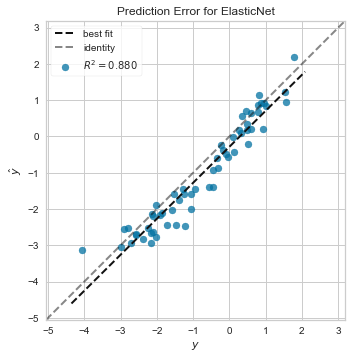

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.3s remaining:    8.0s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    5.8s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


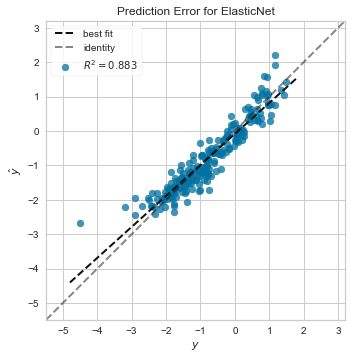

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.9s remaining:    8.8s
....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.3s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
.....................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


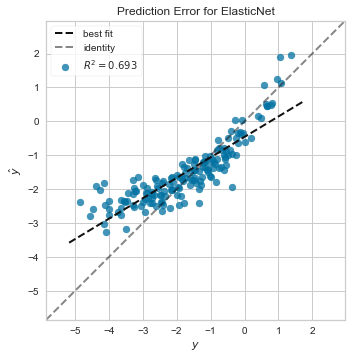

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.2s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.8s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    2.0s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.8s finished


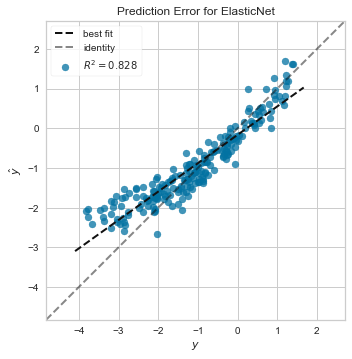

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.1s remaining:    7.7s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.3s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.3s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.1s finished


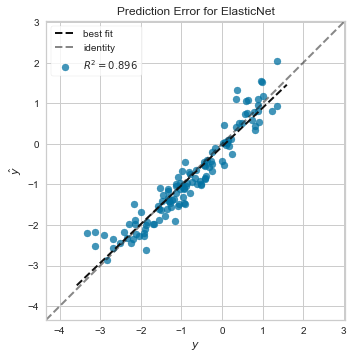

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.8s remaining:    8.8s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.4s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.3s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


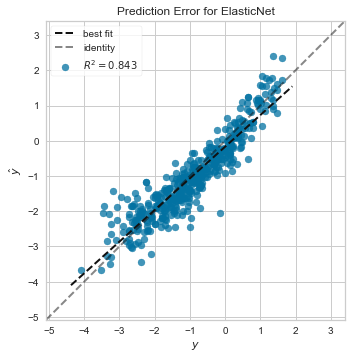

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.1s remaining:    7.7s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.9s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.4s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


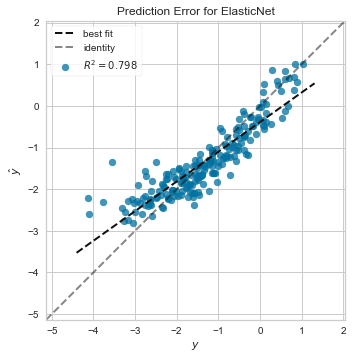

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.1s remaining:    7.7s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.7s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.8s finished


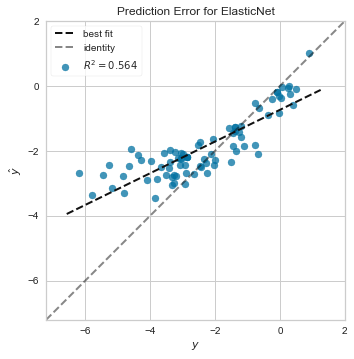

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.7s remaining:    7.1s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.9s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


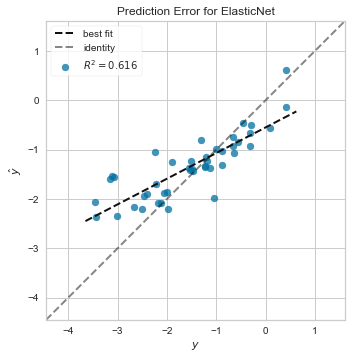

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.2s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.9s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    2.0s
.....................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


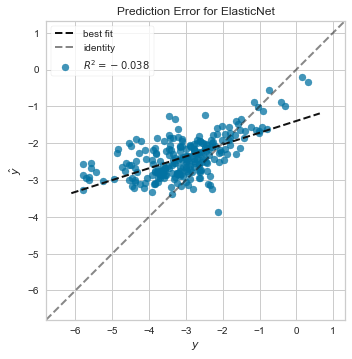

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    3.0s remaining:    4.5s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    4.4s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.3s
.......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.0s finished


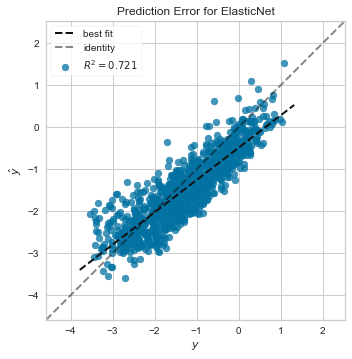

--------------------------------------------------
repetition number 3
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.3s remaining:    9.5s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.3s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


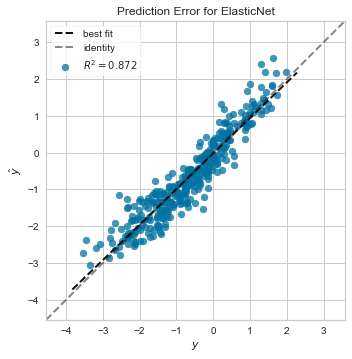

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.1s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.5s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.6s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


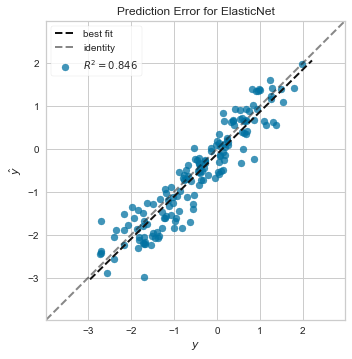

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.3s remaining:    8.0s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.9s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


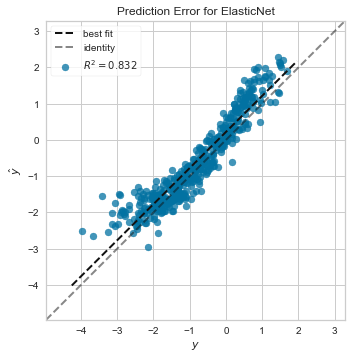

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.2s remaining:    7.7s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.8s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.7s remaining:    1.0s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    0.9s finished


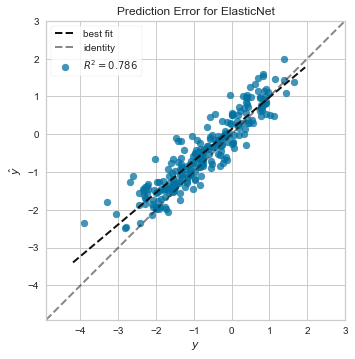

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.0s
....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.5s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.8s finished


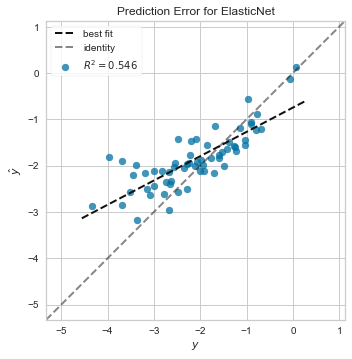

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.2s remaining:    7.9s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.7s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.8s remaining:    1.2s
........................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.1s finished


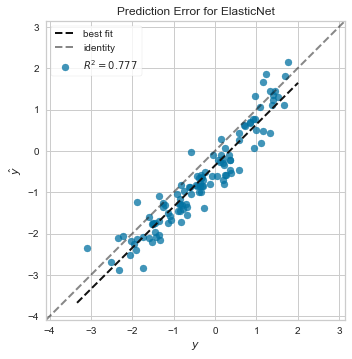

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.2s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.8s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


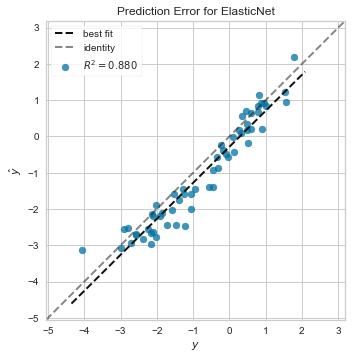

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.9s remaining:    8.8s
....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.4s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.1s finished


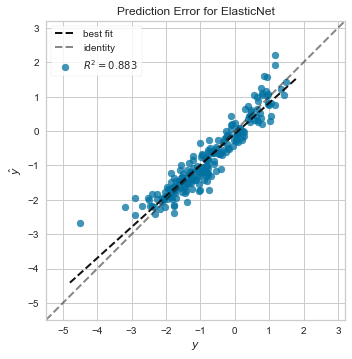

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.7s remaining:    7.1s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.4s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


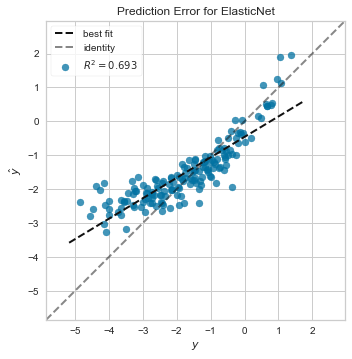

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.9s remaining:    7.3s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.3s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
.....................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


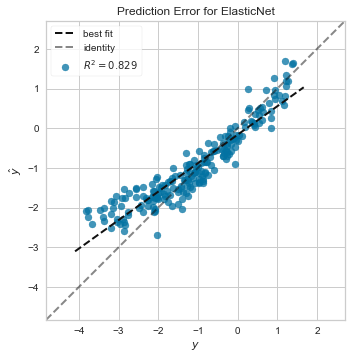

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.0s remaining:    7.4s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.0s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


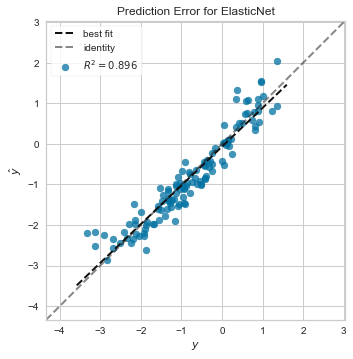

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.5s remaining:    8.2s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.1s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.7s
..................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


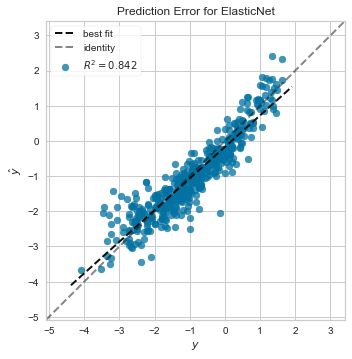

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.5s remaining:    6.7s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.0s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


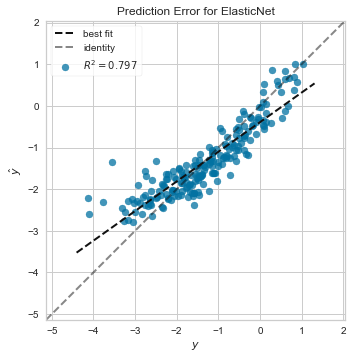

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.8s remaining:    8.7s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.3s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


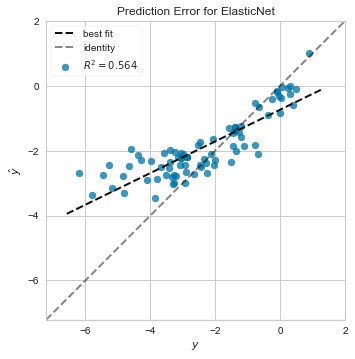

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.3s remaining:    7.9s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.9s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    2.0s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


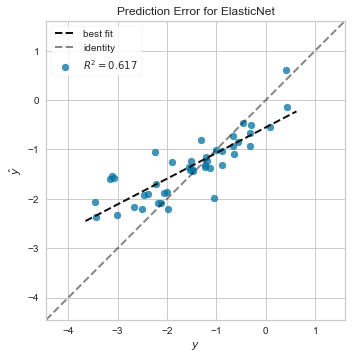

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.2s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.0s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


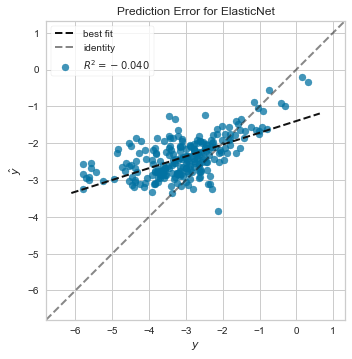

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    3.6s remaining:    5.4s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    4.9s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.5s remaining:    0.8s
.......................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    0.8s finished


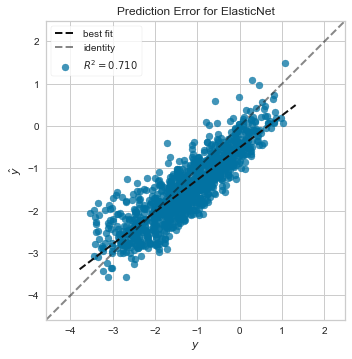

--------------------------------------------------
repetition number 4
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.2s remaining:    7.9s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.0s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
.......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


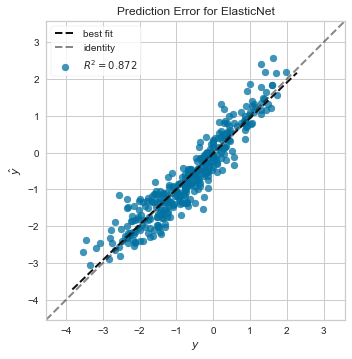

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.1s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.5s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    2.0s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.8s finished


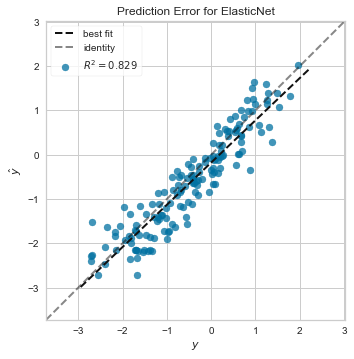

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.2s remaining:   10.9s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.8s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.4s remaining:    2.0s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


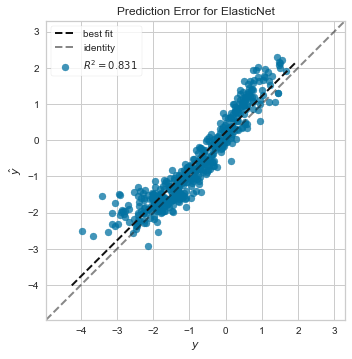

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.4s remaining:    9.7s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.7s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.8s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.3s finished


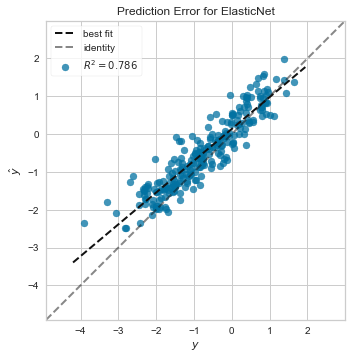

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.4s remaining:   11.0s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.6s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.1s finished


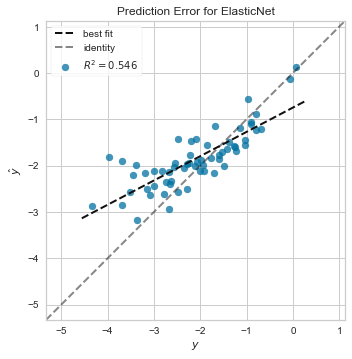

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.2s remaining:    9.3s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.7s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


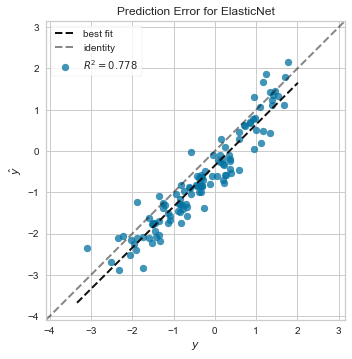

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.8s remaining:   10.1s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.0s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
............................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


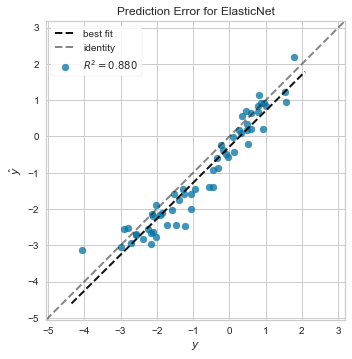

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.7s remaining:   11.6s
...[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.9s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


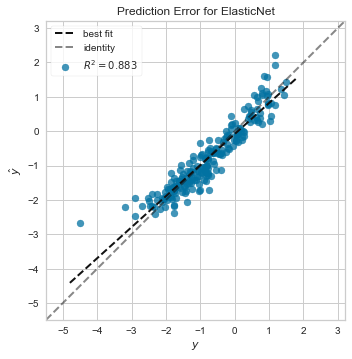

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.8s remaining:   10.2s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.6s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.3s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


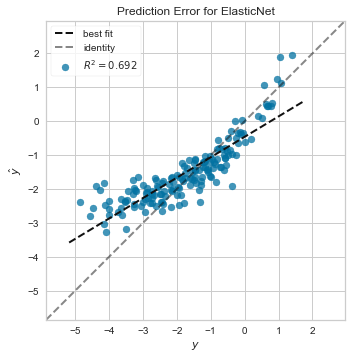

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.3s remaining:    9.4s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.3s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.4s remaining:    2.1s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


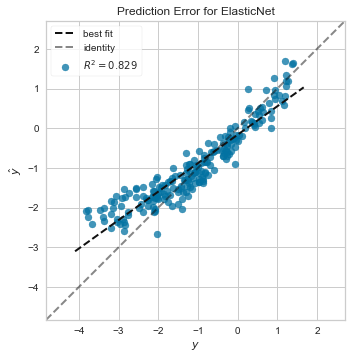

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.2s remaining:    9.2s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.3s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.8s remaining:    2.7s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.1s finished


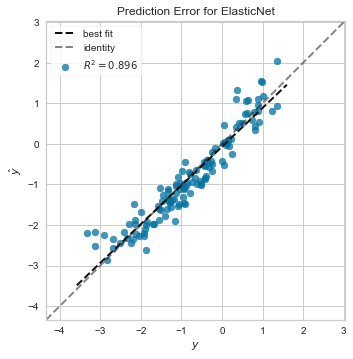

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    9.6s remaining:   14.4s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   12.1s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.7s remaining:    4.1s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    3.0s finished


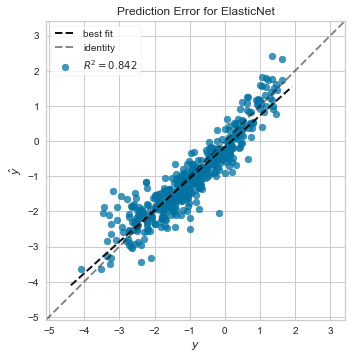

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    8.9s remaining:   13.3s
....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.7s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.8s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.2s finished


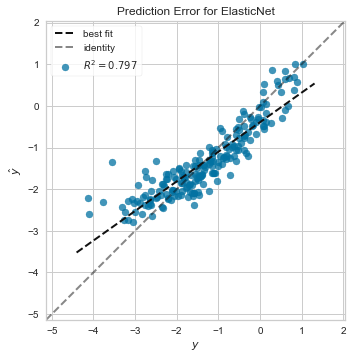

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.8s remaining:   11.7s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.8s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.6s remaining:    4.0s
...[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.7s finished


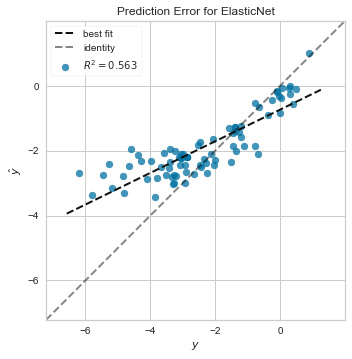

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.1s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.6s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


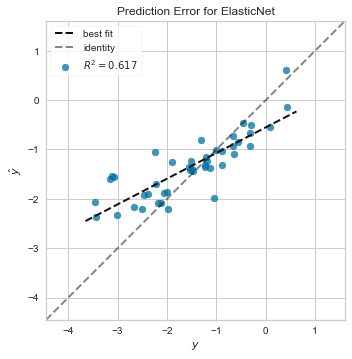

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    8.7s remaining:   13.0s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.9s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.2s remaining:    3.2s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.6s finished


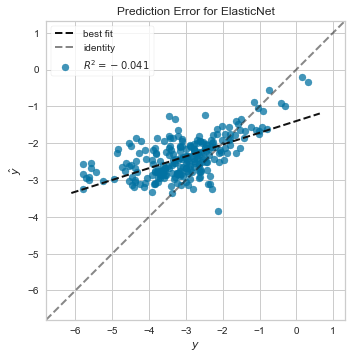

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.6s remaining:    6.9s
.......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    5.1s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.6s remaining:    0.9s
.................................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.0s finished


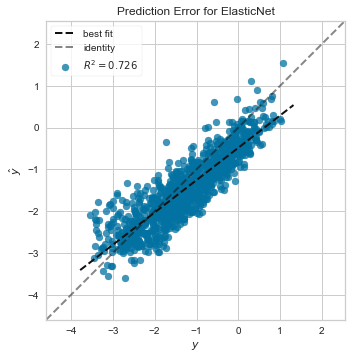

--------------------------------------------------
repetition number 5
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.0s remaining:   10.5s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.1s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.8s remaining:    2.8s
.......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


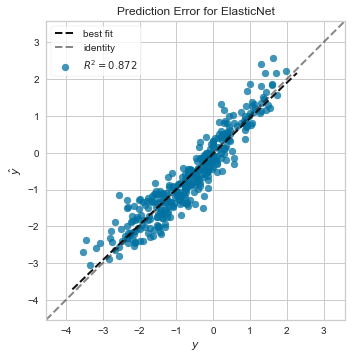

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.9s remaining:   10.3s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.9s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
..................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.6s finished


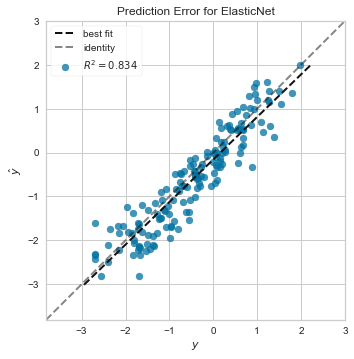

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.8s remaining:   10.2s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.3s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    2.0s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.6s finished


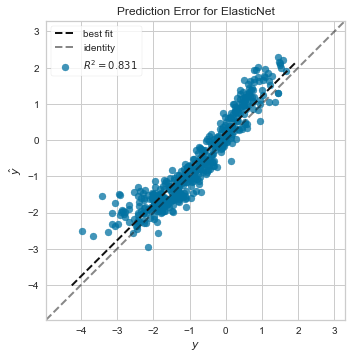

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.2s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.1s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
.......................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


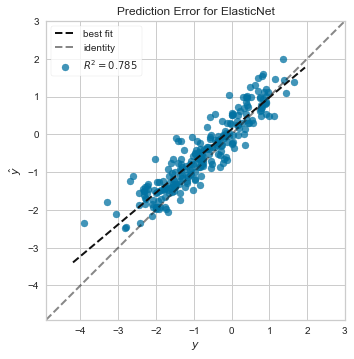

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.6s remaining:   11.3s
...[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.7s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.8s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


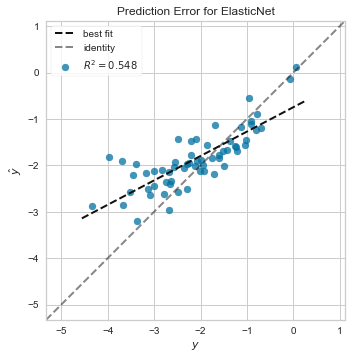

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.6s remaining:    9.9s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.2s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.0s remaining:    3.0s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.1s finished


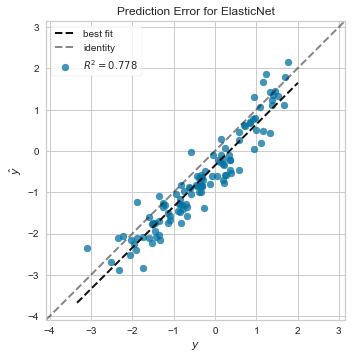

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.4s remaining:   11.1s
....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.1s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


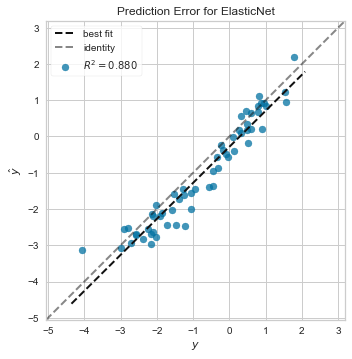

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.4s remaining:   11.2s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.2s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.8s remaining:    2.6s
.......................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.3s finished


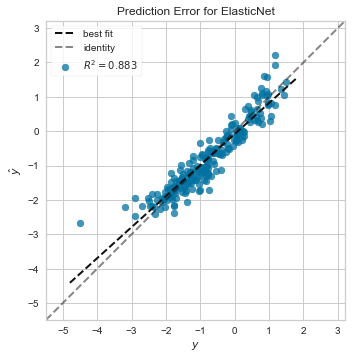

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.0s remaining:   10.4s
....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.4s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.6s finished


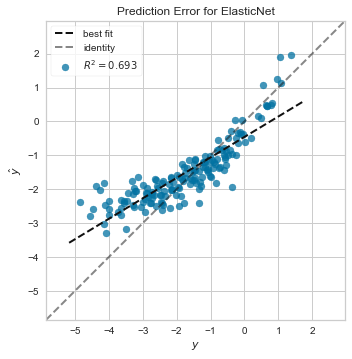

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.5s remaining:    9.7s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.2s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


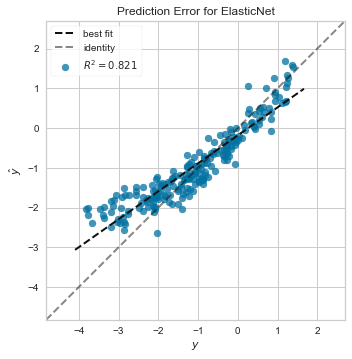

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.9s remaining:    8.8s
..................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.4s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
...................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.1s finished


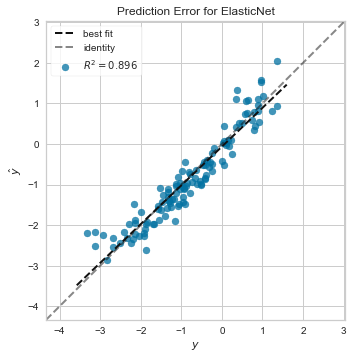

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.4s remaining:   11.1s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.8s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.4s remaining:    2.1s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


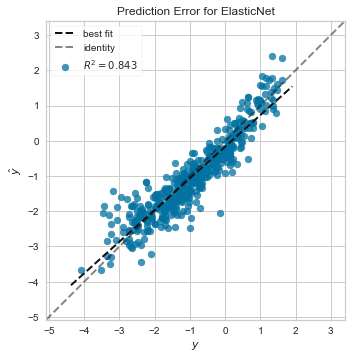

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.1s remaining:   10.7s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.3s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.2s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.5s finished


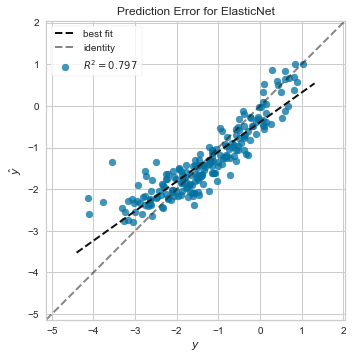

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.9s remaining:    8.9s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.1s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.9s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.3s finished


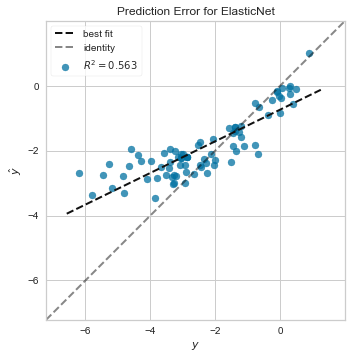

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.2s remaining:   10.8s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.3s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


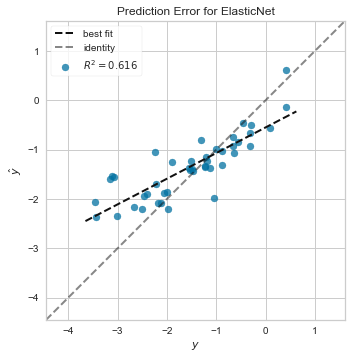

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.8s remaining:   10.3s
......................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   11.2s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.2s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


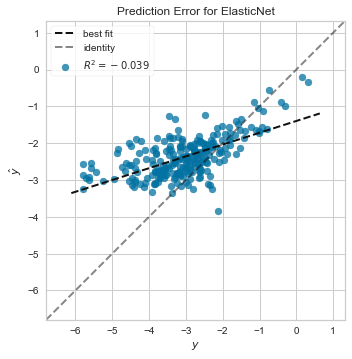

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.9s remaining:    7.3s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    5.9s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


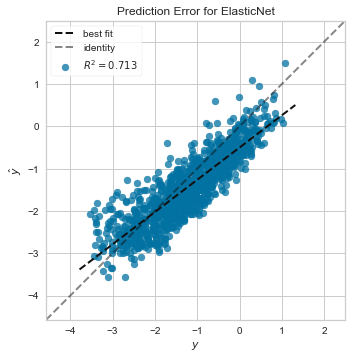

--------------------------------------------------
repetition number 6
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    8.2s remaining:   12.3s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.3s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.7s remaining:    2.6s
.....................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.3s finished


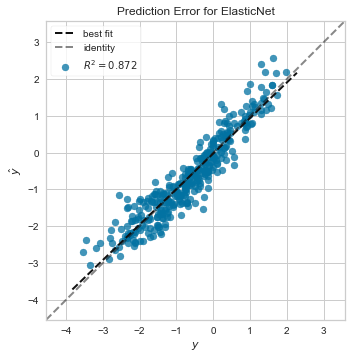

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.0s remaining:    8.9s
.....................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.1s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.8s remaining:    2.7s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.1s finished


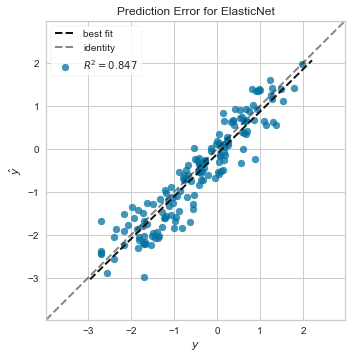

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.2s remaining:    9.3s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.4s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.5s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


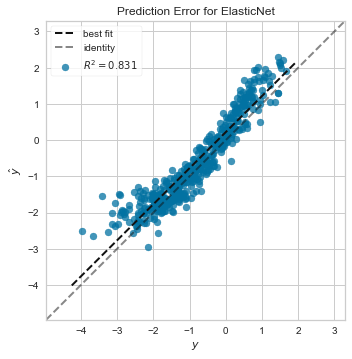

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.2s remaining:    9.3s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.8s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.3s finished


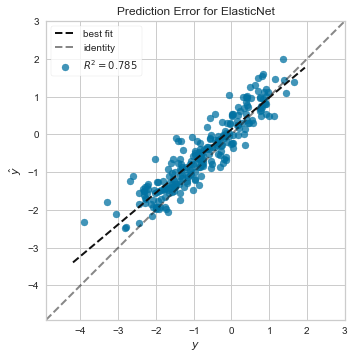

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.1s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.9s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


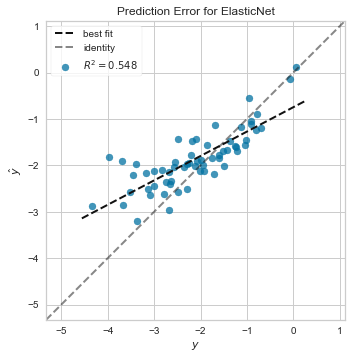

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.5s remaining:    9.8s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.9s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


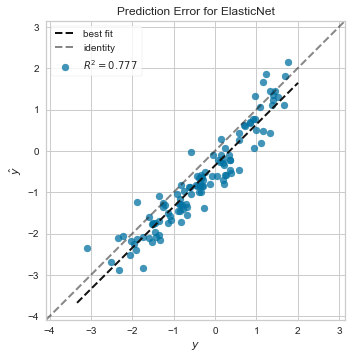

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.8s remaining:   10.2s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.4s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.4s remaining:    2.2s
......................................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.5s finished


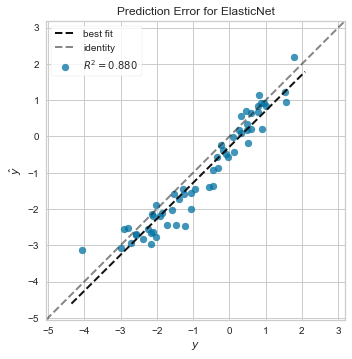

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.2s remaining:   10.8s
..[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.6s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


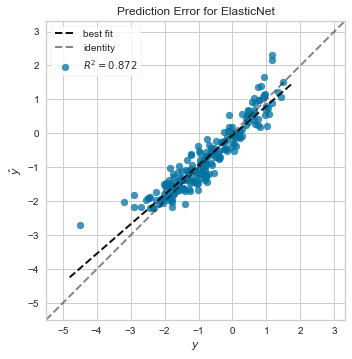

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.7s remaining:   10.0s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.2s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.2s
.......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.6s finished


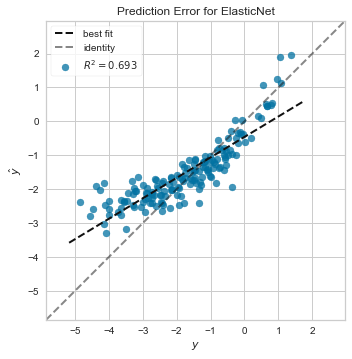

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.1s remaining:   10.6s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.2s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.4s remaining:    2.1s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


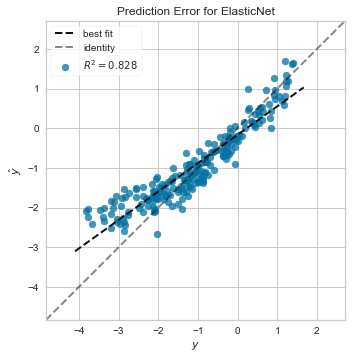

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.6s remaining:   10.0s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.2s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.7s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


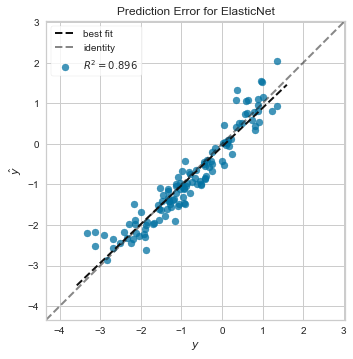

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.4s remaining:   11.2s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.6s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.7s
....................................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


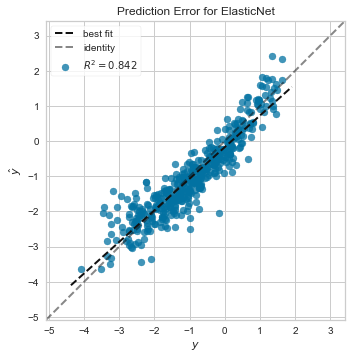

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.0s remaining:   10.5s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.1s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.4s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


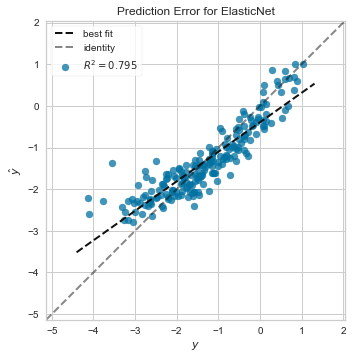

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.1s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.3s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


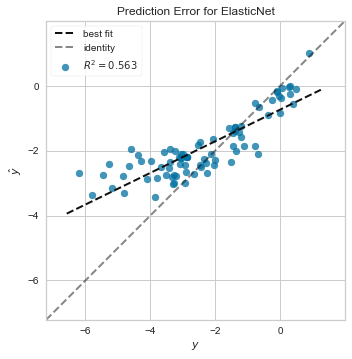

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.8s remaining:   10.2s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.9s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.7s
...................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


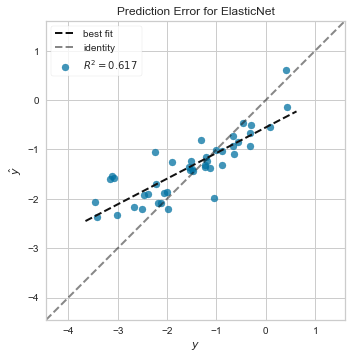

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.9s remaining:   10.4s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.5s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.8s remaining:    2.6s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


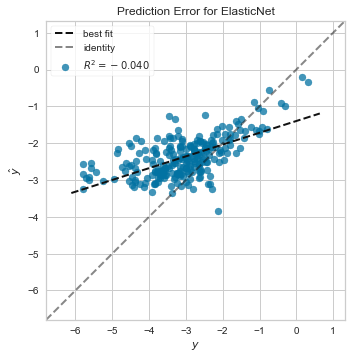

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.7s remaining:    7.1s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    5.3s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.3s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


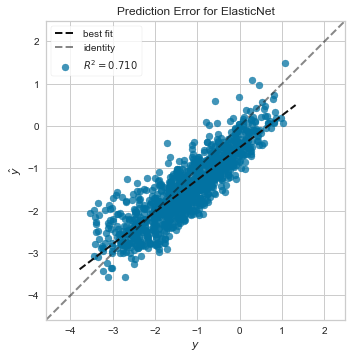

--------------------------------------------------
repetition number 7
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.6s remaining:   10.0s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.5s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.4s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


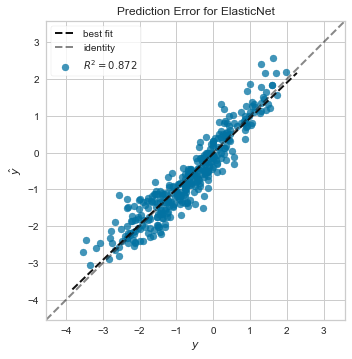

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.2s remaining:    9.2s
....................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.1s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.7s remaining:    2.6s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


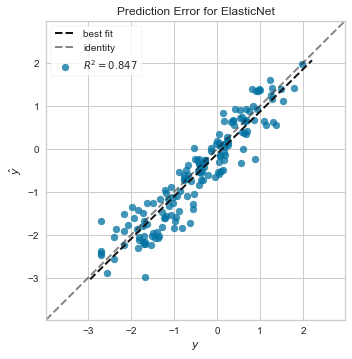

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.8s remaining:   10.1s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.1s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.8s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.3s finished


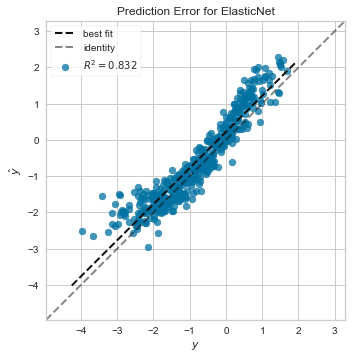

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.0s remaining:   10.5s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.2s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    2.0s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


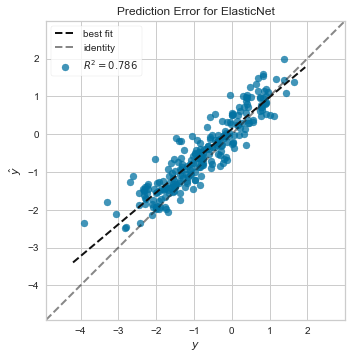

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.2s remaining:   10.7s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.3s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.4s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.2s finished


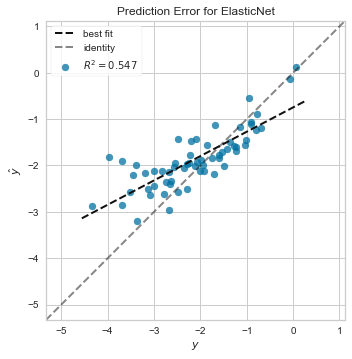

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.1s remaining:   10.6s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.0s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.4s remaining:    2.1s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


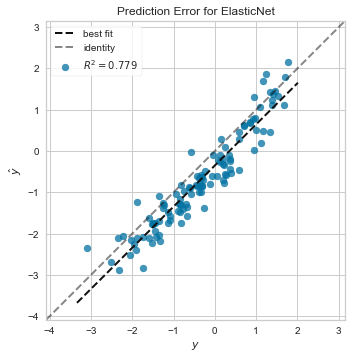

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.6s remaining:    9.8s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.1s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.8s
.......................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


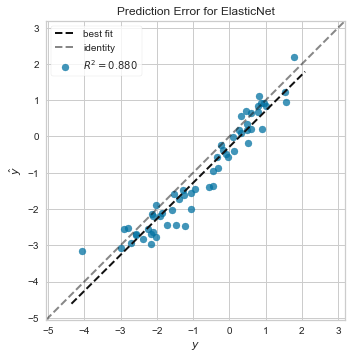

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.1s remaining:    9.2s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.8s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.9s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


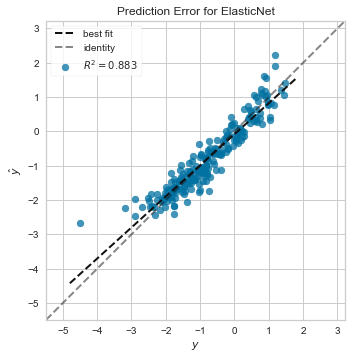

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.3s remaining:    9.4s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.3s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.4s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.7s finished


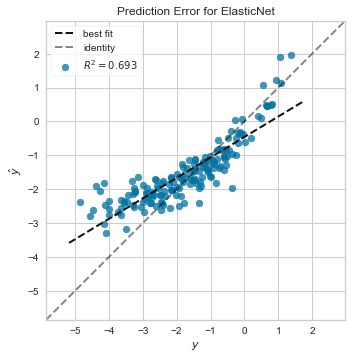

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.5s remaining:    9.7s
..................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.0s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.8s finished


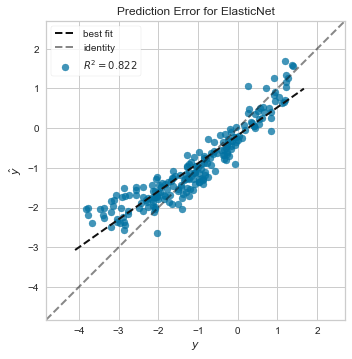

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.9s remaining:    8.9s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.4s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.4s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.1s finished


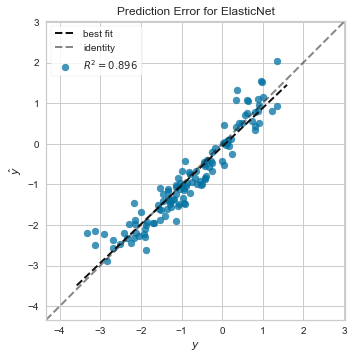

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.9s remaining:    8.8s
...................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.5s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.9s
...[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


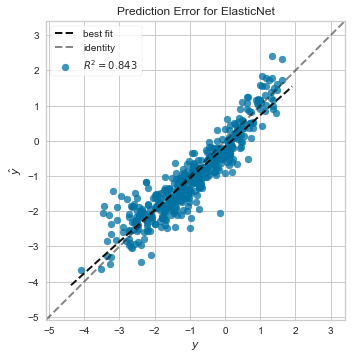

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.4s remaining:    8.2s
...................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.7s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.0s remaining:    1.5s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.2s finished


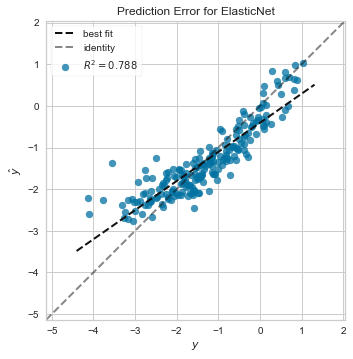

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.4s remaining:   11.2s
.......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.8s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.3s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


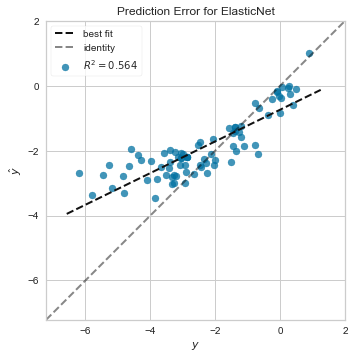

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    8.1s remaining:   12.2s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.4s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.2s remaining:    1.9s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


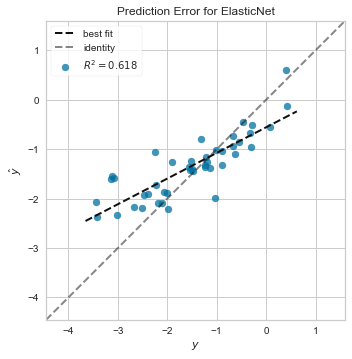

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    8.4s remaining:   12.7s
....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.0s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.2s remaining:    3.3s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.7s finished


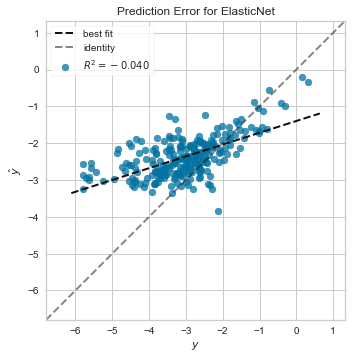

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    4.9s remaining:    7.4s
.......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    5.5s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    0.9s remaining:    1.3s
................................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.4s finished


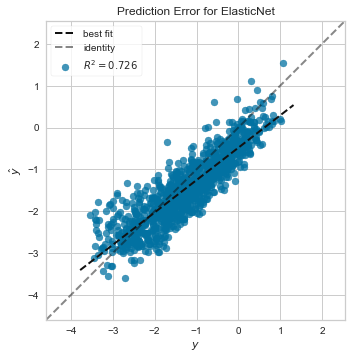

--------------------------------------------------
repetition number 8
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.5s remaining:   11.2s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.8s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.4s remaining:    2.1s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


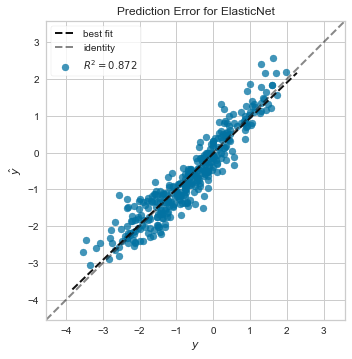

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.0s remaining:   10.6s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.1s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.4s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.2s finished


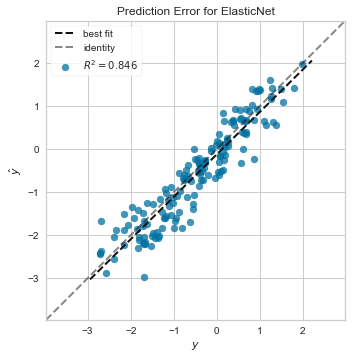

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.7s remaining:   10.1s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.8s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.2s remaining:    3.2s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.3s finished


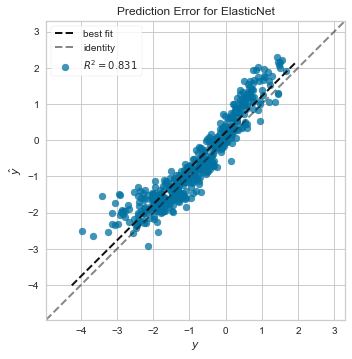

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.6s remaining:    8.4s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.4s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.2s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.8s finished


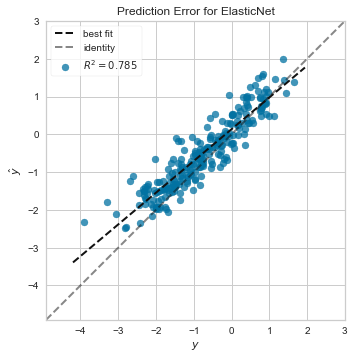

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.1s remaining:   10.6s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.9s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.7s remaining:    2.6s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.3s finished


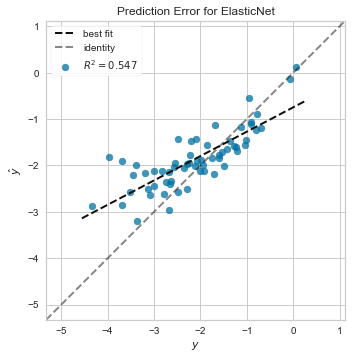

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.6s remaining:   11.4s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.7s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.3s remaining:    1.9s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


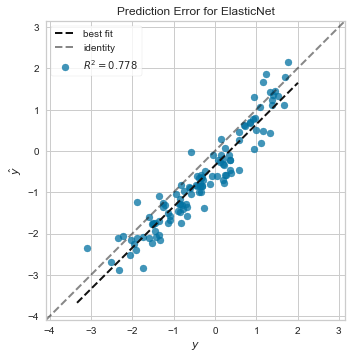

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.0s remaining:   10.6s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.7s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.7s remaining:    2.5s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.1s finished


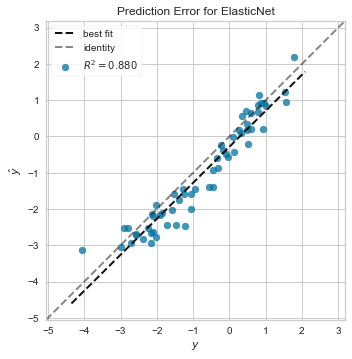

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.2s remaining:   10.8s
...[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    7.5s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.2s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.6s finished


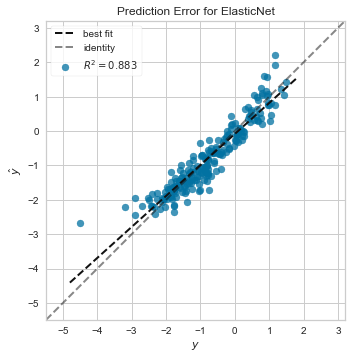

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.7s remaining:   10.0s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.6s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.6s remaining:    3.9s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    3.3s finished


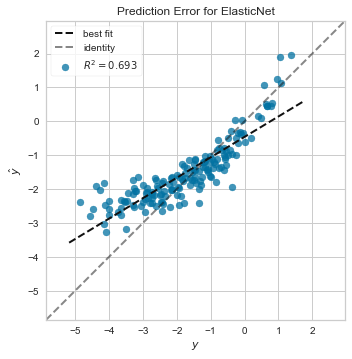

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:   11.7s remaining:   17.6s
....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   13.1s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.1s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.9s finished


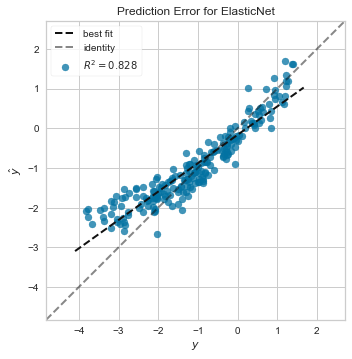

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:   10.7s remaining:   16.1s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   13.1s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    3.6s remaining:    5.4s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    4.0s finished


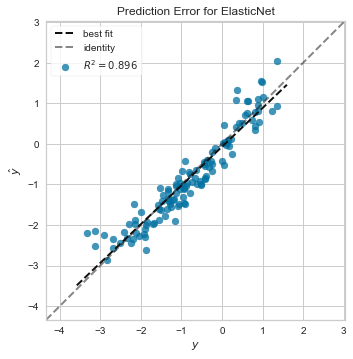

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:   12.3s remaining:   18.4s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   15.9s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.9s
.......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.2s finished


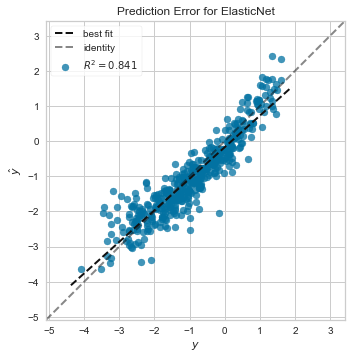

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.2s remaining:   10.8s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.4s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.4s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.2s finished


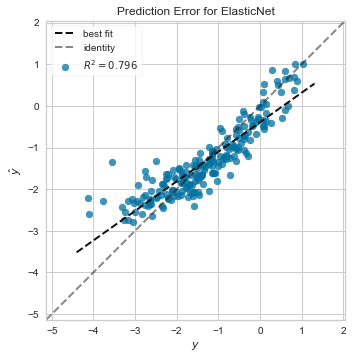

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.6s remaining:   11.5s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.7s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.9s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.5s finished


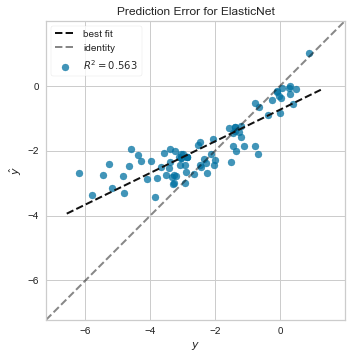

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.5s remaining:   11.3s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.7s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    3.2s remaining:    4.8s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    3.7s finished


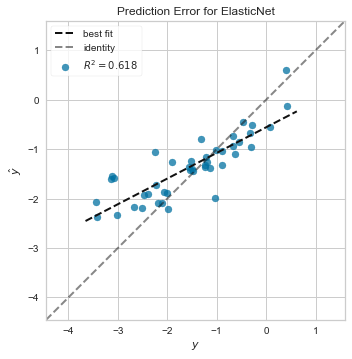

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:   11.7s remaining:   17.6s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   15.6s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    3.1s remaining:    4.7s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    4.0s finished


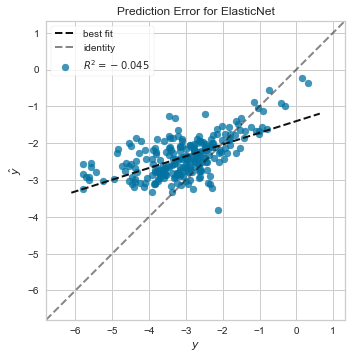

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    5.5s remaining:    8.3s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.8s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.4s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.8s finished


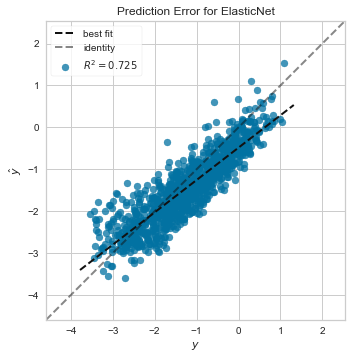

--------------------------------------------------
repetition number 9
Site held out: ISGS, n=340
n training=3058; n valid=765 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    9.9s remaining:   14.9s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   13.6s finished


alpha this fold: 0.0014147486056192101
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.6s remaining:    3.8s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    3.4s finished


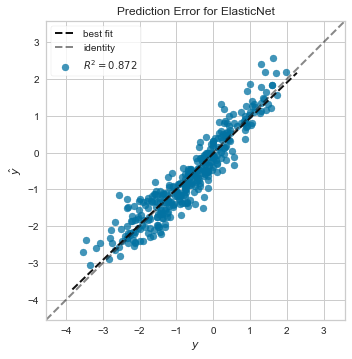

Site held out: GCNKSS, n=158
n training=3204; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:   16.5s remaining:   24.8s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   24.8s finished


alpha this fold: 0.0014133005391356774
selected features: 148/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.2s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.8s finished


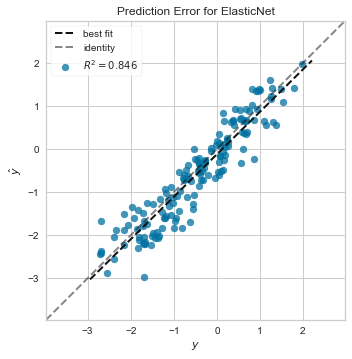

Site held out: MGH, n=446
n training=2973; n valid=744 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    8.2s remaining:   12.4s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.3s finished


alpha this fold: 0.0014314936366992706
selected features: 145/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.3s remaining:    3.4s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.6s finished


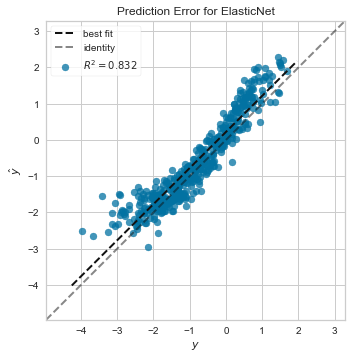

Site held out: MIAMIR, n=249
n training=3131; n valid=783 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.7s remaining:   11.5s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.5s finished


alpha this fold: 0.0014529535451888729
selected features: 147/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.8s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.4s finished


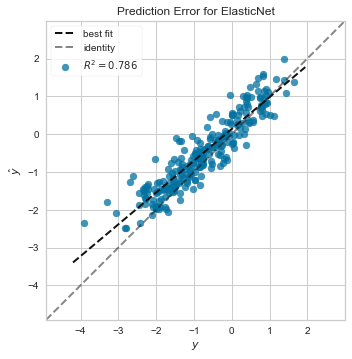

Site held out: GEOS, n=61
n training=3281; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.9s remaining:   10.3s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.9s finished


alpha this fold: 0.0014117946714879792
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.1s remaining:    3.1s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.2s finished


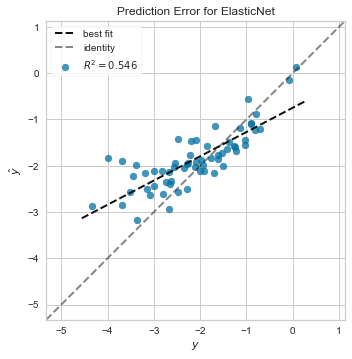

Site held out: BASICMAR, n=115
n training=3238; n valid=810 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    9.0s remaining:   13.5s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   11.5s finished


alpha this fold: 0.0014065240655617116
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.9s remaining:    2.8s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.3s finished


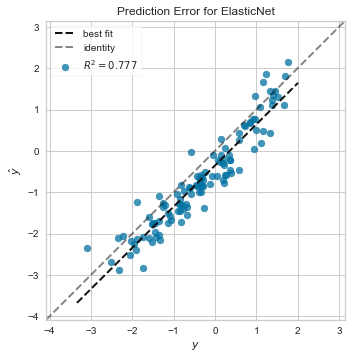

Site held out: BRAINS, n=59
n training=3283; n valid=821 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.0s remaining:   10.6s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.8s finished


alpha this fold: 0.0014044902969933088
selected features: 146/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.5s remaining:    2.3s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.9s finished


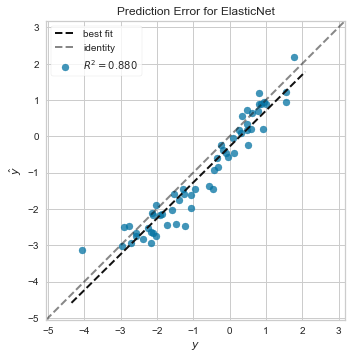

Site held out: GRAZ, n=211
n training=3161; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    8.1s remaining:   12.1s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.6s finished


alpha this fold: 0.001431345411187157
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.6s remaining:    3.9s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    3.9s finished


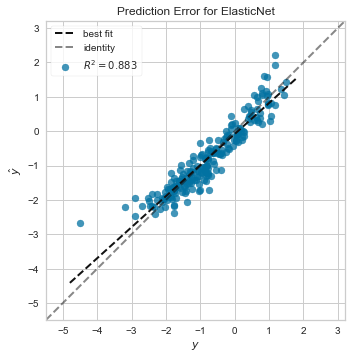

Site held out: GOTEBURG, n=162
n training=3200; n valid=801 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:   12.4s remaining:   18.6s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   15.0s finished


alpha this fold: 0.0014194412786099682
selected features: 141/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.6s remaining:    2.5s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.0s finished


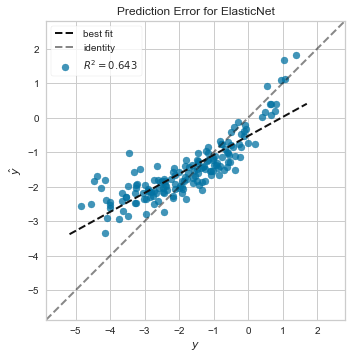

Site held out: SWISS, n=210
n training=3162; n valid=791 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:   13.3s remaining:   20.0s
......[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   15.8s finished


alpha this fold: 0.001407910667013539
selected features: 155/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.8s remaining:    4.2s
........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    3.3s finished


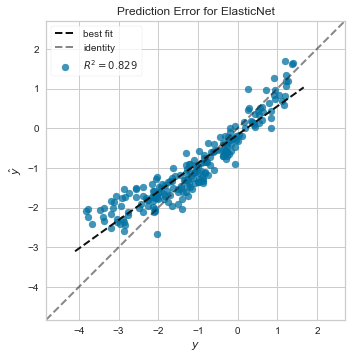

Site held out: LUND, n=121
n training=3233; n valid=809 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    9.9s remaining:   14.8s
.........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   11.7s finished


alpha this fold: 0.0014315343016673085
selected features: 150/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.0s remaining:    3.0s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.4s finished


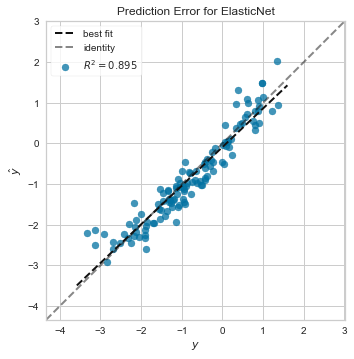

Site held out: LEUVEN, n=441
n training=2977; n valid=745 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.0s remaining:   10.5s
.....................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.1s finished


alpha this fold: 0.0014392503170066102
selected features: 152/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.7s remaining:    2.6s
................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.2s finished


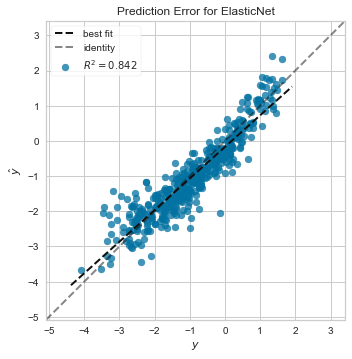

Site held out: SPS3, n=205
n training=3166; n valid=792 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.9s remaining:   10.4s
...............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.1s finished


alpha this fold: 0.0014258750165560936
selected features: 156/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.7s remaining:    2.5s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.1s finished


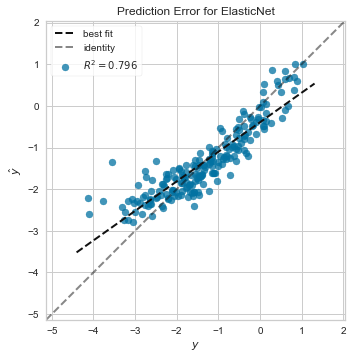

Site held out: HELSINKI, n=81
n training=3265; n valid=817 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.3s remaining:   11.0s
.............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    9.8s finished


alpha this fold: 0.0014153594371364546
selected features: 149/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.0s remaining:    3.0s
............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.4s finished


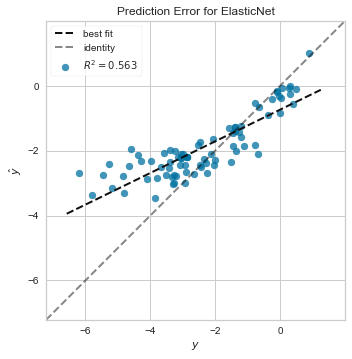

Site held out: ASGC, n=44
n training=3295; n valid=824 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
.........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.9s remaining:   10.3s
...........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    8.6s finished


alpha this fold: 0.0014204713313549417
selected features: 153/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
..........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.2s remaining:    3.3s
..........[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    2.6s finished


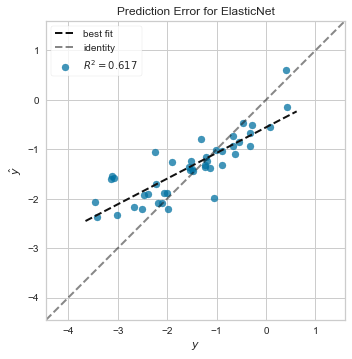

Site held out: SIFAP, n=244
n training=3135; n valid=784 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    7.8s remaining:   11.7s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:   10.9s finished


alpha this fold: 0.0013159174537604357
selected features: 154/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    2.3s remaining:    3.4s
..............[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    3.0s finished


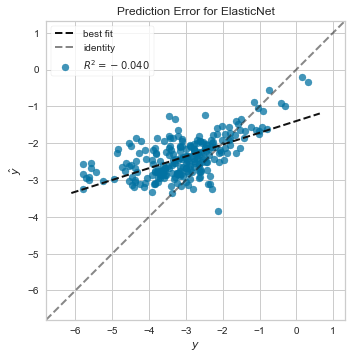

Site held out: GEISINGER, n=1015
n training=2518; n valid=630 


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...............................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    6.2s remaining:    9.3s
.....[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    6.8s finished


alpha this fold: 0.0017513209108272296
selected features: 151/756 total number of features


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
...................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:    1.1s remaining:    1.6s
.................[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:    1.5s finished


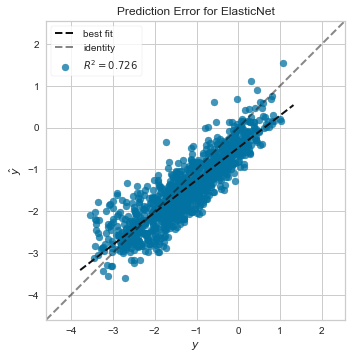

In [16]:
X = df_num.drop([#'ID',
                 'Label',
'Age',
'Sex',
'HTN',
'DM',
'AF',
'CAD',
'Smoking_ever',
'Prior_stroke',
'Brain_volume',
'No_csf_brain_vol',
'Ventricle_volume',
'WMH_Bvadj',
'WMH_volume',
                 ],axis = 1)

# Dropping surface and volume confounding variables
#X = X.drop(X.filter(regex='_Surface').columns, axis=1)
#X = X.drop(X.filter(regex='_Voxel').columns, axis=1)
#X = X.drop(X.filter(regex='_Volume').columns, axis=1)
#X = X.drop(X.filter(regex='_shape').columns, axis=1)


#Selecting filtered variables
X = X.drop(X.filter(regex='wavelet2').columns, axis=1)
X = X.drop(X.filter(regex='wavelet3').columns, axis=1)

#X = X.drop(X.filter(regex='lbp').columns, axis=1)
X = X.drop(X.filter(regex='gradient').columns, axis=1)
X = X.drop(X.filter(regex='exponential').columns, axis=1)
X = X.drop(X.filter(regex='logarithm').columns, axis=1)
X = X.drop(X.filter(regex='squareroot').columns, axis=1)
X = X.drop(X.filter(regex='square').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-1-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-3-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma').columns, axis=1)

X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='original').columns, axis=1)
#X = X.drop(X.filter(regex='diagnostics').columns, axis=1)
   

# Dropping heavily volume confounded variables
#X = X.drop(X.filter(regex='_RootMeanSquared').columns, axis=1)
#X = X.drop(X.filter(regex='_Energy').columns, axis=1)
#X = X.drop(X.filter(regex='_TotalEnergy').columns, axis=1)
#X = X.drop(X.filter(regex='_Coarseness').columns, axis=1)
#X = X.drop(X.filter(regex='Emphasis').columns, axis=1)
#X = X.drop(X.filter(regex='Uniformity').columns, axis=1)
#X = X.drop(X.filter(regex='Strength').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='ZoneVariance').columns, axis=1)
#X = X.drop(X.filter(regex='Busyness').columns, axis=1)


#X = X.drop(X.filter(regex='firstorder').columns, axis=1)
#X = X.drop(X.filter(regex='glcm').columns, axis=1)
#X = X.drop(X.filter(regex='gldm').columns, axis=1)
#X = X.drop(X.filter(regex='ngtdm').columns, axis=1)
#X = X.drop(X.filter(regex='glrlm').columns, axis=1)
#X = X.drop(X.filter(regex='glszm').columns, axis=1)

#X = X.drop(X.filter(regex='Volume').columns, axis=1)

#X = X.drop(X.filter(regex='Maximum').columns, axis=1)
##X = X.drop(X.filter(regex='Sphericity').columns, axis=1)
#X = X.drop(X.filter(regex='Length').columns, axis=1)
#X = X.drop(X.filter(regex='Elongation').columns, axis=1)
#X = X.drop(X.filter(regex='Flatness').columns, axis=1)

X=X.set_index('ID')

X_site = X.join(df_site_name,how='inner')

X_site = X_site.reset_index()
y = df_num.WMH_Bvadj


imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
#scaler = RobustScaler()
scaler=StandardScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=8)
y_pred_total_site=[]
y_total_site =[]
r2_total_site=[]
index_total_site = []
all_selected_features_site =[]
coefs_site=pd.DataFrame(index=df_num.columns)
r2_repeated_perSite = pd.DataFrame(columns=X_site.Site.unique(),index=range(0,30))
coefs_repeated_perSite = pd.DataFrame(columns=X_site.Site.unique(),index=range(0,30))

repeated=10
    #hold one site out
for i in range(repeated):
    print('-'*50)
    print('repetition number {}'.format(i))
    site_list = list(X_site.Site.unique())
    
    site_list.remove('UNICAMP')
    for site in site_list:
        if site == 'UNICAMP':
            pass
        else:
            site_list=list(X_site.Site.unique())
            site_list.remove(site)
            X_training=X_site[X_site['Site'].isin(site_list)].drop('Site',axis=1)
            X_final=X_site[~X_site['Site'].isin(site_list)].drop('Site',axis=1)
            columns_names = X_training.columns
            y_training=y[y.index.isin(X_training.index)]
            y_final = y[y.index.isin(X_final.index)]

            y_len2 = y_training.shape[-1]
            bins2 = np.linspace(0, y_len2, 50)
            y_binned2 = np.digitize(y_training, bins2)
            X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=i,stratify=y_binned2)

            print('Site held out: {}, n={}'.format(site,X_final.shape[0]))
            print('n training={}; n valid={} '.format(X_train.shape[0],X_test.shape[0]))


            #set index 
            #X_training=X_training.set_index('ID')
            #X_test=X_test.set_index('ID')
            #X_final=X_final.set_index('ID')
            index_training=X_training.index
            index_test = X_test.index
            index_final = X_final.index

            #impute data
            X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names,index=index_training)
            X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names,index= index_test)
            X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names,index=index_final)
            #box cox transform y
            y_training, _ = stats.boxcox(y_training)
            y_test, _ = stats.boxcox(y_test)
            y_final, _ = stats.boxcox(y_final)


            #scale units     
            X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names,index=index_training)
            X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names,index=index_test)
            X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names,index=index_final)


            #feature selection using ElasticNetCV
            lassoCV.fit(X_training,y_training)
            selector = SelectFromModel(lassoCV,prefit=True)
            print('alpha this fold: {}'.format(lassoCV.alpha_))
            selected_feat = X_training.columns[(selector.get_support())]
            all_selected_features_site.append(selected_feat)
            print('selected features: {0}/{1} total number of features'.format(len(selected_feat),(X_training.shape[1])))
            X_training_sel = X_training.filter(selected_feat)
            X_test_sel = X_test.filter(selected_feat)
            X_final_sel = X_final.filter(selected_feat)

                  #tuning on test set
            LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=8).fit(X_test_sel,y_test)
            alpha_tuned=LassoCV_tuning.alpha_
            l1_ratio_tuned=LassoCV_tuning.l1_ratio_

            lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
            lasso_reg.fit(X_training_sel, y_training)

                  #scoring on final set
            visualizer = PredictionError(lasso_reg)
            visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
            visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
            visualizer.show() 

            #prepare plots
            y_pred_infold=lasso_reg.predict(X_final_sel)
            ID_pred_infold=index_final
            index_total_site.extend(index_final)
            y_pred_total_site.extend(y_pred_infold)
            y_total_site.extend(y_final)
            r2_total_site.append(visualizer.score_)  

            #prepare coefs
            #counter=list((str(i)+site))
            #coef_infold=pd.DataFrame(lasso_reg.coef_,index=X_training_sel.columns,columns=counter)
            #coefs_site=coefs_site.join(coef_infold)
            #coefs_repeated_perSite.loc[[i],[site]]=lasso_reg.coef_

            #store per site
            r2_repeated_perSite.loc[[i],[site]]=visualizer.score_

#coefs_site_nona=coefs_site.dropna().T
r2_total_site=np.array(r2_total_site)
    

In [33]:
r2_repeated_perSite_copy =r2_repeated_perSite.iloc[0:10]

In [61]:
r2_repeated_perSite_copy.to_csv('r2_repeated_perSite10Times.csv')

In [48]:
for col in r2_repeated_perSite_copy:
    print('Repeated Leave center {} out : R2 mean (SD)= {} ({})'.format(col,round(r2_repeated_perSite_copy[col].mean(),2),round([col].std(),3)))

Repeated Leave center ISGS out : R2 mean (SD)= 0.87 (0.0)
Repeated Leave center GCNKSS out : R2 mean (SD)= 0.84 (0.006)
Repeated Leave center MGH out : R2 mean (SD)= 0.83 (0.0)
Repeated Leave center MIAMIR out : R2 mean (SD)= 0.79 (0.0)
Repeated Leave center GEOS out : R2 mean (SD)= 0.55 (0.001)
Repeated Leave center BASICMAR out : R2 mean (SD)= 0.78 (0.001)
Repeated Leave center BRAINS out : R2 mean (SD)= 0.88 (0.0)
Repeated Leave center GRAZ out : R2 mean (SD)= 0.88 (0.004)
Repeated Leave center GOTEBURG out : R2 mean (SD)= 0.69 (0.016)
Repeated Leave center SWISS out : R2 mean (SD)= 0.83 (0.003)
Repeated Leave center LUND out : R2 mean (SD)= 0.9 (0.0)
Repeated Leave center LEUVEN out : R2 mean (SD)= 0.84 (0.001)
Repeated Leave center SPS3 out : R2 mean (SD)= 0.79 (0.005)
Repeated Leave center HELSINKI out : R2 mean (SD)= 0.56 (0.002)
Repeated Leave center ASGC out : R2 mean (SD)= 0.62 (0.001)
Repeated Leave center SIFAP out : R2 mean (SD)= -0.04 (0.002)
Repeated Leave center UNICAMP

In [63]:
r2_repeated_perSite_copy

,ISGS,GCNKSS,MGH,MIAMIR,GEOS,BASICMAR,BRAINS,GRAZ,GOTEBURG,SWISS,LUND,LEUVEN,SPS3,HELSINKI,ASGC,SIFAP,UNICAMP,GEISINGER
0,0.872147,0.846476,0.831682,0.785445,0.547286,0.776661,0.880343,0.883403,0.692908,0.829134,0.895820,0.842518,0.783026,0.557168,0.617322,-0.037262,NaN,0.723145
1,0.872066,0.847011,0.831548,0.785182,0.546030,0.776610,0.880117,0.883395,0.691569,0.825358,0.895788,0.842423,0.792522,0.563102,0.615603,-0.039588,NaN,0.715650
2,0.872148,0.846138,0.831585,0.785214,0.546137,0.777457,0.880226,0.883351,0.692897,0.827893,0.895793,0.842989,0.797575,0.564226,0.616127,-0.038253,NaN,0.721420
3,0.872214,0.846450,0.831599,0.785520,0.546469,0.776944,0.880305,0.883391,0.692998,0.828998,0.895801,0.842096,0.797028,0.563601,0.616580,-0.040420,NaN,0.709867
4,0.872141,0.829031,0.831397,0.785765,0.546360,0.778445,0.880243,0.883399,0.692446,0.828734,0.895790,0.841727,0.796501,0.562611,0.616551,-0.040519,NaN,0.726206
5,0.871992,0.833981,0.831467,0.785351,0.547792,0.777909,0.880426,0.883401,0.693130,0.820915,0.895821,0.842869,0.797218,0.562872,0.616157,-0.039474,NaN,0.712648
6,0.872143,0.846677,0.831488,0.785217,0.547847,0.776990,0.880355,0.871804,0.693054,0.828380,0.895772,0.841593,0.795402,0.562508,0.616630,-0.040442,NaN,0.710156
7,0.872063,0.846859,0.831634,0.785647,0.547100,0.778755,0.880436,0.883312,0.693430,0.821845,0.895680,0.842615,0.788190,0.563779,0.617646,-0.039586,NaN,0.726079
8,0.872101,0.846252,0.831334,0.785279,0.547332,0.777963,0.880192,0.883374,0.692829,0.827713,0.895762,0.841232,0.795730,0.562618,0.617551,-0.044882,NaN,0.724569
9,0.872120,0.846342,0.831605,0.785680,0.545627,0.777103,0.879531,0.883398,0.642856,0.828622,0.895238,0.842346,0.795876,0.563070,0.617149,-0.040272,NaN,0.726213


In [65]:
for col in full_phenotype_df:
    print(col)

included
ACALeftOcclusion
ACARightOcclusion
AF
ANY_Infratentorial_LEFT
ANY_Infratentorial_lesion
ANY_Infratentorial_lesion_RIGHT
ANY_PCA
ANY_PCA_LEFT
ANY_PCA_RIGHT
ASGC_GWASID
Acom
Acute stroke on MRI
Adm DBP
Adm SBP
AdmNIHSS
Age
Age_adjusted_WMHv_cc
Age_adjusted_brain_volume_cc
Aneurysm
Anterior_circulation_lesions
Anterior_lesion
BasilarArtery
Brain_outlier
Brain_volume
Brain_volume_cc
C5Left
C5Right
CAD
CCS17item
CCS5_Item
CCS5item
CCS6item
CCS8item
CCS9item
COMMENTS
Comments2
DM
DNAextractMethod
DNAextracted
DNAsource
DWI
DWI#
DWI_volume
DWIv
DWIv_auto
DWIv_auto_2
DWIv_man
Date of admission
DateOfBloodDraw
DateOfEnrollment
DateOfFirstStroke
DateOfIndexStroke
DateOfenrollment3
Date_of_stroke
Day mRS1
Day mRS2
Day mRS3
Day mRS4
Day mRS5
Day mRS6
Day_mRS1
Day_mRS2
Day_mRS3
Day_mRS4
Day_mRS5
Day_mRS6
Dead or alive at 90 days from discharge
DiabetesMelitusType2
Dissection
Ectasia
Effective_reserve_estimated
EtOH
Ethnicity
FLAIR
FLAIR#
FLAIR_outlier
FetalTypePCALeft
FetalTypePCARight
Fir

In [99]:
phenograph_df = full_phenotype_df[full_phenotype_df['Site_name4']!='UNICAMP']


In [100]:
phenograph_df.shape

(4162, 237)

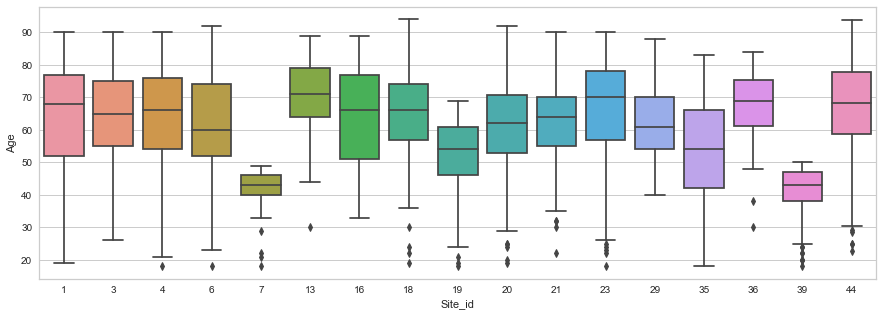

In [103]:
plt.figure(figsize=(15,5))

sns.boxplot(data=phenograph_df,x='Site_id',y='Age',orient="h")

Text(0.5, 0, 'Age')

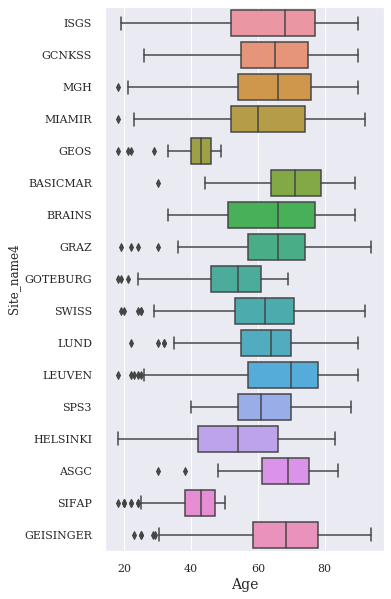

In [134]:
plt.figure(figsize=(5,10))
sns.set_style({'font.family':'serif', 'font.serif':['Times New Roman']})

sns.boxplot(data=phenograph_df,orient="h",x='Age',y='Site_name4').set_xlabel('Age',fontsize=14)

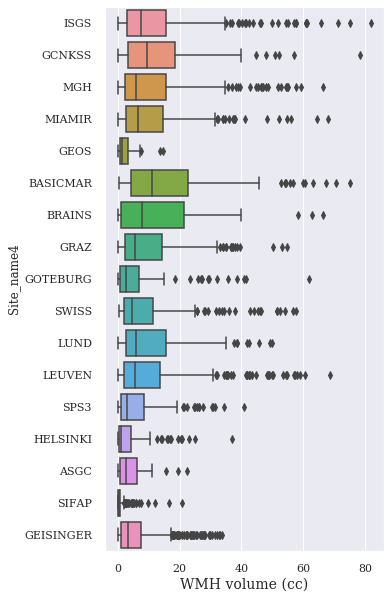

In [133]:
plt.figure(figsize=(5,10))
sns.set_style({'font.family':'serif', 'font.serif':['Times New Roman']})
ax =sns.boxplot(data=phenograph_df,orient="h",x='WMH_volume',y='Site_name4').set_xlabel('WMH volume (cc)',fontsize=14)


[Text(0, 0.5, '')]

<Figure size 360x720 with 0 Axes>

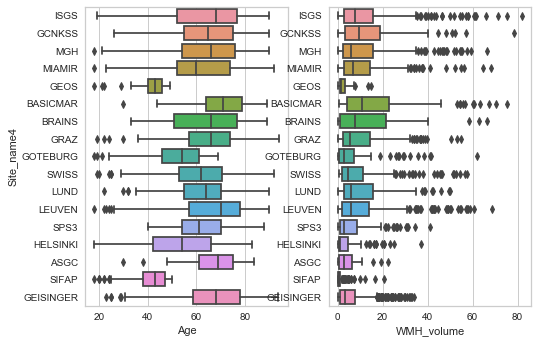

In [115]:
plt.figure(figsize=(5,10))
fig, axes = plt.subplots(1, 2)

g1=sns.boxplot(ax=axes[0],data=phenograph_df,orient="h",x='Age',y='Site_name4')
g2=sns.boxplot(ax=axes[1],data=phenograph_df,orient="h",x='WMH_volume',y='Site_name4')
fig.set(ylabel=None)

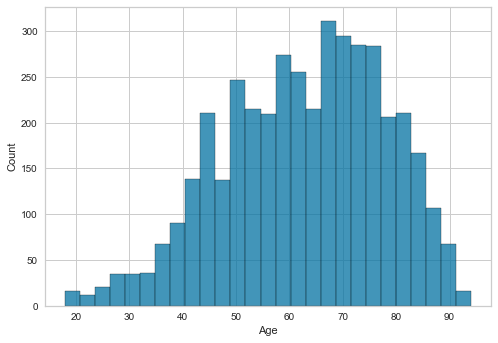

In [78]:
sns.histplot(data=full_phenotype_df,x='Age')

In [81]:
sns.facetplot(data=full_phenotype_df,x='Age',hue='Site_name4')

AttributeError: module 'seaborn' has no attribute 'facetplot'

In [89]:
full_phenotype_df.Site_name4.unique()

array(['ISGS', 'GCNKSS', 'MGH', 'MIAMIR', 'GEOS', 'BASICMAR', 'BRAINS',
       'GRAZ', 'GOTEBURG', 'SWISS', 'LUND', 'LEUVEN', 'SPS3', 'HELSINKI',
       'ASGC', 'SIFAP', 'UNICAMP', 'GEISINGER'], dtype=object)

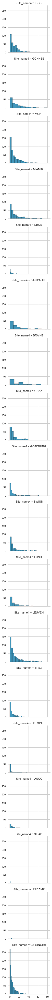

In [87]:
g = sns.FacetGrid(full_phenotype_df, row="Site_name4")
g.map_dataframe(sns.histplot,x="WMH_volume")


In [162]:
for i in range(repeated):
    print('-'*50)
    print('repetition number {}'.format(i))
    site_list = list(X_site.Site.unique())
    site_list.remove('UNICAMP')
    for site in site_list:
        if site == 'UNICAMP':
            pass
        else:
            counter=list((str(i)+site))
            coef_infold=pd.DataFrame(randint,index=X_training_sel.columns,columns=counter)
            print(site)

--------------------------------------------------
repetition number 0
ISGS
GCNKSS
MGH
MIAMIR
GEOS
BASICMAR
BRAINS
GRAZ
GOTEBURG
SWISS
LUND
LEUVEN
SPS3
HELSINKI
ASGC
SIFAP
GEISINGER
--------------------------------------------------
repetition number 1
ISGS
GCNKSS
MGH
MIAMIR
GEOS
BASICMAR
BRAINS
GRAZ
GOTEBURG
SWISS
LUND
LEUVEN
SPS3
HELSINKI
ASGC
SIFAP
GEISINGER
--------------------------------------------------
repetition number 2
ISGS
GCNKSS
MGH
MIAMIR
GEOS
BASICMAR
BRAINS
GRAZ
GOTEBURG
SWISS
LUND
LEUVEN
SPS3
HELSINKI
ASGC
SIFAP
GEISINGER
--------------------------------------------------
repetition number 3
ISGS
GCNKSS
MGH
MIAMIR
GEOS
BASICMAR
BRAINS
GRAZ
GOTEBURG
SWISS
LUND
LEUVEN
SPS3
HELSINKI
ASGC
SIFAP
GEISINGER
--------------------------------------------------
repetition number 4
ISGS
GCNKSS
MGH
MIAMIR
GEOS
BASICMAR
BRAINS
GRAZ
GOTEBURG
SWISS
LUND
LEUVEN
SPS3
HELSINKI
ASGC
SIFAP
GEISINGER
--------------------------------------------------
repetition number 5
ISGS
GCNKSS
MGH
MIA

# Brain Health

Get all predictions with ID to check with clinical (NIHSS)

In [476]:
y_pred_columns = ['y_pred_both']
df_y_pred_both=pd.DataFrame(y_pred_total_both,columns=y_pred_columns,index=index_total)
df_y_pred_both.index=df_y_pred_both.index.set_names('ID')

y_total_columns = ['y_true']
df_y_true_both=pd.DataFrame(y_total_both,columns=y_total_columns,index=index_total)
df_y_true_both.index=df_y_true_both.index.set_names('ID')

y_ground_truth_both_np = np.array(y_total_both)
y_pred_total_both_np = np.array(y_pred_total_both)
y_residual_both = y_pred_total_both_np - y_ground_truth_both_np
residual_both_columns = ['residual_both']
df_y_residual_both=pd.DataFrame(y_residual_both,columns=residual_both_columns,index=index_total)
df_y_residual_both.index=df_y_residual_both.index.set_names('ID')

predictions_both_df=pd.concat([df_y_pred_both,df_y_true_both,df_y_residual_both],axis=1)

In [477]:
from sklearn.preprocessing import MinMaxScaler
scaler100perc = MinMaxScaler(feature_range=(0,100))
Brain_health_perc = pd.DataFrame(predictions_both_df.y_pred_both,index=predictions_both_df.index)
Brain_health_perc = pd.DataFrame(scaler100perc.fit_transform(Brain_health_perc),columns=['Brain_health'],index=Brain_health_perc.index)
Brain_health_perc.Brain_health = (100 - Brain_health_perc.Brain_health)

In [478]:
Brain_health_perc

,Brain_health
ID,
1300002814,22.054039
3900000065,92.595883
3500000020,69.032565
2000001015,49.961921
3900000652,84.167412
...,...
400001526,44.417467
4400001406,72.671553
703039000,80.595870


In [479]:
Brain_health_average = pd.DataFrame(columns=Brain_health_perc.columns,index=Brain_health_perc.index.unique())
for index in Brain_health_perc.index:
    Brain_health_average.loc[index]=Brain_health_perc.loc[index].mean()

In [480]:
df_num_index = df_num.set_index('ID')

In [481]:
prediction_both_average = pd.DataFrame(columns=predictions_both_df.columns,index=predictions_both_df.index.unique())
for index in prediction_both_average.index:
    for columns in predictions_both_df:
        prediction_both_average.loc[index,columns]=predictions_both_df.loc[index,columns].mean()
    prediction_both_average.loc[index,'WMH_volume']=df_num_index.loc[index,'WMH_volume']

In [482]:
prediction_both_average = pd.concat([prediction_both_average,Brain_health_average],axis=1)

In [483]:
prediction_both_average_copy = prediction_both_average

In [484]:
prediction_both_average.to_csv('Brain_health_preds.csv')

In [485]:
df_brain_health = prediction_both_average.merge(df_num_index,how='left',left_index=True,
                                      right_index=True)

In [486]:
test = prediction_both_average.merge(outcomes_SH_df,how='left',left_index=True,
                                      right_index=True).drop('Day triMRS',axis=1).dropna().merge(df_num_index,how='left',left_index=True,
                                      right_index=True)

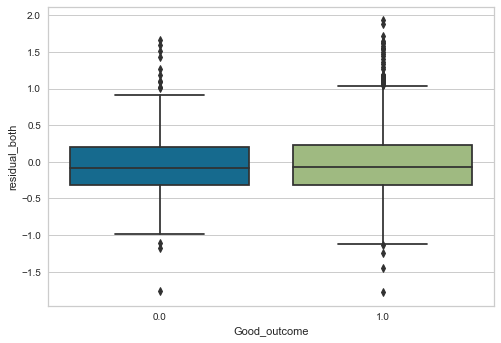

In [487]:
sns.boxplot(x='Good_outcome',y='residual_both',data=test)

In [488]:
for var in test:
    print(var)

y_pred_both
y_true
residual_both
WMH_volume_x
Brain_health
Site
SiteName
Age_x
Sex(F)
CAD_x
DM_x
HTN_x
AF_x
Smoking
PriorStroke
NIHSS
triMRS
Good_outcome
Age_y
Sex
HTN_y
DM_y
AF_y
CAD_y
Smoking_ever
Prior_stroke
Brain_volume
No_csf_brain_vol
Ventricle_volume
WMH_Bvadj
WMH_volume_y
Label
diagnostics_Image-original_Mean
diagnostics_Image-original_Minimum
diagnostics_Image-original_Maximum
diagnostics_Mask-original_VoxelNum
diagnostics_Mask-original_VolumeNum
diagnostics_Image-interpolated_Mean
diagnostics_Image-interpolated_Minimum
diagnostics_Image-interpolated_Maximum
diagnostics_Mask-interpolated_VoxelNum
diagnostics_Mask-interpolated_VolumeNum
diagnostics_Mask-interpolated_Mean
diagnostics_Mask-interpolated_Minimum
diagnostics_Mask-interpolated_Maximum
original_shape_Elongation
original_shape_Flatness
original_shape_LeastAxisLength
original_shape_MajorAxisLength
original_shape_Maximum2DDiameterColumn
original_shape_Maximum2DDiameterRow
original_shape_Maximum2DDiameterSlice
original_s

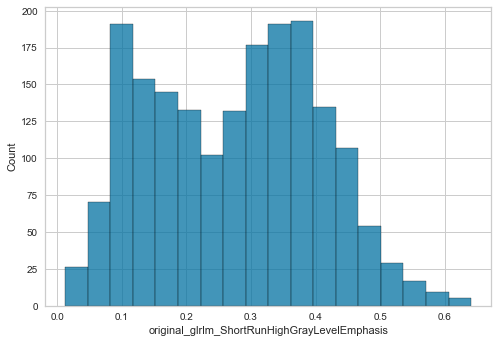

In [489]:
sns.histplot(data=test,x='original_glrlm_ShortRunHighGrayLevelEmphasis')

In [490]:
import statsmodels.api as sm
y_outcome = test.Good_outcome.to_numpy()
#WMH_bvadj_np, _ = stats.boxcox(test.WMH_Bvadj.to_numpy())
WMH_bvadj_np = test.WMH_Bvadj.to_numpy()
sm_model = sm.Logit(y_outcome,WMH_bvadj_np).fit()
print(sm_model.summary())

Optimization terminated successfully.
         Current function value: 0.676950
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1870
Model:                          Logit   Df Residuals:                     1869
Method:                           MLE   Df Model:                            0
Date:                Fri, 26 Mar 2021   Pseudo R-squ.:                 -0.1502
Time:                        12:11:41   Log-Likelihood:                -1265.9
converged:                       True   LL-Null:                       -1100.6
Covariance Type:            nonrobust   LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.4242      0.058      7.332      0.000       0.311       0.538


In [495]:
np.exp(0.4241 )

1.528214407583998

In [492]:
Brainhealth_np = test.Brain_health.to_numpy().astype(float)
brainhealth_model = sm.Logit(y_outcome,Brainhealth_np).fit()
print(brainhealth_model.summary())

Optimization terminated successfully.
         Current function value: 0.572804
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1870
Model:                          Logit   Df Residuals:                     1869
Method:                           MLE   Df Model:                            0
Date:                Fri, 26 Mar 2021   Pseudo R-squ.:                 0.02677
Time:                        12:11:41   Log-Likelihood:                -1071.1
converged:                       True   LL-Null:                       -1100.6
Covariance Type:            nonrobust   LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.0170      0.001     19.610      0.000       0.015       0.019


In [493]:
np.exp(0.0174 )

1.0175522618366473

In [496]:
df_brain_health.to_csv('Brain_health_df.csv')

In [497]:
clinical_brain_health=[
    'y_pred_both',
'y_true',
'residual_both',
'NIHSS',
'WMH_volume_x',
'Brain_health',
'Age',
'Sex',
'HTN',
'DM',
'AF',
'CAD',
'Smoking_ever',
'Prior_stroke',
'Brain_volume',
'No_csf_brain_vol',
'Ventricle_volume',
'WMH_Bvadj',
'WMH_volume_y',
]

In [520]:
df_brain_health_clinical = df_brain_health.filter(clinical_brain_health,axis=1)
df_brain_health_clinical.to_csv('df_brain_health_clinical.csv')

In [499]:
df_brain_health_clinical.residual_both.astype(float).describe()

count    4158.000000
mean        0.002463
std         0.446162
min        -1.780823
25%        -0.295103
50%        -0.039221
75%         0.238098
max         2.568570
Name: residual_both, dtype: float64

In [500]:
df_brain_health_clinical.describe()

,WMH_volume_x,Age,Sex,HTN,DM,AF,CAD,Smoking_ever,Prior_stroke,Brain_volume,No_csf_brain_vol,Ventricle_volume,WMH_Bvadj,WMH_volume_y
count,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000,4158.000000
mean,8.571039,62.806925,0.420154,0.678451,0.165224,0.143098,0.185426,0.319625,0.129389,1467.500014,1262.762960,33.516275,0.589010,8.571039
std,11.222246,15.046035,0.493643,0.467127,0.371427,0.350215,0.388689,0.466387,0.335670,159.522619,158.913507,20.185940,0.764598,11.222246
min,0.001984,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,927.934171,726.060142,0.000000,0.000142,0.001984
25%,1.391192,51.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1355.581171,1149.873448,18.866820,0.095145,1.391192
50%,4.188085,64.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1467.433378,1259.365460,31.820933,0.291235,4.188085
75%,11.213751,74.900000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1574.571543,1371.497968,42.580234,0.778408,11.213751
max,82.098237,94.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2132.480011,2008.840442,200.441112,5.634676,82.098237


In [518]:
resid_Q4 = df_brain_health_clinical[df_brain_health_clinical.residual_both > 0.238]
resid_Q1 = df_brain_health_clinical[df_brain_health_clinical.residual_both < -0.295]
WMH_Q1 = df_brain_health_clinical[df_brain_health_clinical.WMH_volume_x < 1.4]
WMH_Q4 = df_brain_health_clinical[df_brain_health_clinical.WMH_volume_x > 11.2]


In [519]:
WMH_Q4.to_csv('WMH_Q4.csv')
WMH_Q1.to_csv('WMH_Q1.csv')
resid_Q1.to_csv('resid_Q1.csv')
resid_Q4.to_csv('resid_Q4.csv')


In [515]:
stats.mannwhitneyu(resid_Q4.WMH_Bvadj,resid_Q1.WMH_Bvadj)

MannwhitneyuResult(statistic=284522.0, pvalue=1.9579864829369367e-78)

In [516]:
resid_Q4.mean()

y_pred_both           -1.216866
y_true                -1.799034
residual_both          0.582168
WMH_volume_x           6.785255
Brain_health          61.732532
Age                   60.072704
Sex                    0.422115
HTN                    0.635577
DM                     0.142308
AF                     0.130769
CAD                    0.155769
Smoking_ever           0.247115
Prior_stroke           0.119231
Brain_volume        1474.862104
No_csf_brain_vol    1273.466929
Ventricle_volume      34.611842
WMH_Bvadj              0.465399
WMH_volume_y           6.785255
dtype: float64

In [576]:
df_num['WMH_BVnocsfadj']=df_num['WMH_volume']/df_num['No_csf_brain_vol']

In [604]:
merged_inner = pd.merge(left=df_num[['WMH_BVnocsfadj','ID']], right=df_brain_health_clinical.reset_index(), left_on='ID', right_on='ID').set_index('ID')



In [606]:
merged_inner.columns

Index(['WMH_BVnocsfadj', 'y_pred_both', 'y_true', 'residual_both',
       'WMH_volume_x', 'Brain_health', 'Age', 'Sex', 'HTN', 'DM', 'AF', 'CAD',
       'Smoking_ever', 'Prior_stroke', 'Brain_volume', 'No_csf_brain_vol',
       'Ventricle_volume', 'WMH_Bvadj', 'WMH_volume_y'],
      dtype='object')

In [616]:
total_rho_WMHbvadj = list()
total_rho_predicted = list()
total_p_WMHbvadj = list()
total_p_predicted = list()

for var in df_brain_health_clinical:
    if var == 'NIHSS':
        nona_df = df_brain_health_clinical.dropna()
        
        rho,p = stats.spearmanr(nona_df.y_true,nona_df.NIHSS)
        total_rho_WMHbvadj.append(rho)
        total_p_WMHbvadj.append(p)
        rho_pred,p_pred = stats.spearmanr(nona_df.y_pred_both,nona_df[var])
        total_rho_predicted.append(rho_pred)
        total_p_predicted.append(p_pred)
        print('WMHbv corr for {}: {}, p-value: {}'.format(var,round(rho,2),p))
        print('predicted  corr for {}: {}, p-value: {}'.format(var,round(rho_pred,2),p_pred))
    else:       
        rho,p = stats.spearmanr(df_brain_health_clinical.y_true,df_brain_health_clinical[var])
        total_rho_WMHbvadj.append(rho)
        total_p_WMHbvadj.append(p)
        rho_pred,p_pred = stats.spearmanr(df_brain_health_clinical.y_pred_both,df_brain_health_clinical[var])
        total_rho_predicted.append(rho_pred)
        total_p_predicted.append(p_pred)
        print('WMHbv corr for {}: {}, p-value: {}'.format(var,round(rho,2),p))
        print('predicted  corr for {}: {}, p-value: {}'.format(var,round(rho_pred,2),p_pred))



WMHbv corr for y_pred_both: 0.94, p-value: 0.0
predicted  corr for y_pred_both: 1.0, p-value: 0.0
WMHbv corr for y_true: 1.0, p-value: 0.0
predicted  corr for y_true: 0.94, p-value: 0.0
WMHbv corr for residual_both: -0.34, p-value: 1.445169472692927e-110
predicted  corr for residual_both: -0.05, p-value: 0.0010970943507235763
WMHbv corr for WMH_volume_x: 1.0, p-value: 0.0
predicted  corr for WMH_volume_x: 0.94, p-value: 0.0
WMHbv corr for Brain_health: -0.94, p-value: 0.0
predicted  corr for Brain_health: -1.0, p-value: 0.0
WMHbv corr for Age: 0.56, p-value: 0.0
predicted  corr for Age: 0.6, p-value: 0.0
WMHbv corr for Sex: 0.02, p-value: 0.14793211636213263
predicted  corr for Sex: 0.01, p-value: 0.380927398301389
WMHbv corr for HTN: 0.27, p-value: 1.3357348937299103e-68
predicted  corr for HTN: 0.28, p-value: 6.431024307467284e-75
WMHbv corr for DM: 0.14, p-value: 5.54804884711691e-19
predicted  corr for DM: 0.15, p-value: 2.8682315753431077e-21
WMHbv corr for AF: 0.14, p-value: 1.03

In [617]:
Corr_table = pd.DataFrame([total_rho_WMHbvadj,total_p_WMHbvadj,total_rho_predicted,total_p_predicted]).T
Corr_table.columns=['total_rho_WMHbvadj','total_p_WMHbvadj','total_rho_predicted','total_p_predicted']
Corr_table.index=df_brain_health_clinical.columns

In [618]:
Corr_table

,total_rho_WMHbvadj,total_p_WMHbvadj,total_rho_predicted,total_p_predicted
y_pred_both,0.942841,0.000000e+00,1.000000,0.000000e+00
y_true,1.000000,0.000000e+00,0.942841,0.000000e+00
residual_both,-0.336433,1.445169e-110,-0.050607,1.097094e-03
WMH_volume_x,0.996928,0.000000e+00,0.938257,0.000000e+00
Brain_health,-0.942841,0.000000e+00,-1.000000,0.000000e+00
Age,0.558136,0.000000e+00,0.601476,0.000000e+00
Sex,0.022442,1.479321e-01,0.013591,3.809274e-01
HTN,0.266606,1.335735e-68,0.278459,6.431024e-75
DM,0.137419,5.548049e-19,0.146077,2.868232e-21
AF,0.140235,1.037577e-19,0.159936,3.160997e-25


In [511]:
import statsmodels
p_FDR_WMHadj = pd.DataFrame(statsmodels.stats.multitest.fdrcorrection(Corr_table.total_p_predicted))
p_FDR_WMHadj.T

,0,1
0,True,0.000000
1,True,0.000000
2,True,0.001162
3,True,0.000000
4,True,0.000000
5,True,0.000000
6,False,0.380927
7,True,0.000000
8,True,0.000000
9,True,0.000000


In [526]:
df_brain_health_clinical

,y_pred_both,y_true,residual_both,WMH_volume_x,Brain_health,Age,Sex,HTN,DM,AF,CAD,Smoking_ever,Prior_stroke,Brain_volume,No_csf_brain_vol,Ventricle_volume,WMH_Bvadj,WMH_volume_y
ID,,,,,,,,,,,,,,,,,,
1300002814,1.457986,1.467961,-0.009974,54.586652,21.726921,86.0,1,1,0,1,0,0,0,1469.954314,1191.551847,38.125538,3.713493,54.586652
3900000065,-3.264755,-2.547475,-0.717280,0.552723,92.361162,50.0,1,0,0,0,0,0,0,1463.071926,1361.184356,1.140075,0.037778,0.552723
3500000020,-1.731436,-2.183761,0.452325,1.107953,69.428548,79.0,0,0,0,0,0,0,0,1617.478539,1349.309765,41.402862,0.068499,1.107953
2000001015,-0.455596,-0.158543,-0.297053,9.797581,50.346834,51.0,1,1,0,1,0,0,1,1150.444079,1001.672677,29.432722,0.851635,9.797581
3900000652,-2.800015,-3.550654,0.750639,0.055018,85.410415,48.0,0,1,0,0,0,0,0,1628.007832,1450.624162,17.367111,0.003379,0.055018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1900000823,-2.538871,-3.271515,0.732644,0.154980,81.504700,30.0,1,0,0,0,0,0,0,1274.312626,1134.922153,8.712811,0.012162,0.154980
2300000829,-1.826634,-1.822114,-0.004520,1.818869,70.852336,70.0,0,0,0,0,0,0,0,1576.038273,1374.427413,41.048273,0.115408,1.818869
400000601,0.534092,0.251280,0.282811,21.151026,35.544867,73.0,0,1,0,1,1,1,0,1653.665988,1488.623962,30.802584,1.279039,21.151026


In [537]:
df_OLS = df_brain_health_clinical.filter(['residual_both','Age','HTN'],axis=1).dropna()

In [419]:
stats.spearmanr(df_brain_health_clinical.y_pred_both,df_brain_health_clinical.Sex)

SpearmanrResult(correlation=0.012968745620098983, pvalue=0.40313150990765756)

In [649]:
df_brain_health_clinical

,y_pred_both,y_true,residual_both,WMH_volume_x,Brain_health,Age,Sex,HTN,DM,AF,CAD,Smoking_ever,Prior_stroke,Brain_volume,No_csf_brain_vol,Ventricle_volume,WMH_Bvadj,WMH_volume_y
ID,,,,,,,,,,,,,,,,,,
1300002814,1.457986,1.467961,-0.009974,54.586652,21.726921,86.0,1,1,0,1,0,0,0,1469.954314,1191.551847,38.125538,3.713493,54.586652
3900000065,-3.264755,-2.547475,-0.717280,0.552723,92.361162,50.0,1,0,0,0,0,0,0,1463.071926,1361.184356,1.140075,0.037778,0.552723
3500000020,-1.731436,-2.183761,0.452325,1.107953,69.428548,79.0,0,0,0,0,0,0,0,1617.478539,1349.309765,41.402862,0.068499,1.107953
2000001015,-0.455596,-0.158543,-0.297053,9.797581,50.346834,51.0,1,1,0,1,0,0,1,1150.444079,1001.672677,29.432722,0.851635,9.797581
3900000652,-2.800015,-3.550654,0.750639,0.055018,85.410415,48.0,0,1,0,0,0,0,0,1628.007832,1450.624162,17.367111,0.003379,0.055018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1900000823,-2.538871,-3.271515,0.732644,0.154980,81.504700,30.0,1,0,0,0,0,0,0,1274.312626,1134.922153,8.712811,0.012162,0.154980
2300000829,-1.826634,-1.822114,-0.004520,1.818869,70.852336,70.0,0,0,0,0,0,0,0,1576.038273,1374.427413,41.048273,0.115408,1.818869
400000601,0.534092,0.251280,0.282811,21.151026,35.544867,73.0,0,1,0,1,1,1,0,1653.665988,1488.623962,30.802584,1.279039,21.151026


In [655]:
CCS_brain_health.isna().sum()

y_pred_both            0
y_true                 0
residual_both          0
WMH_volume_x           0
Brain_health           0
Age                    0
Sex                    0
HTN                    0
DM                     0
AF                     0
CAD                    0
Smoking_ever           0
Prior_stroke           0
Brain_volume           0
No_csf_brain_vol       0
Ventricle_volume       0
WMH_Bvadj              0
WMH_volume_y           0
CCS5_Item           1589
dtype: int64

In [656]:
#CCS_brain_health=pd.merge(left=df_brain_health_clinical.reset_index(), right=full_phenotype_df[['ID','CCS5_Item']], left_on='ID', right_on='ID').set_index('ID')
CCS_brain_health=df_brain_health_clinical.join(full_phenotype_df.CCS5_Item)

In [658]:
CCS_brain_health.reset_index().to_csv('CCS_brainHealth.csv')

In [659]:
CCS_brain_health

,y_pred_both,y_true,residual_both,WMH_volume_x,Brain_health,Age,Sex,HTN,DM,AF,CAD,Smoking_ever,Prior_stroke,Brain_volume,No_csf_brain_vol,Ventricle_volume,WMH_Bvadj,WMH_volume_y,CCS5_Item
ID,,,,,,,,,,,,,,,,,,,
1300002814,1.457986,1.467961,-0.009974,54.586652,21.726921,86.0,1,1,0,1,0,0,0,1469.954314,1191.551847,38.125538,3.713493,54.586652,CEmajor
3900000065,-3.264755,-2.547475,-0.717280,0.552723,92.361162,50.0,1,0,0,0,0,0,0,1463.071926,1361.184356,1.140075,0.037778,0.552723,NaN
3500000020,-1.731436,-2.183761,0.452325,1.107953,69.428548,79.0,0,0,0,0,0,0,0,1617.478539,1349.309765,41.402862,0.068499,1.107953,NaN
2000001015,-0.455596,-0.158543,-0.297053,9.797581,50.346834,51.0,1,1,0,1,0,0,1,1150.444079,1001.672677,29.432722,0.851635,9.797581,UNDETERMINED
3900000652,-2.800015,-3.550654,0.750639,0.055018,85.410415,48.0,0,1,0,0,0,0,0,1628.007832,1450.624162,17.367111,0.003379,0.055018,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1900000823,-2.538871,-3.271515,0.732644,0.154980,81.504700,30.0,1,0,0,0,0,0,0,1274.312626,1134.922153,8.712811,0.012162,0.154980,UNDETERMINED
2300000829,-1.826634,-1.822114,-0.004520,1.818869,70.852336,70.0,0,0,0,0,0,0,0,1576.038273,1374.427413,41.048273,0.115408,1.818869,UNDETERMINED
400000601,0.534092,0.251280,0.282811,21.151026,35.544867,73.0,0,1,0,1,1,1,0,1653.665988,1488.623962,30.802584,1.279039,21.151026,OTHER


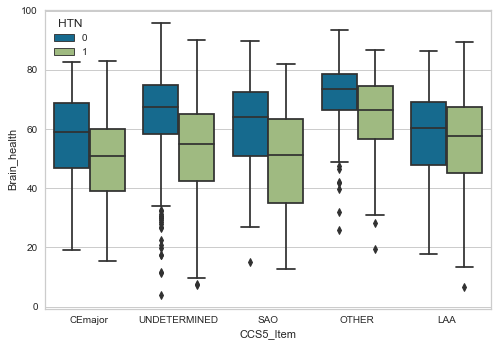

In [637]:
sns.boxplot(data=CCS_brain_health,x='CCS5_Item',y='Brain_health',hue="HTN")

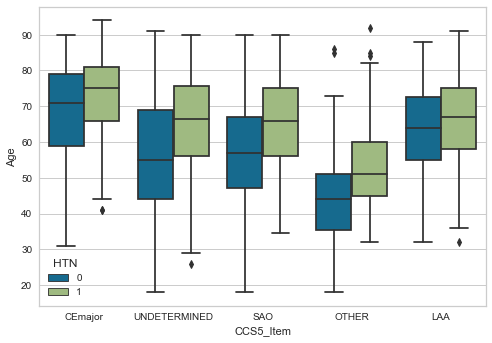

In [633]:
sns.boxplot(data=CCS_brain_health,x='CCS5_Item',y='Age',hue='HTN')

In [49]:
NIHSS_df = full_phenotype_df.NIHSS
NIHSS_df.index=NIHSS_df.index.set_names('ID')
predictions_both_df=predictions_both_df.join(NIHSS_df)
predictions_both_NIHSS=predictions_both_df.dropna()
predictions_both_NIHSS.NIHSS=predictions_both_NIHSS.NIHSS.astype(int)

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/pandas/core/generic.py:5489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


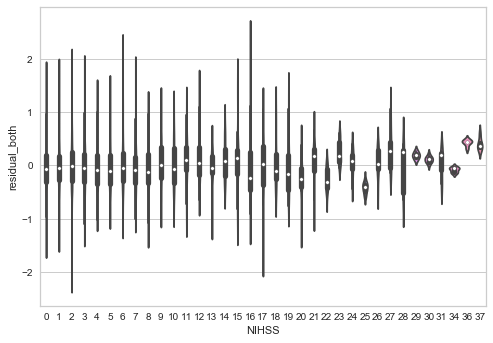

In [540]:
predictions_both_NIHSS.sort_values(by='NIHSS')
ax = sns.violinplot(x="NIHSS", y="residual_both", data=predictions_both_NIHSS,aspect=5)

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


number of CV repetitions: 30
R2 mean : 0.86 +/- 0.01
Confidence interval: 0.855 - 0.862


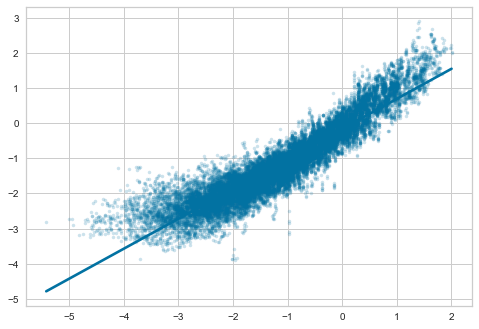

In [13]:

sns.regplot(y_total_both,y_pred_total_both,scatter_kws={'alpha':0.2},marker=".")
print('number of CV repetitions: {}'.format(i+1))
print('R2 mean : {0} +/- {1}'.format(round(r2_total_both.mean(),2),round(r2_total_both.std(),2)))
CI_long=sms.DescrStatsW(r2_total_both).tconfint_mean()


print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [14]:
X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20)
y_bc, lambda_bc = stats.boxcox(y_training)

,y_pred_both,y_true,residual_both,NIHSS
ID,,,,
100000001,-0.621298,-0.401077,-0.220222,NaN
100000001,-0.621298,-0.401077,-0.191650,NaN
100000001,-0.621298,-0.401077,-0.217671,NaN
100000001,-0.621298,-0.401077,-0.249473,NaN
100000001,-0.621298,-0.401077,-0.240924,NaN
...,...,...,...,...
4400001654,-0.556447,-0.379854,-0.117152,1.0
4400001654,-0.556447,-0.379854,-0.123646,1.0
4400001654,-0.556447,-0.379854,0.047649,1.0


In [17]:
y_total_both_Invbc = inv_boxcox(y_pred_total_both,lambda_bc)
y_total_both_Invbc

array([3.94041506, 0.00952514, 0.17854487, ..., 0.03627618, 0.56830725,
       0.06464501])

In [18]:
y_total_both_Invbc_df = pd.DataFrame(y_total_both_Invbc)
bc_df = pd.DataFrame(y_total_both)

In [19]:
y_total_both_Invbc_df=y_total_both_Invbc_df.join(bc_df, lsuffix='invvc',rsuffix='bc').sort_values(by=['0invvc'])
y_total_both_Invbc_df

,0invvc,0bc
2444,0.001994,-1.963633
10230,0.002105,-3.708119
11480,0.002161,-2.023916
4720,0.002161,-2.017149
2658,0.002205,-1.978466
...,...,...
9723,8.976922,1.376913
12566,9.118420,1.657076
21621,9.423643,1.403793
5022,10.216543,1.387359


In [20]:
y_total_both_Invbc_df.to_csv('inv_boxcoxvalues.csv')


/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


number of CV repetitions: 30
R2 mean : 0.86 +/- 0.01
Confidence interval: 0.855 - 0.862


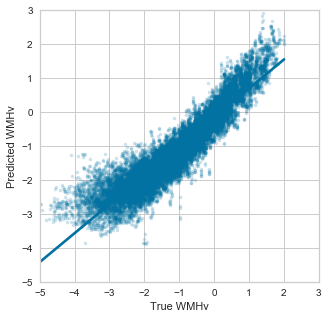

In [116]:

regplot = sns.regplot(y_total_both,y_pred_total_both,
            scatter_kws={'alpha':0.2},marker=".")
regplot.figure.set_size_inches(5, 5)
regplot.set(xlabel='True WMHv', ylabel='Predicted WMHv')
regplot.set(ylim=(-5, 3))
regplot.set(xlim=(-5, 3))

figure = regplot.get_figure()
figure.savefig('./CV_pred_WMHv_both_400dpi.png', dpi=400)


#sns.despine()

print('number of CV repetitions: {}'.format(i+1))
print('R2 mean : {0} +/- {1}'.format(round(r2_total_both.mean(),2),round(r2_total_both.std(),2)))
CI_long=sms.DescrStatsW(r2_total_both).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]
/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/matplotlib/cbook/__i

R2 mean : 0.858 +/- 0.0097
Confidence interval: 0.855 - 0.862


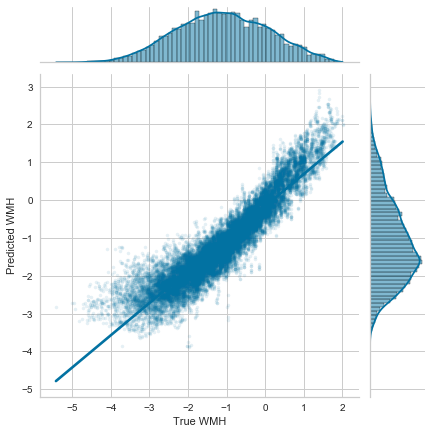

In [117]:
def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2
ax=sns.jointplot(y_total_both,y_pred_total_both, kind="reg", 
                 #stat_func=r2,
             scatter_kws={'alpha':0.1},marker="."
             )

ax.set_axis_labels("True WMH", "Predicted WMH")

print('R2 mean : {0} +/- {1}'.format(round(r2_total_both.mean(),3),round(r2_total_both.std(),4)))
CI_long=sms.DescrStatsW(r2_total_both).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


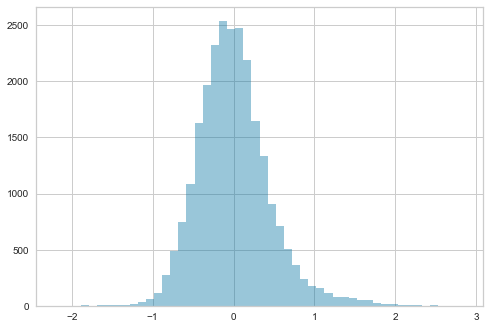

In [118]:
y_total_both_copy = y_total_both
y_pred_total_both_copy = y_pred_total_both


y_ground_truth_both_np = np.array(y_total_both)
y_pred_total_both_np = np.array(y_pred_total_both)
y_residual_both = y_pred_total_both_np - y_ground_truth_both_np
sns.distplot(y_residual_both, kde=False, rug=False)

In [119]:


upper_tail_resid_both = np.extract(y_residual_both>1,y_residual_both)
print("residual >1 : {}".format(round(upper_tail_resid_both.sum()),0))
lower_tail_resid_both = np.extract(y_residual_both<-1,y_residual_both)
print("residual <-1 : {}".format(round(abs(lower_tail_resid_both.sum())),0))


residual >1 : 987
residual <-1 : 156


In [120]:
coefs_both_sorted = coefs_both_nona.describe().T.sort_values(by='std')
coefs_both_sorted_index = coefs_both_sorted.index
coefs_both_sorted_columns = coefs_both_sorted.columns
coefs_both_sorted_abs = abs(coefs_both_sorted.values)

In [121]:
0.011866/0.113846

0.10422851922772869

In [122]:
coef_var_index=['coef_variation']
coefs_both_sorted_coef_var = pd.DataFrame(abs(coefs_both_sorted[["std"]].values/coefs_both_sorted[["mean"]].values),index=coefs_both_sorted.T.columns.to_list(),columns=coef_var_index).join(coefs_both_sorted)
coefs_both_sorted_coef_var = coefs_both_sorted_coef_var.sort_values(by='coef_variation',ascending=True)
coefs_both_sorted_coef_var.to_csv('coef_variation_radiomicsign_with_clinical.csv')
coefs_both_sorted_coef_var


,coef_variation,count,mean,std,min,25%,50%,75%,max
log-sigma-2-0-mm-3D_glrlm_ShortRunLowGrayLevelEmphasis,0.049157,30.0,0.957546,0.047070,0.797550,0.941581,0.953138,0.979244,1.041081
original_glszm_ZoneEntropy,0.081753,30.0,0.159327,0.013025,0.133591,0.150622,0.159673,0.169628,0.180144
original_glrlm_RunVariance,0.100777,30.0,-0.417063,0.042030,-0.500518,-0.446896,-0.418557,-0.389974,-0.326262
wavelet-HL_firstorder_Skewness,0.102066,30.0,-0.064160,0.006549,-0.077548,-0.068086,-0.064383,-0.060303,-0.051975
original_glrlm_RunLengthNonUniformityNormalized,0.103746,30.0,-0.607546,0.063030,-0.712734,-0.654220,-0.623831,-0.563136,-0.441092
wavelet-HH_glrlm_GrayLevelNonUniformityNormalized,0.134224,30.0,-0.055223,0.007412,-0.072964,-0.058818,-0.054869,-0.050599,-0.040705
wavelet-HH_glrlm_GrayLevelVariance,0.135228,30.0,0.054982,0.007435,0.040367,0.049941,0.054714,0.058341,0.072696
wavelet-HL_glrlm_HighGrayLevelRunEmphasis,0.135445,30.0,-0.056580,0.007663,-0.068553,-0.062383,-0.058152,-0.051249,-0.038350
wavelet-HL_glrlm_LowGrayLevelRunEmphasis,0.135531,30.0,0.056542,0.007663,0.038321,0.051256,0.057651,0.062389,0.068533
Smoking_ever,0.136516,30.0,0.050698,0.006921,0.039755,0.046093,0.049983,0.054167,0.065608


In [123]:
coefs_both_sorted_coef_var.shape

(75, 9)

In [ ]:
X = df_num.drop(['ID','Label',
'WMH_volume',
'WMH_Bvadj',
'Brain_volume',
'Ventricle_volume',
'No_csf_brain_vol',
#'AF',
#'Age',
#'DM',
#'HTN',
#'CAD',
#'Sex',
#'Smoking_ever',
                 ],axis = 1)

# Dropping surface and volume confounding variables
#X = X.drop(X.filter(regex='_Surface').columns, axis=1)
#X = X.drop(X.filter(regex='_Voxel').columns, axis=1)
#X = X.drop(X.filter(regex='_Volume').columns, axis=1)
#X = X.drop(X.filter(regex='_shape').columns, axis=1)


#Selecting filtered variables
X = X.drop(X.filter(regex='wavelet2').columns, axis=1)
X = X.drop(X.filter(regex='wavelet3').columns, axis=1)

#X = X.drop(X.filter(regex='lbp').columns, axis=1)
X = X.drop(X.filter(regex='gradient').columns, axis=1)
X = X.drop(X.filter(regex='exponential').columns, axis=1)
X = X.drop(X.filter(regex='logarithm').columns, axis=1)
X = X.drop(X.filter(regex='squareroot').columns, axis=1)
X = X.drop(X.filter(regex='square').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-1-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-3-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma').columns, axis=1)

X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='original').columns, axis=1)
#X = X.drop(X.filter(regex='diagnostics').columns, axis=1)
   

# Dropping heavily volume confounded variables
#X = X.drop(X.filter(regex='_RootMeanSquared').columns, axis=1)
#X = X.drop(X.filter(regex='_Energy').columns, axis=1)
#X = X.drop(X.filter(regex='_TotalEnergy').columns, axis=1)
#X = X.drop(X.filter(regex='_Coarseness').columns, axis=1)
#X = X.drop(X.filter(regex='Emphasis').columns, axis=1)
#X = X.drop(X.filter(regex='Uniformity').columns, axis=1)
#X = X.drop(X.filter(regex='Strength').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='ZoneVariance').columns, axis=1)
#X = X.drop(X.filter(regex='Busyness').columns, axis=1)


#X = X.drop(X.filter(regex='firstorder').columns, axis=1)
#X = X.drop(X.filter(regex='glcm').columns, axis=1)
#X = X.drop(X.filter(regex='gldm').columns, axis=1)
#X = X.drop(X.filter(regex='ngtdm').columns, axis=1)
#X = X.drop(X.filter(regex='glrlm').columns, axis=1)
#X = X.drop(X.filter(regex='glszm').columns, axis=1)

#X = X.drop(X.filter(regex='Volume').columns, axis=1)

#X = X.drop(X.filter(regex='Maximum').columns, axis=1)
##X = X.drop(X.filter(regex='Sphericity').columns, axis=1)
#X = X.drop(X.filter(regex='Length').columns, axis=1)
#X = X.drop(X.filter(regex='Elongation').columns, axis=1)
#X = X.drop(X.filter(regex='Flatness').columns, axis=1)






y = df_num.WMH_Bvadj

columns_names = X.columns

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
#scaler = RobustScaler()
scaler=StandardScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64)
y_pred_total_both=[]
y_total_both =[]
r2_total_both=[]
all_selected_features =[]
coefs_both=pd.DataFrame(index=df_num.columns)

y_len = y.shape[-1]
bins = np.linspace(0, y_len, 50)
y_binned = np.digitize(y, bins)
X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20, random_state=0,stratify=y_binned)

y_len2 = y_training.shape[-1]
bins2 = np.linspace(0, y_len, 50)
y_binned2 = np.digitize(y_training, bins)
X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=0,stratify=y_binned2)

#impute data
X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names)
X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names)
X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names)
#box cox transform y
y_training, _ = stats.boxcox(y_training)
y_test, _ = stats.boxcox(y_test)
y_final, _ = stats.boxcox(y_final)
#scale units
X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names)
X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names)
X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names)

list_s =[]
list_score =[]

for s in range(1,coefs_both_sorted_coef_var.shape[0]):
    selected_both=coefs_both_sorted_coef_var.sort_values(by='coef_variation')[:s].T.columns.to_list()
    X_test_sel = X_test.filter(selected_both)
    X_final_sel = X_final.filter(selected_both)
    X_training_sel = X_training.filter(selected_both)
    LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64).fit(X_test_sel,y_test)
    alpha_tuned=LassoCV_tuning.alpha_
    l1_ratio_tuned=LassoCV_tuning.l1_ratio_

    lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
    lasso_reg.fit(X_training_sel, y_training)

      #scoring on final set
    print('predictions with {} features'.format(s))
    visualizer = PredictionError(lasso_reg)
    visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
    visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
    visualizer.show() 
    list_s.append(s)
    list_score.append(visualizer.score_)

In [ ]:
print("features included by order of coefficient of variation")
ax = plt.gca()
ax.plot(list_s, list_score)
ax.set_xscale('linear')
ax.set_xlim(ax.get_xlim()[::])  # reverse axis
plt.xlabel('number of features')
plt.ylabel('scores')
plt.title('R2 score as a function of the number of included features')
plt.axis('tight')
plt.show()

In [ ]:
coefs_both_sorted.sort_values(by='std')[:6].T.columns.to_list()

In [ ]:
coefs_both_sorted.sort_values(by='std')

In [ ]:
X_test_sel = X_test.filter(selected_both)
X_final_sel = X_final.filter(selected_both)
X_training_sel = X_training.filter(selected_both)
LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64).fit(X_test_sel,y_test)
alpha_tuned=LassoCV_tuning.alpha_
l1_ratio_tuned=LassoCV_tuning.l1_ratio_

lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
lasso_reg.fit(X_training_sel, y_training)

      #scoring on final set
visualizer = PredictionError(lasso_reg)
visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
visualizer.show() 

In [ ]:
coefs_both_sorted.sort_values(by='mean')

In [ ]:
coefs_both_sorted_abs_df = pd.DataFrame(coefs_both_sorted_abs,index=coefs_both_sorted_index,columns=coefs_both_sorted_columns)

In [ ]:
coefs_both_sorted_abs_df.sort_values(by='mean')

In [ ]:
# clinical only

In [ ]:
X = df_num

clinical = [
'Age',
'Sex',
'HTN',
'DM',
'AF',
'CAD',
'Smoking_ever',
'Prior_stroke',
#'WMH_volume',
#'WMH_Bvadj',
#'Brain_volume',
#'No_csf_brain_vol',
#'Ventricle_volume',
]

X = X.filter(clinical)
X.describe()

In [ ]:
df_num.WMH_volume.describe()

In [ ]:
X = df_num

clinical = [
'Age',
'Sex',
'HTN',
'DM',
'AF',
'CAD',
'Smoking_ever',
'Prior_stroke',
#'WMH_volume',
#'WMH_Bvadj',
#'Brain_volume',
#'No_csf_brain_vol',
#'Ventricle_volume',
]

X = X.filter(clinical)

y = df_num.WMH_Bvadj

columns_names = X.columns

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
scaler=StandardScaler()
#scaler = RobustScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=100000,verbose=True,n_jobs=64)
y_pred_total_clinical=[]
y_total_clinical =[]
r2_total_clinical=[]
all_selected_features =[]
coefs_clinical=pd.DataFrame(index=df_num.columns)

for i in range(repeated):
    #split train test
    
    y_len = y.shape[-1]
    bins = np.linspace(0, y_len, 50)
    y_binned = np.digitize(y, bins)
    X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20, random_state=i,stratify=y_binned)

    y_len2 = y_training.shape[-1]
    bins2 = np.linspace(0, y_len, 50)
    y_binned2 = np.digitize(y_training, bins)
    X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=0,stratify=y_binned2)

    #impute data
    X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names)
    X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names)
    X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names)
    #box cox transform y
    y_training, _ = stats.boxcox(y_training)
    y_test, _ = stats.boxcox(y_test)
    y_final, _ = stats.boxcox(y_final)
    #scale units
    X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names)
    X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names)
    X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names)

    #feature selection using lassoCV
    lassoCV.fit(X_training,y_training)
    selector = SelectFromModel(lassoCV,prefit=True)
    print('alpha in fold {0}: {1}'.format(i,lassoCV.alpha_))
    selected_feat = X_training.columns[(selector.get_support())]
    all_selected_features.append(selected_feat)
    print('selected features: {0}/{1} total number of features'.format(len(selected_feat),(X_training.shape[1])))
    X_training_sel = X_training.filter(selected_feat)
    X_test_sel = X_test.filter(selected_feat)
    X_final_sel = X_final.filter(selected_feat)
    
          #tuning on test set
    LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64).fit(X_test_sel,y_test)
    alpha_tuned=LassoCV_tuning.alpha_
    l1_ratio_tuned=LassoCV_tuning.l1_ratio_

    lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
    lasso_reg.fit(X_training_sel, y_training)
          
          #scoring on final set
    visualizer = PredictionError(lasso_reg)
    visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
    visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
    visualizer.show() 
    
    #prepare plots
    y_pred_infold=lasso_reg.predict(X_final_sel)
    y_pred_total_clinical.extend(y_pred_infold)
    y_total_clinical.extend(y_final)
    r2_total_clinical.append(visualizer.score_)
    
    #prepare coefs
    counter=[i]
    coef_infold=pd.DataFrame(lasso_reg.coef_,index=X_training_sel.columns,columns=counter)
    coefs_clinical=coefs_clinical.join(coef_infold)#,rsuffix=i)
r2_total_clinical=np.array(r2_total_clinical)
coefs_clinical_nona=coefs_clinical.dropna().T





In [ ]:

sns.regplot(y_total_clinical,y_pred_total_clinical,scatter_kws={'alpha':0.2},marker=".")
print('R2 mean : {0} +/- {1}'.format(round(r2_total_clinical.mean(),2),round(r2_total_clinical.std(),2)))
CI_long=sms.DescrStatsW(r2_total_clinical).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [ ]:
def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2
ax=sns.jointplot(y_total_clinical,y_pred_total_clinical, kind="reg",scatter_kws={'alpha':0.1},marker="."
             )

ax.set_axis_labels("True WMH", "Predicted WMH")
print('R2 mean : {0} +/- {1}'.format(round(r2_total_clinical.mean(),3),round(r2_total_clinical.std(),3)))
CI_long=sms.DescrStatsW(r2_total_clinical).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [ ]:
coefs_clinical.T.filter(clinical).describe().T.fillna(0)

In [ ]:
for var in df_num:
    print(var)

In [ ]:
X = df_num

clinical = [
'Age',
'Sex',
'HTN',
'DM',
'AF',
'CAD',
'Smoking_ever',
'Prior_stroke',
#'WMH_volume',
#'WMH_Bvadj',
'Brain_volume',
#'No_csf_brain_vol',
#'Ventricle_volume',
#    'diagnostics_Mask-resegmented_VoxelNum'
]

X = X.filter(clinical)

y = df_num.WMH_Bvadj

columns_names = X.columns

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
scaler=StandardScaler()
#scaler = RobustScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=100000,verbose=True,n_jobs=64)
y_pred_total_clinical=[]
y_total_clinical =[]
r2_total_clinical=[]
all_selected_features =[]
coefs_clinical=pd.DataFrame(index=df_num.columns)

for i in range(repeated):
    #split train test
    
    y_len = y.shape[-1]
    bins = np.linspace(0, y_len, 50)
    y_binned = np.digitize(y, bins)
    X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20, random_state=i,stratify=y_binned)

    y_len2 = y_training.shape[-1]
    bins2 = np.linspace(0, y_len, 50)
    y_binned2 = np.digitize(y_training, bins)
    X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=0,stratify=y_binned2)

    #impute data
    X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names)
    X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names)
    X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names)
    #box cox transform y
    y_training, _ = stats.boxcox(y_training)
    y_test, _ = stats.boxcox(y_test)
    y_final, _ = stats.boxcox(y_final)
    #scale units
    X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names)
    X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names)
    X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names)

    #feature selection using lassoCV
    lassoCV.fit(X_training,y_training)
    selector = SelectFromModel(lassoCV,prefit=True)
    print('alpha in fold {0}: {1}'.format(i,lassoCV.alpha_))
    selected_feat = X_training.columns[(selector.get_support())]
    all_selected_features.append(selected_feat)
    print('selected features: {0}/{1} total number of features'.format(len(selected_feat),(X_training.shape[1])))
    X_training_sel = X_training.filter(selected_feat)
    X_test_sel = X_test.filter(selected_feat)
    X_final_sel = X_final.filter(selected_feat)
    
          #tuning on test set
    LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64).fit(X_test_sel,y_test)
    alpha_tuned=LassoCV_tuning.alpha_
    l1_ratio_tuned=LassoCV_tuning.l1_ratio_

    lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
    lasso_reg.fit(X_training_sel, y_training)
          
          #scoring on final set
    visualizer = PredictionError(lasso_reg)
    visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
    visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
    visualizer.show() 
    
    #prepare plots
    y_pred_infold=lasso_reg.predict(X_final_sel)
    y_pred_total_clinical.extend(y_pred_infold)
    y_total_clinical.extend(y_final)
    r2_total_clinical.append(visualizer.score_)
    
    #prepare coefs
    counter=[i]
    coef_infold=pd.DataFrame(lasso_reg.coef_,index=X_training_sel.columns,columns=counter)
    coefs_clinical=coefs_clinical.join(coef_infold)#,rsuffix=i)
r2_total_clinical=np.array(r2_total_clinical)
coefs_clinical_nona=coefs_clinical.dropna().T





In [ ]:
def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2
ax=sns.jointplot(y_total_clinical,y_pred_total_clinical, kind="reg", scatter_kws={'alpha':0.1},marker="."
             )

ax.set_axis_labels("True WMH", "Predicted WMH")
print('R2 mean : {0} +/- {1}'.format(round(r2_total_clinical.mean(),3),round(r2_total_clinical.std(),3)))
CI_long=sms.DescrStatsW(r2_total_clinical).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [ ]:
coefs_clinical.T.filter(clinical).describe().T.fillna(0)

# only radiomics

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    9.6s finished


alpha in fold 0: 0.001444587448286327
selected features: 155/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    2.3s finished


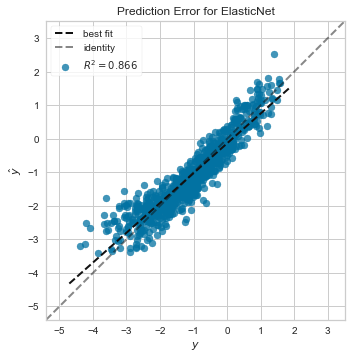

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.1s finished


alpha in fold 1: 0.0014360772157965918
selected features: 148/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.8s finished


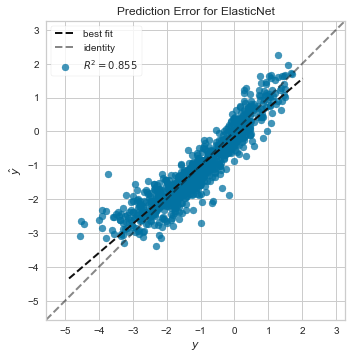

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.4s finished


alpha in fold 2: 0.001442652412050274
selected features: 151/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.4s finished


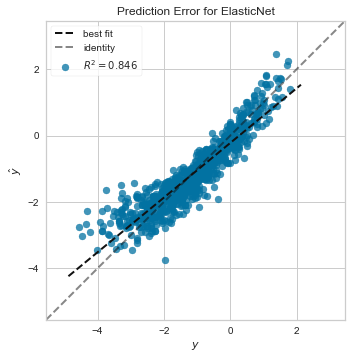

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    6.8s finished


alpha in fold 3: 0.0014030681348325307
selected features: 160/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.9s finished


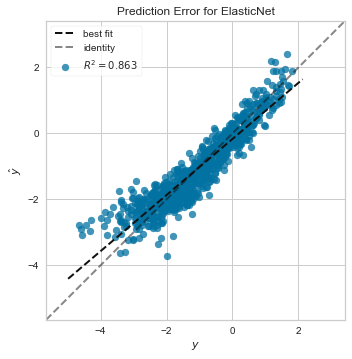

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.7s finished


alpha in fold 4: 0.00142134290164403
selected features: 148/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.5s finished


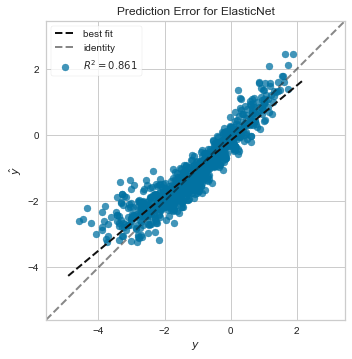

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.9s finished


alpha in fold 5: 0.001460092490938528
selected features: 148/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.7s finished


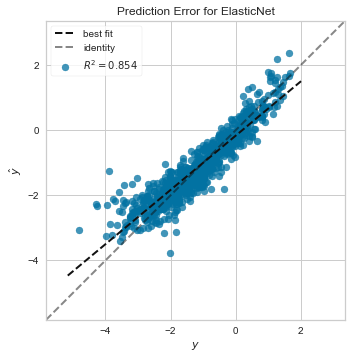

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.5s finished


alpha in fold 6: 0.0014254480747880592
selected features: 146/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    2.0s finished


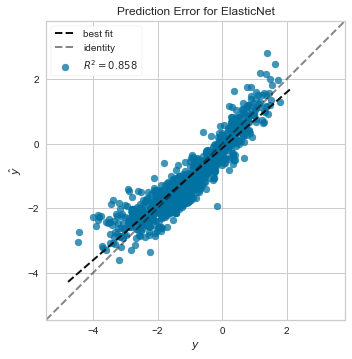

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    9.1s finished


alpha in fold 7: 0.0014515252044205753
selected features: 146/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.4s finished


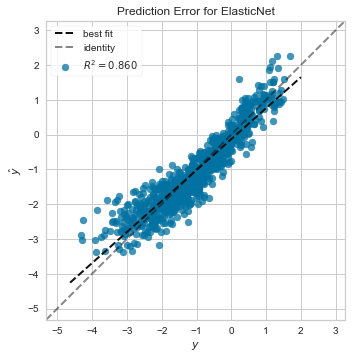

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.3s finished


alpha in fold 8: 0.0013960295529086173
selected features: 155/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    2.6s finished


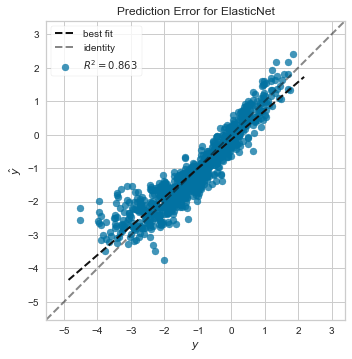

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.3s finished


alpha in fold 9: 0.001413433516691301
selected features: 150/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.4s finished


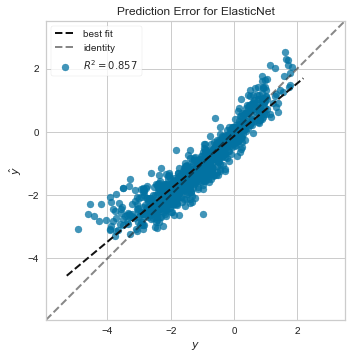

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.3s finished


alpha in fold 10: 0.0015344669418688288
selected features: 147/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    2.1s finished


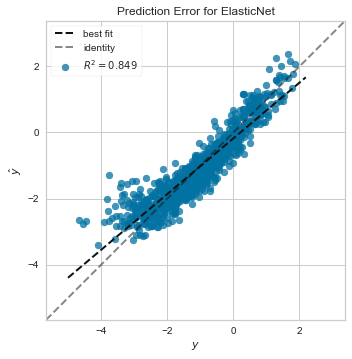

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    9.0s finished


alpha in fold 11: 0.0014077829479859152
selected features: 146/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.4s finished


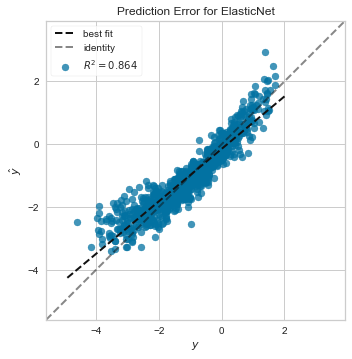

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    6.9s finished


alpha in fold 12: 0.00165895778036434
selected features: 153/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.2s finished


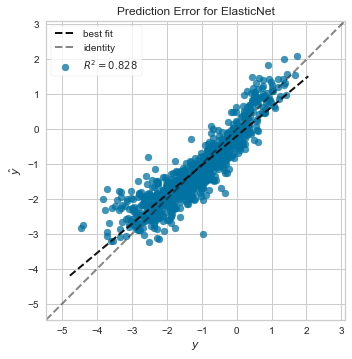

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.4s finished


alpha in fold 13: 0.001446449613638642
selected features: 147/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.3s finished


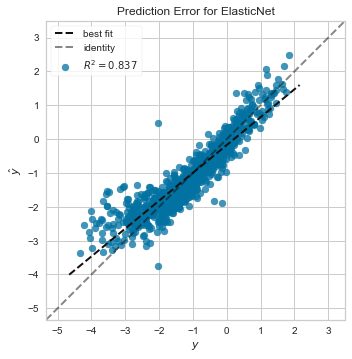

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.7s finished


alpha in fold 14: 0.0014382341757069362
selected features: 157/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.9s finished


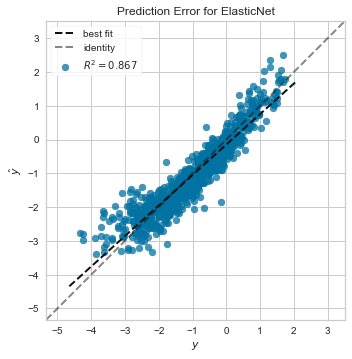

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.4s finished


alpha in fold 15: 0.0014437995302112633
selected features: 156/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.8s finished


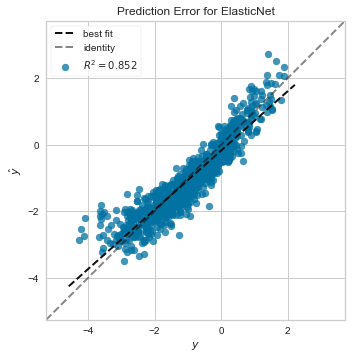

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    9.0s finished


alpha in fold 16: 0.001406514666550235
selected features: 151/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    2.0s finished


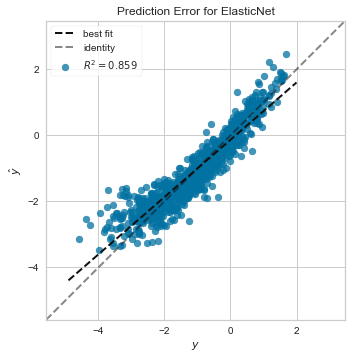

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    9.5s finished


alpha in fold 17: 0.0014148477686130004
selected features: 150/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.6s finished


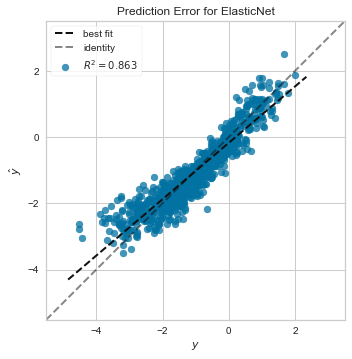

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.1s finished


alpha in fold 18: 0.001368371031956539
selected features: 147/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.4s finished


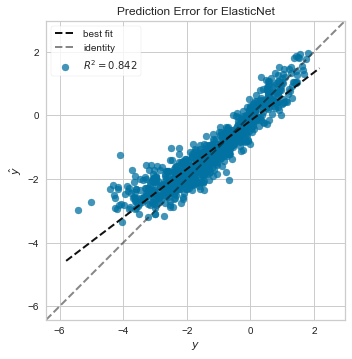

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.5s finished


alpha in fold 19: 0.0014159843553802674
selected features: 149/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.4s finished


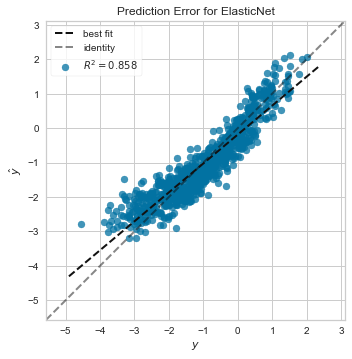

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.3s finished


alpha in fold 20: 0.0014481181415003522
selected features: 156/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.5s finished


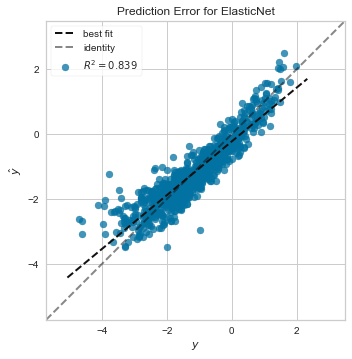

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    6.9s finished


alpha in fold 21: 0.001397429847206031
selected features: 153/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    2.2s finished


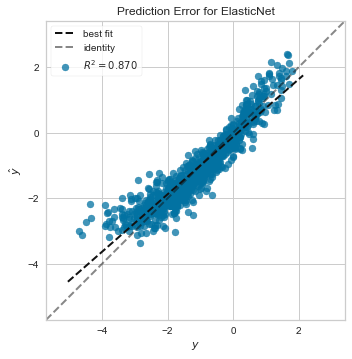

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    9.3s finished


alpha in fold 22: 0.0014463158240082886
selected features: 152/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.8s finished


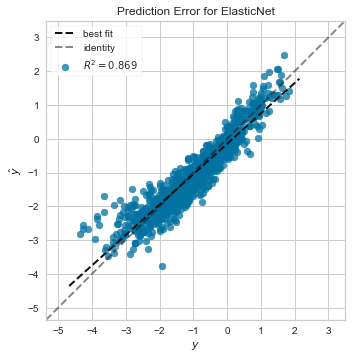

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.9s finished


alpha in fold 23: 0.0014194149965539515
selected features: 150/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.5s finished


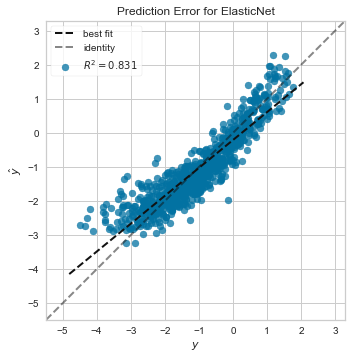

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.3s finished


alpha in fold 24: 0.0014549264501219795
selected features: 150/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    2.1s finished


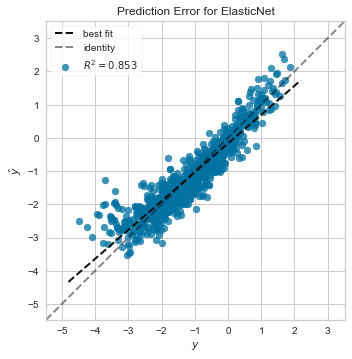

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    5.7s finished


alpha in fold 25: 0.001433866834435068
selected features: 151/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    2.1s finished


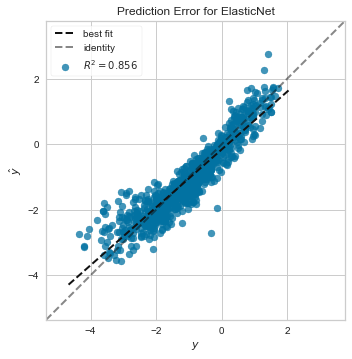

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.7s finished


alpha in fold 26: 0.0014042131379687882
selected features: 152/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.8s finished


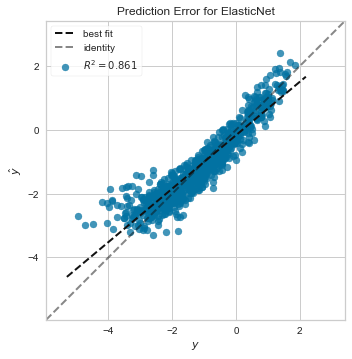

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    8.4s finished


alpha in fold 27: 0.0014136542692454763
selected features: 143/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.8s finished


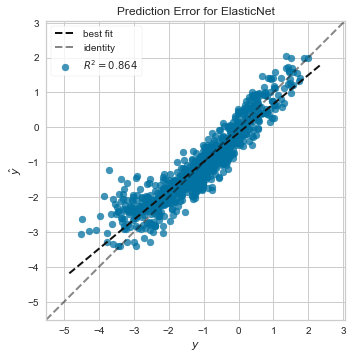

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    7.9s finished


alpha in fold 28: 0.0014550527752625391
selected features: 146/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.6s finished


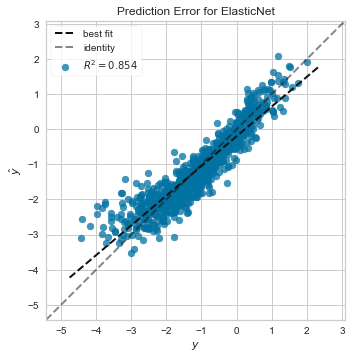

[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    9.3s finished


alpha in fold 29: 0.001422012903524953
selected features: 155/756 total number of features


[Parallel(n_jobs=64)]: Using backend ThreadingBackend with 64 concurrent workers.
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................[Parallel(n_jobs=64)]: Done   5 out of   5 | elapsed:    1.7s finished


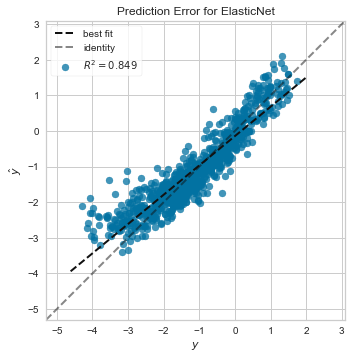

In [543]:
X = df_num.drop([#'ID',
                 'Label',
'WMH_volume',
'WMH_Bvadj',
'Brain_volume',
'Ventricle_volume',
'No_csf_brain_vol',
'AF',
'Age',
'DM',
'HTN',
'CAD',
'Sex',
'Smoking_ever',
                 ],axis = 1)

# Dropping surface and volume confounding variables
#X = X.drop(X.filter(regex='_Surface').columns, axis=1)
#X = X.drop(X.filter(regex='_Voxel').columns, axis=1)
#X = X.drop(X.filter(regex='_Volume').columns, axis=1)
#X = X.drop(X.filter(regex='_shape').columns, axis=1)


#Selecting filtered variables
X = X.drop(X.filter(regex='wavelet2').columns, axis=1)
X = X.drop(X.filter(regex='wavelet3').columns, axis=1)

#X = X.drop(X.filter(regex='lbp').columns, axis=1)
X = X.drop(X.filter(regex='gradient').columns, axis=1)
X = X.drop(X.filter(regex='exponential').columns, axis=1)
X = X.drop(X.filter(regex='logarithm').columns, axis=1)
X = X.drop(X.filter(regex='squareroot').columns, axis=1)
X = X.drop(X.filter(regex='square').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-1-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-3-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma').columns, axis=1)

X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='original').columns, axis=1)
#X = X.drop(X.filter(regex='diagnostics').columns, axis=1)
   

# Dropping heavily volume confounded variables
#X = X.drop(X.filter(regex='_RootMeanSquared').columns, axis=1)
#X = X.drop(X.filter(regex='_Energy').columns, axis=1)
#X = X.drop(X.filter(regex='_TotalEnergy').columns, axis=1)
#X = X.drop(X.filter(regex='_Coarseness').columns, axis=1)
#X = X.drop(X.filter(regex='Emphasis').columns, axis=1)
#X = X.drop(X.filter(regex='Uniformity').columns, axis=1)
#X = X.drop(X.filter(regex='Strength').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='ZoneVariance').columns, axis=1)
#X = X.drop(X.filter(regex='Busyness').columns, axis=1)


#X = X.drop(X.filter(regex='firstorder').columns, axis=1)
#X = X.drop(X.filter(regex='glcm').columns, axis=1)
#X = X.drop(X.filter(regex='gldm').columns, axis=1)
#X = X.drop(X.filter(regex='ngtdm').columns, axis=1)
#X = X.drop(X.filter(regex='glrlm').columns, axis=1)
#X = X.drop(X.filter(regex='glszm').columns, axis=1)

#X = X.drop(X.filter(regex='Volume').columns, axis=1)

#X = X.drop(X.filter(regex='Maximum').columns, axis=1)
##X = X.drop(X.filter(regex='Sphericity').columns, axis=1)
#X = X.drop(X.filter(regex='Length').columns, axis=1)
#X = X.drop(X.filter(regex='Elongation').columns, axis=1)
#X = X.drop(X.filter(regex='Flatness').columns, axis=1)




y = df_num.WMH_Bvadj

columns_names = X.columns.drop('ID')

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
#scaler = RobustScaler()
scaler=StandardScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64)
y_pred_total_radiomics=[]
y_total_radiomics =[]
r2_total_radiomics=[]
index_total_radiomics = []
all_selected_features =[]
coefs_radiomics=pd.DataFrame(index=df_num.columns)

repeated=30
for i in range(repeated):
    #split train test
    
    y_len = y.shape[-1]
    bins = np.linspace(0, y_len, 50)
    y_binned = np.digitize(y, bins)
    X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20, random_state=i,stratify=y_binned)

    y_len2 = y_training.shape[-1]
    bins2 = np.linspace(0, y_len, 50)
    y_binned2 = np.digitize(y_training, bins)
    X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=0,stratify=y_binned2)

    #set index 
    X_training=X_training.set_index('ID')
    X_test=X_test.set_index('ID')
    X_final=X_final.set_index('ID')
    index_training=X_training.index
    index_test = X_test.index
    index_final = X_final.index
    
    #impute data
    X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names,index=index_training)
    X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names,index= index_test)
    X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names,index=index_final)
    #box cox transform y
    y_training, _ = stats.boxcox(y_training)
    y_test, _ = stats.boxcox(y_test)
    y_final, _ = stats.boxcox(y_final)
    

    #scale units     
    X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names,index=index_training)
    X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names,index=index_test)
    X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names,index=index_final)

    
    #feature selection using ElasticNetCV
    lassoCV.fit(X_training,y_training)
    selector = SelectFromModel(lassoCV,prefit=True)
    print('alpha in fold {0}: {1}'.format(i,lassoCV.alpha_))
    selected_feat = X_training.columns[(selector.get_support())]
    all_selected_features.append(selected_feat)
    print('selected features: {0}/{1} total number of features'.format(len(selected_feat),(X_training.shape[1])))
    X_training_sel = X_training.filter(selected_feat)
    X_test_sel = X_test.filter(selected_feat)
    X_final_sel = X_final.filter(selected_feat)
    
          #tuning on test set
    LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64).fit(X_test_sel,y_test)
    alpha_tuned=LassoCV_tuning.alpha_
    l1_ratio_tuned=LassoCV_tuning.l1_ratio_
    
    lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
    lasso_reg.fit(X_training_sel, y_training)
          
          #scoring on final set
    visualizer = PredictionError(lasso_reg)
    visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
    visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
    visualizer.show() 
    
    #prepare plots
    y_pred_infold=lasso_reg.predict(X_final_sel)
    ID_pred_infold=index_final
    index_total_radiomics.extend(index_final)
    y_pred_total_radiomics.extend(y_pred_infold)
    y_total_radiomics.extend(y_final)
    r2_total_radiomics.append(visualizer.score_)  
    
    #prepare coefs
    counter=[i]
    coef_infold=pd.DataFrame(lasso_reg.coef_,index=X_training_sel.columns,columns=counter)
    coefs_radiomics=coefs_radiomics.join(coef_infold)

coefs_radiomics_nona=coefs_radiomics.dropna().T
r2_total_radiomics=np.array(r2_total_radiomics)
    

X = df_num.drop(['ID','Label',
'WMH_volume',
'WMH_Bvadj',
'Brain_volume',
'Ventricle_volume',
'No_csf_brain_vol',
'AF',
'Age',
'DM',
'HTN',
'CAD',
'Sex',
'Smoking_ever',
                 ],axis = 1)

# Dropping surface and volume confounding variables
#X = X.drop(X.filter(regex='_Surface').columns, axis=1)
#X = X.drop(X.filter(regex='_Voxel').columns, axis=1)
#X = X.drop(X.filter(regex='_Volume').columns, axis=1)
#X = X.drop(X.filter(regex='_shape').columns, axis=1)


#Selecting filtered variables
X = X.drop(X.filter(regex='wavelet2').columns, axis=1)
X = X.drop(X.filter(regex='wavelet3').columns, axis=1)

#X = X.drop(X.filter(regex='lbp').columns, axis=1)
X = X.drop(X.filter(regex='gradient').columns, axis=1)
X = X.drop(X.filter(regex='exponential').columns, axis=1)
X = X.drop(X.filter(regex='logarithm').columns, axis=1)
X = X.drop(X.filter(regex='squareroot').columns, axis=1)
X = X.drop(X.filter(regex='square').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-1-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-3-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma').columns, axis=1)

X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='original').columns, axis=1)
#X = X.drop(X.filter(regex='diagnostics').columns, axis=1)
   

# Dropping heavily volume confounded variables
#X = X.drop(X.filter(regex='_RootMeanSquared').columns, axis=1)
#X = X.drop(X.filter(regex='_Energy').columns, axis=1)
#X = X.drop(X.filter(regex='_TotalEnergy').columns, axis=1)
#X = X.drop(X.filter(regex='_Coarseness').columns, axis=1)
#X = X.drop(X.filter(regex='Emphasis').columns, axis=1)
#X = X.drop(X.filter(regex='Uniformity').columns, axis=1)
#X = X.drop(X.filter(regex='Strength').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='ZoneVariance').columns, axis=1)
#X = X.drop(X.filter(regex='Busyness').columns, axis=1)


#X = X.drop(X.filter(regex='firstorder').columns, axis=1)
#X = X.drop(X.filter(regex='glcm').columns, axis=1)
#X = X.drop(X.filter(regex='gldm').columns, axis=1)
#X = X.drop(X.filter(regex='ngtdm').columns, axis=1)
#X = X.drop(X.filter(regex='glrlm').columns, axis=1)
#X = X.drop(X.filter(regex='glszm').columns, axis=1)

#X = X.drop(X.filter(regex='Volume').columns, axis=1)

#X = X.drop(X.filter(regex='Maximum').columns, axis=1)
##X = X.drop(X.filter(regex='Sphericity').columns, axis=1)
#X = X.drop(X.filter(regex='Length').columns, axis=1)
#X = X.drop(X.filter(regex='Elongation').columns, axis=1)
#X = X.drop(X.filter(regex='Flatness').columns, axis=1)





y = df_num.WMH_Bvadj

columns_names = X.columns

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
scaler=StandardScaler()
#scaler = RobustScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64)
y_pred_total_radiomics=[]
y_total_radiomics =[]
r2_total_radiomics=[]
all_selected_features_radiomics =[]
coefs_radiomics=pd.DataFrame(index=df_num.columns)

for i in range(repeated):
    #split train test
    
    y_len = y.shape[-1]
    bins = np.linspace(0, y_len, 50)
    y_binned = np.digitize(y, bins)
    X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20, random_state=i,stratify=y_binned)

    y_len2 = y_training.shape[-1]
    bins2 = np.linspace(0, y_len, 50)
    y_binned2 = np.digitize(y_training, bins)
    X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=0,stratify=y_binned2)

    #impute data
    X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names)
    X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names)
    X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names)
    #box cox transform y
    y_training, _ = stats.boxcox(y_training)
    y_test, _ = stats.boxcox(y_test)
    y_final, _ = stats.boxcox(y_final)
    #scale units
    X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names)
    X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names)
    X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names)

    #feature selection using lassoCV
    lassoCV.fit(X_training,y_training)
    selector = SelectFromModel(lassoCV,prefit=True)
    print('alpha in fold {0}: {1}'.format(i,lassoCV.alpha_))
    selected_feat = X_training.columns[(selector.get_support())]
    all_selected_features_radiomics.append(selected_feat)
    print('selected features: {0}/{1} total number of features'.format(len(selected_feat),(X_training.shape[1])))
    X_training_sel = X_training.filter(selected_feat)
    X_test_sel = X_test.filter(selected_feat)
    X_final_sel = X_final.filter(selected_feat)
    
          #tuning on test set
    LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64).fit(X_test_sel,y_test)
    alpha_tuned=LassoCV_tuning.alpha_
    l1_ratio_tuned=LassoCV_tuning.l1_ratio_

    lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
    lasso_reg.fit(X_training_sel, y_training)
          
          #scoring on final set
    visualizer = PredictionError(lasso_reg)
    visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
    visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
    visualizer.show() 
    
    #prepare plots
    y_pred_infold=lasso_reg.predict(X_final_sel)
    y_pred_total_radiomics.extend(y_pred_infold)
    y_total_radiomics.extend(y_final)
    r2_total_radiomics.append(visualizer.score_) 
    
    #prepare coefs
    counter=[i]
    coef_infold=pd.DataFrame(lasso_reg.coef_,index=X_training_sel.columns,columns=counter)
    coefs_radiomics=coefs_radiomics.join(coef_infold)

r2_total_radiomics=np.array(r2_total_radiomics)
coefs_radiomics_nona=coefs_radiomics.dropna().T
    

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


R2 mean : 0.85 +/- 0.01
Confidence interval: 0.851 - 0.859


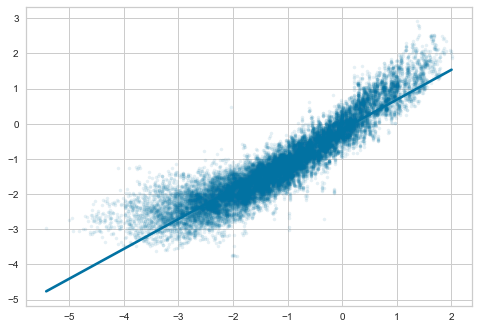

In [544]:
sns.regplot(y_total_radiomics,y_pred_total_radiomics,scatter_kws={'alpha':0.1},marker=".")
print('R2 mean : {0} +/- {1}'.format(round(r2_total_radiomics.mean(),2),round(r2_total_radiomics.std(),2)))
CI_long=sms.DescrStatsW(r2_total_radiomics).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


number of CV repetitions: 30
R2 mean : 0.855 +/- 0.011
Confidence interval: 0.851 - 0.859


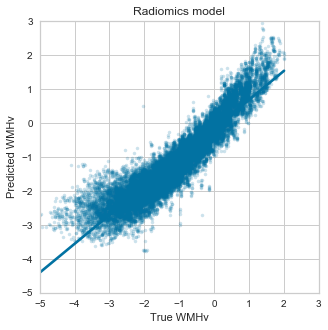

In [562]:

regplot = sns.regplot(y_total_radiomics,y_pred_total_radiomics,
            scatter_kws={'alpha':0.2},marker=".")
regplot.figure.set_size_inches(5, 5)
regplot.set(xlabel='True WMHv', ylabel='Predicted WMHv')
regplot.set(title="Radiomics model")
regplot.set(ylim=(-5, 3))
regplot.set(xlim=(-5, 3))

figure = regplot.get_figure()
figure.savefig('./CV_pred_WMHv_radiomicsOnly_400dpi.png', dpi=400)


#sns.despine()

print('number of CV repetitions: {}'.format(i+1))
print('R2 mean : {0} +/- {1}'.format(round(r2_total_radiomics.mean(),3),round(r2_total_radiomics.std(),3)))
CI_long=sms.DescrStatsW(r2_total_radiomics).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [563]:
r2_total_radiomics.std()

0.01073299339563814

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]
/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/matplotlib/cbook/__i

R2 mean : 0.855 +/- 0.011
Confidence interval: 0.851 - 0.859


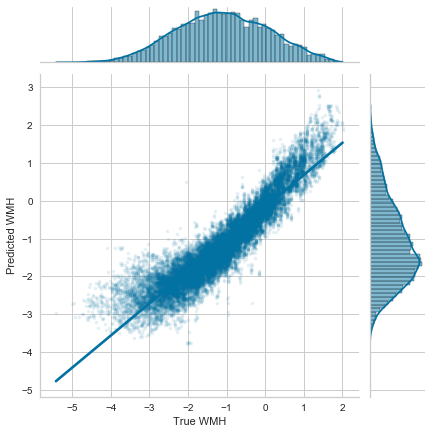

In [564]:
def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2
ax=sns.jointplot(y_total_radiomics,y_pred_total_radiomics, kind="reg", scatter_kws={'alpha':0.1},marker="."
             )

ax.set_axis_labels("True WMH", "Predicted WMH")
print('R2 mean : {0} +/- {1}'.format(round(r2_total_radiomics.mean(),3),round(r2_total_radiomics.std(),3)))
CI_long=sms.DescrStatsW(r2_total_radiomics).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


residual >1 : 1052
residual <-1 : 160


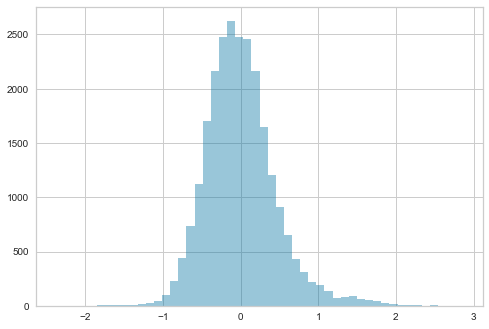

In [565]:
y_total_radiomics_copy = y_total_radiomics
y_pred_total_radiomics_copy = y_pred_total_radiomics


y_total_radiomics_np = np.array(y_total_radiomics_copy)
y_pred_total_radiomics_np = np.array(y_pred_total_radiomics_copy)
y_residual_radiomics = y_pred_total_radiomics_np - y_total_radiomics_np
sns.distplot(y_residual_radiomics, kde=False, rug=False)



upper_tail_resid_radiomics = np.extract(y_residual_radiomics>1,y_residual_radiomics)
print("residual >1 : {}".format(round(upper_tail_resid_radiomics.sum()),0))
lower_tail_resid_radiomics = np.extract(y_residual_radiomics<-1,y_residual_radiomics)
print("residual <-1 : {}".format(round(abs(lower_tail_resid_radiomics.sum())),0))


In [566]:
y_pred_columns = ['y_pred_radiomics']
df_y_pred_radiomics=pd.DataFrame(y_pred_total_radiomics,columns=y_pred_columns,index=index_total_radiomics)
df_y_pred_radiomics.index=df_y_pred_radiomics.index.set_names('ID')

y_total_columns = ['y_true_radiomics']
df_y_true_radiomics=pd.DataFrame(y_total_radiomics,columns=y_total_columns,index=index_total_radiomics)
df_y_true_radiomics.index=df_y_true_radiomics.index.set_names('ID')

y_ground_truth_radiomics_np = np.array(y_total_radiomics)
y_pred_total_radiomics_np = np.array(y_pred_total_radiomics)
y_residual_radiomics = y_pred_total_radiomics_np - y_ground_truth_radiomics_np
residual_radiomics_columns = ['residual_radiomics']
df_y_residual_radiomics=pd.DataFrame(y_residual_radiomics,columns=residual_radiomics_columns,index=index_total_radiomics)
df_y_residual_radiomics.index=df_y_residual_radiomics.index.set_names('ID')

predictions_radiomics_df=df_y_pred_radiomics.join(df_y_true_radiomics).join(df_y_residual_radiomics)

In [567]:
NIHSS_df = full_phenotype_df.NIHSS
NIHSS_df.index=NIHSS_df.index.set_names('ID')
predictions_radiomics_df=predictions_radiomics_df.join(NIHSS_df)
predictions_radiomics_NIHSS=predictions_radiomics_df.dropna()
predictions_radiomics_NIHSS.NIHSS=predictions_radiomics_NIHSS.NIHSS.astype(int)

/PHShome/mi362/anaconda3/envs/jupiler1/lib/python3.7/site-packages/pandas/core/generic.py:5489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


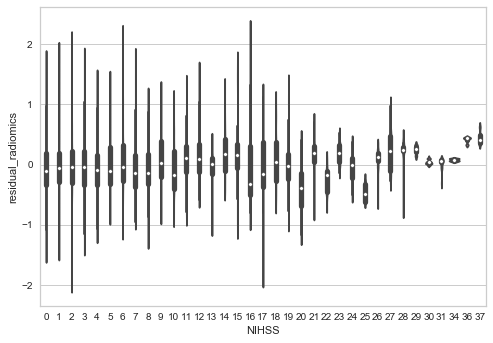

In [568]:
predictions_radiomics_NIHSS.sort_values(by='NIHSS')
ax = sns.violinplot(x="NIHSS", y="residual_radiomics", data=predictions_radiomics_NIHSS,aspect=5)
figure = ax.get_figure()
figure.savefig('./residual_WMHvPred_radiomicsOnly_400dpi.png', dpi=400)

In [572]:
stats.pearsonr(predictions_radiomics_NIHSS.NIHSS,predictions_radiomics_NIHSS.residual_radiomics)

(0.03481932286090423, 1.6943356218160087e-176)

In [552]:
len(y_pred_total_radiomics)

24990

In [553]:
coefs_radiomics_describe = coefs_radiomics_nona.describe().T.sort_values(by='mean')
coefs_radiomics_describe

,count,mean,std,min,25%,50%,75%,max
original_glrlm_RunLengthNonUniformityNormalized,30.0,-0.617160,0.066854,-0.717744,-0.664299,-0.630548,-0.587074,-0.430563
original_glrlm_RunVariance,30.0,-0.431851,0.042778,-0.494763,-0.459524,-0.430025,-0.414969,-0.325732
log-sigma-2-0-mm-3D_firstorder_10Percentile,30.0,-0.306836,0.121225,-0.446913,-0.386802,-0.335781,-0.288300,-0.000000
original_shape_Sphericity,30.0,-0.237401,0.063780,-0.342982,-0.285516,-0.237630,-0.193343,-0.072699
log-sigma-3-0-mm-3D_gldm_LargeDependenceEmphasis,30.0,-0.237264,0.120025,-0.402987,-0.311796,-0.274748,-0.228072,-0.000000
original_shape_MajorAxisLength,30.0,-0.212738,0.045842,-0.262102,-0.240117,-0.224902,-0.205076,-0.072853
lbp-2D_glrlm_GrayLevelVariance,30.0,-0.212044,0.081029,-0.313586,-0.273915,-0.228945,-0.180727,-0.024742
log-sigma-1-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis,30.0,-0.209193,0.034109,-0.258127,-0.227944,-0.216120,-0.203203,-0.082263
log-sigma-1-0-mm-3D_firstorder_90Percentile,30.0,-0.203049,0.081248,-0.321739,-0.247860,-0.222797,-0.194728,-0.000000
original_shape_MinorAxisLength,30.0,-0.200848,0.055362,-0.258273,-0.228952,-0.219664,-0.204865,-0.022356


In [554]:
coefs_radiomics_describe.shape

(73, 8)

In [555]:
coefs_radiomics_describe.T

,original_glrlm_RunLengthNonUniformityNormalized,original_glrlm_RunVariance,log-sigma-2-0-mm-3D_firstorder_10Percentile,original_shape_Sphericity,log-sigma-3-0-mm-3D_gldm_LargeDependenceEmphasis,original_shape_MajorAxisLength,lbp-2D_glrlm_GrayLevelVariance,log-sigma-1-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis,log-sigma-1-0-mm-3D_firstorder_90Percentile,original_shape_MinorAxisLength,...,log-sigma-1-0-mm-3D_firstorder_10Percentile,log-sigma-3-0-mm-3D_glrlm_ShortRunLowGrayLevelEmphasis,log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis,log-sigma-2-0-mm-3D_glcm_ClusterShade,log-sigma-3-0-mm-3D_firstorder_10Percentile,log-sigma-3-0-mm-3D_glrlm_RunEntropy,original_shape_SurfaceVolumeRatio,original_shape_SurfaceArea,original_glrlm_RunEntropy,log-sigma-2-0-mm-3D_glrlm_ShortRunLowGrayLevelEmphasis
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,...,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000
mean,-0.617160,-0.431851,-0.306836,-0.237401,-0.237264,-0.212738,-0.212044,-0.209193,-0.203049,-0.200848,...,0.188465,0.198358,0.205940,0.229942,0.266749,0.381667,0.437761,0.493315,0.701343,0.961566
std,0.066854,0.042778,0.121225,0.063780,0.120025,0.045842,0.081029,0.034109,0.081248,0.055362,...,0.060135,0.047156,0.061344,0.047837,0.088736,0.181020,0.210729,0.130153,0.188485,0.044678
min,-0.717744,-0.494763,-0.446913,-0.342982,-0.402987,-0.262102,-0.313586,-0.258127,-0.321739,-0.258273,...,0.015064,0.100696,0.000000,0.140450,0.000000,0.000000,0.000000,0.081543,0.076214,0.809398
25%,-0.664299,-0.459524,-0.386802,-0.285516,-0.311796,-0.240117,-0.273915,-0.227944,-0.247860,-0.228952,...,0.144048,0.171430,0.200586,0.193864,0.238960,0.339626,0.420196,0.473839,0.705772,0.944989
50%,-0.630548,-0.430025,-0.335781,-0.237630,-0.274748,-0.224902,-0.228945,-0.216120,-0.222797,-0.219664,...,0.194286,0.204137,0.217926,0.228506,0.300461,0.416437,0.509213,0.529156,0.762474,0.968470
75%,-0.587074,-0.414969,-0.288300,-0.193343,-0.228072,-0.205076,-0.180727,-0.203203,-0.194728,-0.204865,...,0.230851,0.223443,0.236966,0.264251,0.321013,0.495593,0.583269,0.581509,0.799406,0.989840
max,-0.430563,-0.325732,-0.000000,-0.072699,-0.000000,-0.072853,-0.024742,-0.082263,-0.000000,-0.022356,...,0.288025,0.287948,0.273155,0.327944,0.351106,0.631094,0.677537,0.645813,0.938892,1.020420


In [556]:
coefs_both_sorted.T.columns

Index(['wavelet-HL_firstorder_Skewness', 'Smoking_ever',
       'wavelet-HH_glrlm_GrayLevelNonUniformityNormalized',
       'wavelet-HH_glrlm_GrayLevelVariance',
       'wavelet-HL_glrlm_LowGrayLevelRunEmphasis',
       'wavelet-HL_glrlm_HighGrayLevelRunEmphasis',
       'original_glszm_ZoneEntropy', 'diagnostics_Mask-original_VoxelNum',
       'log-sigma-2-0-mm-3D_glrlm_LowGrayLevelRunEmphasis',
       'log-sigma-2-0-mm-3D_glrlm_HighGrayLevelRunEmphasis',
       'original_shape_Maximum2DDiameterColumn',
       'original_glszm_GrayLevelVariance', 'Age',
       'log-sigma-1-0-mm-3D_firstorder_Skewness',
       'wavelet-HL_glcm_JointEntropy',
       'log-sigma-1-0-mm-3D_glszm_SmallAreaLowGrayLevelEmphasis',
       'log-sigma-1-0-mm-3D_glszm_SmallAreaHighGrayLevelEmphasis',
       'log-sigma-3-0-mm-3D_firstorder_Skewness',
       'wavelet-HH_glrlm_RunEntropy',
       'original_glszm_GrayLevelNonUniformityNormalized',
       'log-sigma-3-0-mm-3D_firstorder_90Percentile',
       'log-sigma-

In [557]:
coefs_radiomics_sorted = coefs_radiomics_nona.describe().T.sort_values(by='std')
coefs_radiomics_sorted_index = coefs_radiomics_sorted.index
coefs_radiomics_sorted_columns = coefs_radiomics_sorted.columns
coefs_radiomics_sorted_abs = abs(coefs_radiomics_sorted.values)

In [558]:
coef_var_index=['coef_variation']
coefs_radiomics_sorted_coef_var = pd.DataFrame(abs(coefs_radiomics_describe[["std"]].values/coefs_radiomics_describe[["mean"]].values),index=coefs_radiomics_sorted.T.columns.to_list(),columns=coef_var_index).join(coefs_radiomics_sorted)
coefs_radiomics_sorted_coef_var = coefs_radiomics_sorted_coef_var.sort_values(by='coef_variation',ascending=True)
coefs_radiomics_sorted_coef_var.to_csv('coef_variation_only_radiomicsign.csv')
coefs_radiomics_sorted_coef_var


,coef_variation,count,mean,std,min,25%,50%,75%,max
original_shape_SurfaceVolumeRatio,0.046464,30.0,0.437761,0.210729,0.000000,0.420196,0.509213,0.583269,0.677537
log-sigma-1-0-mm-3D_firstorder_Median,0.096722,30.0,-0.172554,0.075869,-0.285460,-0.220349,-0.189288,-0.140202,-0.000000
wavelet-HH_glrlm_GrayLevelNonUniformityNormalized,0.099058,30.0,-0.059141,0.009178,-0.080496,-0.063346,-0.057748,-0.053981,-0.042036
wavelet-HL_firstorder_Skewness,0.108325,30.0,-0.064971,0.008948,-0.081144,-0.068982,-0.066045,-0.058247,-0.049286
log-sigma-3-0-mm-3D_glrlm_LowGrayLevelRunEmphasis,0.137727,30.0,0.150606,0.036449,0.057958,0.146105,0.157518,0.173545,0.198791
original_glrlm_RunLengthNonUniformityNormalized,0.146159,30.0,-0.617160,0.066854,-0.717744,-0.664299,-0.630548,-0.587074,-0.430563
log-sigma-1-0-mm-3D_glrlm_HighGrayLevelRunEmphasis,0.155186,30.0,0.185529,0.037401,0.103802,0.158126,0.183745,0.211241,0.251842
log-sigma-3-0-mm-3D_firstorder_InterquartileRange,0.155572,30.0,0.071720,0.041156,0.000000,0.044204,0.073234,0.103794,0.138334
log-sigma-2-0-mm-3D_glrlm_RunVariance,0.161810,30.0,-0.068271,0.029015,-0.120733,-0.087995,-0.071124,-0.056050,-0.000000
log-sigma-2-0-mm-3D_glrlm_HighGrayLevelRunEmphasis,0.163052,30.0,-0.069225,0.016517,-0.094884,-0.079660,-0.074398,-0.058116,-0.030181


In [559]:
coefs_radiomics.describe().T.sort_values(by='mean')

,count,mean,std,min,25%,50%,75%,max
18,147.0,0.001709,0.186789,-0.624217,-0.079648,-0.019842,0.076651,0.920582
14,157.0,0.003201,0.179429,-0.677969,-0.081432,-0.026195,0.074774,0.995661
13,147.0,0.004246,0.184780,-0.663836,-0.070640,0.001544,0.068181,1.009204
16,151.0,0.004541,0.191222,-0.631703,-0.081980,0.003782,0.084680,0.942118
23,150.0,0.004731,0.096288,-0.430563,0.000000,0.000000,0.001177,0.809398
29,155.0,0.004981,0.142252,-0.618008,-0.048920,0.000000,0.051458,1.009639
7,146.0,0.005458,0.185679,-0.644020,-0.075053,-0.029007,0.071011,0.968317
22,152.0,0.005780,0.177674,-0.660755,-0.079988,0.015373,0.071576,0.945116
3,160.0,0.005894,0.171219,-0.604233,-0.074652,-0.006080,0.069983,0.962460
27,143.0,0.006056,0.185132,-0.650956,-0.079098,-0.016616,0.076636,1.004696


In [560]:
coefs_radiomics_nona.describe().T.sort_values(by='mean')

,count,mean,std,min,25%,50%,75%,max
original_glrlm_RunLengthNonUniformityNormalized,30.0,-0.617160,0.066854,-0.717744,-0.664299,-0.630548,-0.587074,-0.430563
original_glrlm_RunVariance,30.0,-0.431851,0.042778,-0.494763,-0.459524,-0.430025,-0.414969,-0.325732
log-sigma-2-0-mm-3D_firstorder_10Percentile,30.0,-0.306836,0.121225,-0.446913,-0.386802,-0.335781,-0.288300,-0.000000
original_shape_Sphericity,30.0,-0.237401,0.063780,-0.342982,-0.285516,-0.237630,-0.193343,-0.072699
log-sigma-3-0-mm-3D_gldm_LargeDependenceEmphasis,30.0,-0.237264,0.120025,-0.402987,-0.311796,-0.274748,-0.228072,-0.000000
original_shape_MajorAxisLength,30.0,-0.212738,0.045842,-0.262102,-0.240117,-0.224902,-0.205076,-0.072853
lbp-2D_glrlm_GrayLevelVariance,30.0,-0.212044,0.081029,-0.313586,-0.273915,-0.228945,-0.180727,-0.024742
log-sigma-1-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis,30.0,-0.209193,0.034109,-0.258127,-0.227944,-0.216120,-0.203203,-0.082263
log-sigma-1-0-mm-3D_firstorder_90Percentile,30.0,-0.203049,0.081248,-0.321739,-0.247860,-0.222797,-0.194728,-0.000000
original_shape_MinorAxisLength,30.0,-0.200848,0.055362,-0.258273,-0.228952,-0.219664,-0.204865,-0.022356


In [561]:
clinical =[
    'WMH_volume',
 'WMH_Bvadj',
 'Brain_volume',
 'Ventricle_volume',
 'No_csf_brain_vol',
 'AF',
 'Age',
 'DM',
 'HTN',
 'CAD',
 'Sex',
 'Smoking_ever',
]

clinical_df = df_num.filter(clinical)

radiomic_signature_list = coefs_radiomics_nona.columns.to_list()
df_scaled = df_num.filter(radiomic_signature_list)
ID_df = df_num.ID
df_scaled = pd.DataFrame(scaler.fit_transform(df_scaled),columns=df_scaled.columns)
df_scaled = pd.concat([ID_df,clinical_df,df_scaled],axis=1)
df_scaled.to_csv('radiomic_signature_noNorm_scaled.csv')



In [ ]:
#Plot inclusion progressive des radiomics de la signature radiomics only

In [ ]:
X = df_num.drop(['ID','Label',
'WMH_volume',
'WMH_Bvadj',
'Brain_volume',
'Ventricle_volume',
'No_csf_brain_vol',
'AF',
'Age',
'DM',
'HTN',
'CAD',
'Sex',
'Smoking_ever',
                 ],axis = 1)

# Dropping surface and volume confounding variables
#X = X.drop(X.filter(regex='_Surface').columns, axis=1)
#X = X.drop(X.filter(regex='_Voxel').columns, axis=1)
#X = X.drop(X.filter(regex='_Volume').columns, axis=1)
#X = X.drop(X.filter(regex='_shape').columns, axis=1)


#Selecting filtered variables
X = X.drop(X.filter(regex='wavelet2').columns, axis=1)
X = X.drop(X.filter(regex='wavelet3').columns, axis=1)

#X = X.drop(X.filter(regex='lbp').columns, axis=1)
X = X.drop(X.filter(regex='gradient').columns, axis=1)
X = X.drop(X.filter(regex='exponential').columns, axis=1)
X = X.drop(X.filter(regex='logarithm').columns, axis=1)
X = X.drop(X.filter(regex='squareroot').columns, axis=1)
X = X.drop(X.filter(regex='square').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-1-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-3-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma').columns, axis=1)

X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='original').columns, axis=1)
#X = X.drop(X.filter(regex='diagnostics').columns, axis=1)
   

# Dropping heavily volume confounded variables
#X = X.drop(X.filter(regex='_RootMeanSquared').columns, axis=1)
#X = X.drop(X.filter(regex='_Energy').columns, axis=1)
#X = X.drop(X.filter(regex='_TotalEnergy').columns, axis=1)
#X = X.drop(X.filter(regex='_Coarseness').columns, axis=1)
#X = X.drop(X.filter(regex='Emphasis').columns, axis=1)
#X = X.drop(X.filter(regex='Uniformity').columns, axis=1)
#X = X.drop(X.filter(regex='Strength').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='ZoneVariance').columns, axis=1)
#X = X.drop(X.filter(regex='Busyness').columns, axis=1)


#X = X.drop(X.filter(regex='firstorder').columns, axis=1)
#X = X.drop(X.filter(regex='glcm').columns, axis=1)
#X = X.drop(X.filter(regex='gldm').columns, axis=1)
#X = X.drop(X.filter(regex='ngtdm').columns, axis=1)
#X = X.drop(X.filter(regex='glrlm').columns, axis=1)
#X = X.drop(X.filter(regex='glszm').columns, axis=1)

#X = X.drop(X.filter(regex='Volume').columns, axis=1)

#X = X.drop(X.filter(regex='Maximum').columns, axis=1)
##X = X.drop(X.filter(regex='Sphericity').columns, axis=1)
#X = X.drop(X.filter(regex='Length').columns, axis=1)
#X = X.drop(X.filter(regex='Elongation').columns, axis=1)
#X = X.drop(X.filter(regex='Flatness').columns, axis=1)






y = df_num.WMH_Bvadj

columns_names = X.columns

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
#scaler = RobustScaler()
scaler=StandardScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64)
y_pred_total_both=[]
y_total_both =[]
r2_total_both=[]
all_selected_features =[]
coefs_both=pd.DataFrame(index=df_num.columns)

y_len = y.shape[-1]
bins = np.linspace(0, y_len, 50)
y_binned = np.digitize(y, bins)
X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20, random_state=0,stratify=y_binned)

y_len2 = y_training.shape[-1]
bins2 = np.linspace(0, y_len, 50)
y_binned2 = np.digitize(y_training, bins)
X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=0,stratify=y_binned2)

#impute data
X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names)
X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names)
X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names)
#box cox transform y
y_training, _ = stats.boxcox(y_training)
y_test, _ = stats.boxcox(y_test)
y_final, _ = stats.boxcox(y_final)
#scale units
X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names)
X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names)
X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names)

list_s =[]
list_score =[]

for s in range(1,coefs_radiomics_sorted_coef_var.shape[0]):
    selected_both=coefs_radiomics_sorted_coef_var.sort_values(by='coef_variation')[:s].T.columns.to_list()
    X_test_sel = X_test.filter(selected_both)
    X_final_sel = X_final.filter(selected_both)
    X_training_sel = X_training.filter(selected_both)
    LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64).fit(X_test_sel,y_test)
    alpha_tuned=LassoCV_tuning.alpha_
    l1_ratio_tuned=LassoCV_tuning.l1_ratio_

    lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
    lasso_reg.fit(X_training_sel, y_training)

      #scoring on final set
    print('predictions with {} features'.format(s))
    visualizer = PredictionError(lasso_reg)
    visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
    visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
    visualizer.show() 
    list_s.append(s)
    list_score.append(visualizer.score_)

In [ ]:
print("features included by order of coefficient of variation (Radiomics Only)")
ax = plt.gca()
ax.plot(list_s, list_score)
ax.set_xscale('linear')
ax.set_xlim(ax.get_xlim()[::])  # reverse axis
plt.xlabel('number of radiomics features')
plt.ylabel('R2')
plt.title('R2 score as a function of the number of included radiomics features')
plt.axis('tight')
plt.savefig("R2_per_included_radiomics_only_400dpi.png",dpi=400)

plt.show()

#only shape and size

In [ ]:
X = df_num.drop(['ID',
                 'Label',
'WMH_volume',
'WMH_Bvadj',
'Brain_volume',
'Ventricle_volume',
'No_csf_brain_vol',
'AF',
'Age',
'DM',
'HTN',
'CAD',
'Sex',
'Smoking_ever',
                 'Prior_stroke'
                 ],axis = 1)

# Dropping surface and volume confounding variables
#X = X.drop(X.filter(regex='_Surface').columns, axis=1)
#X = X.drop(X.filter(regex='_Voxel').columns, axis=1)
#X = X.drop(X.filter(regex='_Volume').columns, axis=1)
#X = X.drop(X.filter(regex='_shape').columns, axis=1)


#Selecting filtered variables
X = X.drop(X.filter(regex='wavelet').columns, axis=1)
#X = X.drop(X.filter(regex='wavelet3').columns, axis=1)

X = X.drop(X.filter(regex='lbp').columns, axis=1)
X = X.drop(X.filter(regex='gradient').columns, axis=1)
X = X.drop(X.filter(regex='exponential').columns, axis=1)
X = X.drop(X.filter(regex='logarithm').columns, axis=1)
X = X.drop(X.filter(regex='squareroot').columns, axis=1)
X = X.drop(X.filter(regex='square').columns, axis=1)
X = X.drop(X.filter(regex='log-sigma').columns, axis=1)


X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='original').columns, axis=1)
#X = X.drop(X.filter(regex='diagnostics').columns, axis=1)
X = X.drop(X.filter(regex='ted_M').columns, axis=1)   
X = X.drop(X.filter(regex='al_M').columns, axis=1)   

# Dropping heavily volume confounded variables
#X = X.drop(X.filter(regex='_RootMeanSquared').columns, axis=1)
#X = X.drop(X.filter(regex='_Energy').columns, axis=1)
#X = X.drop(X.filter(regex='_TotalEnergy').columns, axis=1)
#X = X.drop(X.filter(regex='_Coarseness').columns, axis=1)
#X = X.drop(X.filter(regex='Emphasis').columns, axis=1)
#X = X.drop(X.filter(regex='Uniformity').columns, axis=1)
#X = X.drop(X.filter(regex='Strength').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='ZoneVariance').columns, axis=1)
#X = X.drop(X.filter(regex='Busyness').columns, axis=1)


X = X.drop(X.filter(regex='firstorder').columns, axis=1)
X = X.drop(X.filter(regex='glcm').columns, axis=1)
X = X.drop(X.filter(regex='gldm').columns, axis=1)
X = X.drop(X.filter(regex='ngtdm').columns, axis=1)
X = X.drop(X.filter(regex='glrlm').columns, axis=1)
X = X.drop(X.filter(regex='glszm').columns, axis=1)

#X = X.drop(X.filter(regex='Volume').columns, axis=1)

#X = X.drop(X.filter(regex='Maximum').columns, axis=1)
##X = X.drop(X.filter(regex='Sphericity').columns, axis=1)
#X = X.drop(X.filter(regex='Length').columns, axis=1)
#X = X.drop(X.filter(regex='Elongation').columns, axis=1)
#X = X.drop(X.filter(regex='Flatness').columns, axis=1)


y = df_num.WMH_Bvadj

columns_names = X.columns

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
scaler=StandardScaler()
#scaler = RobustScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64)
y_pred_total_shape=[]
y_total_shape =[]
r2_total_shape=[]
all_selected_features_shape =[]
coefs_shape=pd.DataFrame(index=df_num.columns)

for i in range(repeated):
    #split train test
    
    y_len = y.shape[-1]
    bins = np.linspace(0, y_len, 50)
    y_binned = np.digitize(y, bins)
    X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20, random_state=i,stratify=y_binned)

    y_len2 = y_training.shape[-1]
    bins2 = np.linspace(0, y_len, 50)
    y_binned2 = np.digitize(y_training, bins)
    X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=0,stratify=y_binned2)

    #impute data
    X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names)
    X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names)
    X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names)
    #box cox transform y
    y_training, _ = stats.boxcox(y_training)
    y_test, _ = stats.boxcox(y_test)
    y_final, _ = stats.boxcox(y_final)
    #scale units
    X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names)
    X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names)
    X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names)

    #feature selection using lassoCV
    lassoCV.fit(X_training,y_training)
    selector = SelectFromModel(lassoCV,prefit=True)
    print('alpha in fold {0}: {1}'.format(i,lassoCV.alpha_))
    selected_feat = X_training.columns[(selector.get_support())]
    all_selected_features_radiomics.append(selected_feat)
    print('selected features: {0}/{1} total number of features'.format(len(selected_feat),(X_training.shape[1])))
    X_training_sel = X_training.filter(selected_feat)
    X_test_sel = X_test.filter(selected_feat)
    X_final_sel = X_final.filter(selected_feat)
    
          #tuning on test set
    LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=64).fit(X_test_sel,y_test)
    alpha_tuned=LassoCV_tuning.alpha_
    l1_ratio_tuned=LassoCV_tuning.l1_ratio_
    lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
    lasso_reg.fit(X_training_sel, y_training)
          
          #scoring on final set
    visualizer = PredictionError(lasso_reg)
    visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
    visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
    visualizer.show() 
    
    #prepare plots
    y_pred_infold=lasso_reg.predict(X_final_sel)
    y_pred_total_shape.extend(y_pred_infold)
    y_total_shape.extend(y_final)
    r2_total_shape.append(visualizer.score_)      
    
    #prepare coefs
    counter=[i]
    coef_infold=pd.DataFrame(lasso_reg.coef_,index=X_training_sel.columns,columns=counter)
    coefs_shape=coefs_shape.join(coef_infold)

r2_total_shape=np.array(r2_total_shape)
coefs_shape_nona=coefs_shape.dropna().T


In [ ]:
def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2
ax=sns.jointplot(y_total_shape,y_pred_total_shape, kind="reg", scatter_kws={'alpha':0.2},marker="."
             )
ax.set_axis_labels("True WMH", "Predicted WMH")

print('R2 mean : {0} +/- {1}'.format(round(r2_total_shape.mean(),3),round(r2_total_shape.std(),2)))
CI_long=sms.DescrStatsW(r2_total_shape).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [ ]:
sns.regplot(y_total_shape,y_pred_total_shape,scatter_kws={'alpha':0.1},marker=".")
print('R2 mean : {0} +/- {1}'.format(round(r2_total_shape.mean(),2),round(r2_total_shape.std(),2)))
CI_long=sms.DescrStatsW(r2_total_shape).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [ ]:

regplot = sns.regplot(y_total_shape,y_pred_total_shape,
            scatter_kws={'alpha':0.2},marker=".")
regplot.figure.set_size_inches(5, 5)
regplot.set(xlabel='True WMHv', ylabel='Predicted WMHv')
regplot.set(title="Shape radiomics model")
regplot.set(ylim=(-5, 3))
regplot.set(xlim=(-5, 3))

figure = regplot.get_figure()
figure.savefig('./CV_pred_WMHv_shapeOnly_400dpi.png', dpi=400)


#sns.despine()

print('number of CV repetitions: {}'.format(i+1))
print('R2 mean : {0} +/- {1}'.format(round(r2_total_shape.mean(),3),round(r2_total_shape.std(),3)))
CI_long=sms.DescrStatsW(r2_total_shape).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [ ]:

regplot = sns.regplot(y_total_radiomics,y_pred_total_radiomics,
            scatter_kws={'alpha':0.2},marker=".")
regplot.figure.set_size_inches(5, 5)
regplot.set(xlabel='True WMHv', ylabel='Predicted WMHv')
regplot.set(title="Radiomics model")
regplot.set(ylim=(-5, 3))
regplot.set(xlim=(-5, 3))

figure = regplot.get_figure()
figure.savefig('./CV_pred_WMHv_radiomicsOnly_400dpi.png', dpi=400)


#sns.despine()

print('number of CV repetitions: {}'.format(i+1))
print('R2 mean : {0} +/- {1}'.format(round(r2_total_radiomics.mean(),3),round(r2_total_radiomics.std(),3)))
CI_long=sms.DescrStatsW(r2_total_radiomics).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [ ]:
y_total_shape_copy = y_total_shape
y_pred_total_shape_copy = y_pred_total_shape


y_total_shape_copy_np = np.array(y_total_shape_copy)
y_pred_total_shape_copy_np = np.array(y_pred_total_shape_copy)
y_residual_shape = y_pred_total_shape_copy_np - y_total_shape_copy_np
sns.distplot(y_residual_shape, kde=False, rug=False)



upper_tail_resid_shape = np.extract(y_residual_shape>1,y_residual_shape)
print("residual >1 : {}".format(round(upper_tail_resid_radiomics.sum()),0))
lower_tail_resid_shape = np.extract(y_residual_shape<-1,y_residual_shape)
print("residual <-1 : {}".format(round(abs(lower_tail_resid_shape.sum())),0))


In [ ]:
test = coefs_shape.describe()

In [ ]:
test.T.sort_values(by='std')

In [ ]:
coefs_shape_nona.describe().T

In [ ]:
from sklearn.linear_model import ElasticNetCV, ElasticNet

X = df_num.drop(['ID','Label',
'WMH_volume',
'WMH_Bvadj',
'Brain_volume',
'Ventricle_volume',
'No_csf_brain_vol',
#'AF',
#'Age',
#'DM',
#'HTN',
#'CAD',
#'Sex',
#'Smoking_ever',
                 ],axis = 1)

# Dropping surface and volume confounding variables
#X = X.drop(X.filter(regex='_Surface').columns, axis=1)
#X = X.drop(X.filter(regex='_Voxel').columns, axis=1)
#X = X.drop(X.filter(regex='_Volume').columns, axis=1)
#X = X.drop(X.filter(regex='_shape').columns, axis=1)


#Selecting filtered variables
X = X.drop(X.filter(regex='wavelet2').columns, axis=1)
X = X.drop(X.filter(regex='wavelet3').columns, axis=1)

#X = X.drop(X.filter(regex='lbp').columns, axis=1)
X = X.drop(X.filter(regex='gradient').columns, axis=1)
X = X.drop(X.filter(regex='exponential').columns, axis=1)
X = X.drop(X.filter(regex='logarithm').columns, axis=1)
X = X.drop(X.filter(regex='squareroot').columns, axis=1)
X = X.drop(X.filter(regex='square').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-1-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma-3-0-mm-3D').columns, axis=1)
#X = X.drop(X.filter(regex='log-sigma').columns, axis=1)

X = X.drop(X.filter(regex='squareroot').columns, axis=1)
#X = X.drop(X.filter(regex='original').columns, axis=1)
#X = X.drop(X.filter(regex='diagnostics').columns, axis=1)
   

# Dropping heavily volume confounded variables
#X = X.drop(X.filter(regex='_RootMeanSquared').columns, axis=1)
#X = X.drop(X.filter(regex='_Energy').columns, axis=1)
#X = X.drop(X.filter(regex='_TotalEnergy').columns, axis=1)
#X = X.drop(X.filter(regex='_Coarseness').columns, axis=1)
#X = X.drop(X.filter(regex='Emphasis').columns, axis=1)
#X = X.drop(X.filter(regex='Uniformity').columns, axis=1)
#X = X.drop(X.filter(regex='Strength').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='Contrast').columns, axis=1)
#X = X.drop(X.filter(regex='ZoneVariance').columns, axis=1)
#X = X.drop(X.filter(regex='Busyness').columns, axis=1)


#X = X.drop(X.filter(regex='firstorder').columns, axis=1)
#X = X.drop(X.filter(regex='glcm').columns, axis=1)
#X = X.drop(X.filter(regex='gldm').columns, axis=1)
#X = X.drop(X.filter(regex='ngtdm').columns, axis=1)
#X = X.drop(X.filter(regex='glrlm').columns, axis=1)
#X = X.drop(X.filter(regex='glszm').columns, axis=1)

#X = X.drop(X.filter(regex='Volume').columns, axis=1)

#X = X.drop(X.filter(regex='Maximum').columns, axis=1)
##X = X.drop(X.filter(regex='Sphericity').columns, axis=1)
#X = X.drop(X.filter(regex='Length').columns, axis=1)
#X = X.drop(X.filter(regex='Elongation').columns, axis=1)
#X = X.drop(X.filter(regex='Flatness').columns, axis=1)





y = df_num.WMH_Bvadj

columns_names = X.columns

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
#scaler = RobustScaler()
scaler=StandardScaler()
lassoCV = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=50)
y_pred_total_both=[]
y_total_both =[]
r2_total_both=[]
all_selected_features =[]
coefs_both=pd.DataFrame(index=df_num.columns)


for i in range(repeated):
    #split train test
    
    y_len = y.shape[-1]
    bins = np.linspace(0, y_len, 50)
    y_binned = np.digitize(y, bins)
    X_training, X_final, y_training, y_final = train_test_split(X, y, test_size=0.20, random_state=i,stratify=y_binned)

    y_len2 = y_training.shape[-1]
    bins2 = np.linspace(0, y_len, 50)
    y_binned2 = np.digitize(y_training, bins)
    X_train, X_test, y_train, y_test = train_test_split(X_training, y_training, test_size=0.20, random_state=0,stratify=y_binned2)

    #impute data
    X_training = pd.DataFrame(imp_median.fit_transform(X_training), columns = columns_names)
    X_test = pd.DataFrame(imp_median.transform(X_test), columns = columns_names)
    X_final = pd.DataFrame(imp_median.transform(X_final), columns = columns_names)
    #box cox transform y
    y_training, _ = stats.boxcox(y_training)
    y_test, _ = stats.boxcox(y_test)
    y_final, _ = stats.boxcox(y_final)
    #scale units
    X_training=pd.DataFrame(scaler.fit_transform(X_training),columns=columns_names)
    X_test = pd.DataFrame(scaler.transform(X_test),columns=columns_names)
    X_final = pd.DataFrame(scaler.transform(X_final),columns=columns_names)

    #feature selection using lassoCV
    lassoCV.fit(X_training,y_training)
    selector = SelectFromModel(lassoCV,prefit=True)
    print('alpha in fold {0}: {1}'.format(i,lassoCV.alpha_))
    selected_feat = X_training.columns[(selector.get_support())]
    all_selected_features.append(selected_feat)
    print('selected features: {0}/{1} total number of features'.format(len(selected_feat),(X_training.shape[1])))
    X_training_sel = X_training.filter(selected_feat)
    X_test_sel = X_test.filter(selected_feat)
    X_final_sel = X_final.filter(selected_feat)
    
          #tuning on test set
    LassoCV_tuning = ElasticNetCV(cv=5, random_state=0,max_iter=1000000,verbose=True,n_jobs=50).fit(X_test_sel,y_test)
    alpha_tuned=LassoCV_tuning.alpha_
    l1_ratio_tuned=LassoCV_tuning.l1_ratio_
    lasso_reg=ElasticNet(alpha=alpha_tuned,l1_ratio=l1_ratio_tuned,max_iter=1000000)
    lasso_reg.fit(X_training_sel, y_training)
          
          #scoring on final set
    visualizer = PredictionError(lasso_reg)
    visualizer.fit(X_training_sel, y_training)  # Fit the training data to the visualizer
    visualizer.score(X_final_sel, y_final)  # Evaluate the model on the test data
    visualizer.show() 
    
    #prepare plots
    y_pred_infold=lasso_reg.predict(X_final_sel)
    y_pred_total_both.extend(y_pred_infold)
    y_total_both.extend(y_final)
    r2_total_both.append(visualizer.score_)  
    
    #prepare coefs
    counter=[i]
    coef_infold=pd.DataFrame(lasso_reg.coef_,index=X_training_sel.columns,columns=counter)
    coefs_both=coefs_both.join(coef_infold)

coefs_both=coefs_both.dropna().T
r2_total_both=np.array(r2_total_both)
    

In [ ]:

sns.regplot(y_total_both,y_pred_total_both,scatter_kws={'alpha':0.1},marker=".")
print('number of CV repetitions: {}'.format(i+1))
print('R2 mean : {0} +/- {1}'.format(round(r2_total_both.mean(),2),round(r2_total_both.std(),2)))
CI_long=sms.DescrStatsW(r2_total_both).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [ ]:
def r2(x, y):
    return stats.pearsonr(x, y)[0] ** 2
ax=sns.jointplot(y_total_both,y_pred_total_both, kind="reg", scatter_kws={'alpha':0.2},marker="."
             )

ax.set_axis_labels("True WMH", "Predicted WMH")

print('R2 mean : {0} +/- {1}'.format(round(r2_total_both.mean(),3),round(r2_total_both.std(),2)))
CI_long=sms.DescrStatsW(r2_total_both).tconfint_mean()

print('Confidence interval: {} - {}'.format(round(CI_long[0],3),round(CI_long[1],3)))

In [ ]:
from researchpy import ttest
both=['both']
r2_both_df=pd.DataFrame(r2_total_both,columns=both)
only_clinical=['only_clinical']
r2_clinical_df=pd.DataFrame(r2_total_clinical,columns=only_clinical)
r2_test=r2_both_df.join(r2_clinical_df)
only_radiomics=['only_radiomics']
r2_radiomics_df=pd.DataFrame(r2_total_radiomics,columns=only_radiomics)
r2_test=r2_test.join(r2_radiomics_df)
r2_test

In [ ]:
ttest(r2_test['both'], r2_test['only_radiomics'])


In [25]:
predictions_both_df

,y_pred_both,y_true,residual_both,NIHSS
ID,,,,
100000001,-0.621298,-0.401077,-0.220222,NaN
100000001,-0.621298,-0.401077,-0.191650,NaN
100000001,-0.621298,-0.401077,-0.217671,NaN
100000001,-0.621298,-0.401077,-0.249473,NaN
100000001,-0.621298,-0.401077,-0.240924,NaN
...,...,...,...,...
4400001654,-0.556447,-0.379854,-0.117152,1.0
4400001654,-0.556447,-0.379854,-0.123646,1.0
4400001654,-0.556447,-0.379854,0.047649,1.0
